In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/house-prices-advanced-regression-techniques/sample_submission.csv
/kaggle/input/house-prices-advanced-regression-techniques/data_description.txt
/kaggle/input/house-prices-advanced-regression-techniques/train.csv
/kaggle/input/house-prices-advanced-regression-techniques/test.csv


# Importing Necessary Libraries and Settings

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import scipy.stats as stats
import math
import warnings
from sklearn.exceptions import ConvergenceWarning
from sklearn.metrics import  classification_report, mean_squared_error, mean_absolute_error, r2_score, f1_score
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder,OneHotEncoder , RobustScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV, cross_validate, train_test_split,validation_curve , cross_val_score
from sklearn.tree import export_graphviz, export_text ,DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, VotingClassifier, GradientBoostingRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.pipeline import Pipeline

warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=Warning)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 170)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

%matplotlib inline



# Reading Dataset

In [3]:
train = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/train.csv')
test = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/test.csv')

house_data = pd.concat([train,test],ignore_index=True)
house_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856,854,0,1710,1.000,0.000,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.000
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.000,1.000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.000
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920,866,0,1786,1.000,0.000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.000
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961,756,0,1717,1.000,0.000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.000,0.000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.000


We don't need the 'Id' variable during operations, so We'll delete it.

In [4]:
df = house_data.drop('Id',axis=1).copy()
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856,854,0,1710,1.000,0.000,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.000
1,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.000,1.000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.000
2,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920,866,0,1786,1.000,0.000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.000
3,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961,756,0,1717,1.000,0.000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.000
4,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.000,0.000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.000


In [5]:
df.tail()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
2914,160,RM,21.000,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Unf,0.000,Unf,0.000,546.000,546.000,GasA,Gd,Y,SBrkr,546,546,0,1092,0.000,0.000,1,1,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,NaN
2915,160,RM,21.000,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,5,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Rec,252.000,Unf,0.000,294.000,546.000,GasA,TA,Y,SBrkr,546,546,0,1092,0.000,0.000,1,1,3,1,TA,6,Typ,0,NaN,CarPort,1970.000,Unf,1.000,286.000,TA,TA,Y,0,24,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml,NaN
2916,20,RL,160.000,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,7,1960,1996,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,CBlock,TA,TA,No,ALQ,1224.000,Unf,0.000,0.000,1224.000,GasA,Ex,Y,SBrkr,1224,0,0,1224,1.000,0.000,1,0,4,1,TA,7,Typ,1,TA,Detchd,1960.000,Unf,2.000,576.000,TA,TA,Y,474,0,0,0,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml,NaN
2917,85,RL,62.000,10441,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,5,5,1992,1992,Gable,CompShg,HdBoard,Wd Shng,NaN,0.000,TA,TA,PConc,Gd,TA,Av,GLQ,337.000,Unf,0.000,575.000,912.000,GasA,TA,Y,SBrkr,970,0,0,970,0.000,1.000,1,0,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,Y,80,32,0,0,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal,NaN
2918,60,RL,74.000,9627,Pave,NaN,Reg,Lvl,AllPub,Inside,Mod,Mitchel,Norm,Norm,1Fam,2Story,7,5,1993,1994,Gable,CompShg,HdBoard,HdBoard,BrkFace,94.000,TA,TA,PConc,Gd,TA,Av,LwQ,758.000,Unf,0.000,238.000,996.000,GasA,Ex,Y,SBrkr,996,1004,0,2000,0.000,0.000,2,1,3,1,TA,9,Typ,1,TA,Attchd,1993.000,Fin,3.000,650.000,TA,TA,Y,190,48,0,0,0,0,NaN,NaN,NaN,0,11,2006,WD,Normal,NaN


Quick overview of the dataset.

In [6]:
def dataframe_summary(df):
    d={
        'Shape':df.shape,
        'Columns':df.columns,
        'Index':df.index,
        'Data types':df.dtypes,
        'Duplicate Values':df.duplicated().sum(),
        'Number of Unique Values':df.nunique(),
        'Any Missing Values ':df.isnull().values.any(),
        'Missing Values':df.isnull().sum(),
        'Describe':df.describe().T,
        'Describe-object':df.describe(include=object).T
        
        
    }
    dash='-----------------------------------'
    for key, val in d.items():
        print(f'{dash} {key} {dash}\n')
        print(f'{val}\n')
    
dataframe_summary(df=df)

----------------------------------- Shape -----------------------------------

(2919, 80)

----------------------------------- Columns -----------------------------------

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu',
       'G

# Detailed EDA
#### CAPTURE OF CATEGORICAL AND NUMERICAL VARIABLES
This function identifies the names of categorical, numerical, and categorical but cardinal variables in the dataset.

**Note:** Numeric-looking categorical variables are also included in categorical variables.

In [7]:
df['LotFrontage'].unique()

array([ 65.,  80.,  68.,  60.,  84.,  85.,  75.,  nan,  51.,  50.,  70.,
        91.,  72.,  66., 101.,  57.,  44., 110.,  98.,  47., 108., 112.,
        74., 115.,  61.,  48.,  33.,  52., 100.,  24.,  89.,  63.,  76.,
        81.,  95.,  69.,  21.,  32.,  78., 121., 122.,  40., 105.,  73.,
        77.,  64.,  94.,  34.,  90.,  55.,  88.,  82.,  71., 120., 107.,
        92., 134.,  62.,  86., 141.,  97.,  54.,  41.,  79., 174.,  99.,
        67.,  83.,  43., 103.,  93.,  30., 129., 140.,  35.,  37., 118.,
        87., 116., 150., 111.,  49.,  96.,  59.,  36.,  56., 102.,  58.,
        38., 109., 130.,  53., 137.,  45., 106., 104.,  42.,  39., 144.,
       114., 128., 149., 313., 168., 182., 138., 160., 152., 124., 153.,
        46.,  26.,  25., 119.,  31.,  28., 117., 113., 125., 135., 136.,
        22., 123., 195., 155., 126., 200., 131., 133.])

In [8]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtype == 'O']  # Categorical columns
    num_but_cat = [col for col in dataframe.columns if
                   dataframe[col].nunique() < cat_th and dataframe[col].dtype != 'O']  # Numeric but categorical
    cat_but_car = [col for col in dataframe.columns if
                   dataframe[col].nunique() > car_th and dataframe[col].dtype == 'O']  # Categorical but cardinal
    cat_cols += num_but_cat  # Combine categorical columns
    cat_cols = [col for col in cat_cols if col not in cat_but_car]  # Exclude cardinal columns from categorical columns

    num_cols = [col for col in dataframe.columns if dataframe[col].dtype != 'O']  # Numerical columns
    num_cols = [col for col in num_cols if col not in num_but_cat]  # Exclude numeric-looking categories

    print(f'Observations: {dataframe.shape[0]}')
    print(f'Variables: {dataframe.shape[1]}')
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')

    return cat_cols, num_cols, cat_but_car, num_but_cat

We'll identify and separate variable types.

In [9]:
def identify_check(dataframe):
    print('-' * 180)
    print(f'Categorical : {cat_cols}')
    print('-' * 180)
    print(f'Numerical : {num_cols}')
    print('-' * 180)
    print(f'Categorical but Cardinal : {cat_but_car}')
    print(f'Numerical but Categorical : {num_but_cat}')

cat_cols, num_cols, cat_but_car, num_but_cat = grab_col_names(df, car_th=25)
identify_check(df)

Observations: 2919
Variables: 80
cat_cols: 53
num_cols: 27
cat_but_car: 0
num_but_cat: 10
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Categorical : ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition', 'OverallCond', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'YrS

# CATEGORICAL VARIABLES ANALYSIS
Function to summarize and optionally plot categorical variables.

In [10]:
def to_analysis_cat(df,c_cols,ratio=False, plot=False):
    print('-'*120)
    if df[c_cols].dtype == 'bool':
        df[c_cols] = df[c_cols].astype(int)
    if ratio:
        print(pd.DataFrame({c_cols:df[c_cols].value_counts(),'Ratio (%)':100*df[c_cols].value_counts()/len(df[c_cols])}))
    print('-'*120)
    
    if plot:
        values = df[c_cols].value_counts()
        fig, axes = plt.subplots(1,len(values), figsize=(len(values)*8,9))
        
        for i,(index, value) in enumerate(values.items()):
            ax= axes[i]
            ax.pie([value,len(df)-value],labels=[f'{index}({value})',f'Others({len(df)-value})'],
                  colors=['#94bcfb', '#bad6fc', '#fffacd'],autopct='%1.1f%%', startangle=90)
            ax.set_title(f'{c_cols}-{index}')
            ax.axis('equal')
        plt.suptitle(f'Ratio by {c_cols}',y=1.05,fontsize=20)
        plt.tight_layout()
        plt.show()
        
    

------------------------------------------------------------------------------------------------------------------------
          MSZoning  Ratio (%)
MSZoning                     
RL            2265     77.595
RM             460     15.759
FV             139      4.762
RH              26      0.891
C (all)         25      0.856
------------------------------------------------------------------------------------------------------------------------


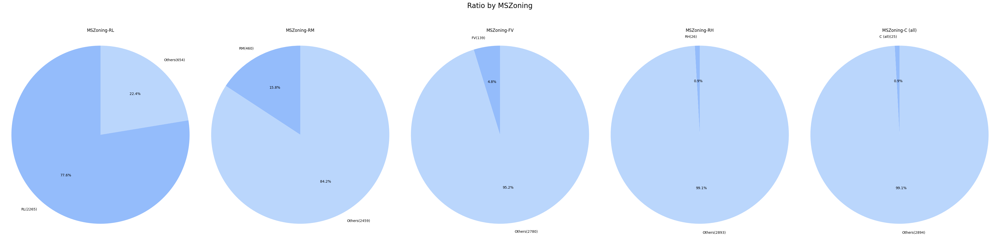

------------------------------------------------------------------------------------------------------------------------
        Street  Ratio (%)
Street                   
Pave      2907     99.589
Grvl        12      0.411
------------------------------------------------------------------------------------------------------------------------


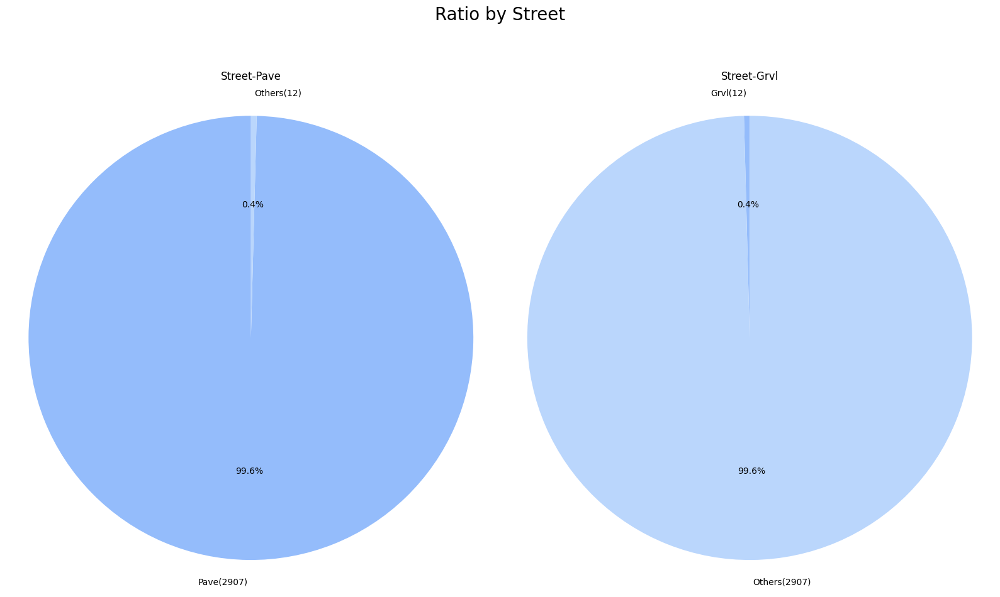

------------------------------------------------------------------------------------------------------------------------
       Alley  Ratio (%)
Alley                  
Grvl     120      4.111
Pave      78      2.672
------------------------------------------------------------------------------------------------------------------------


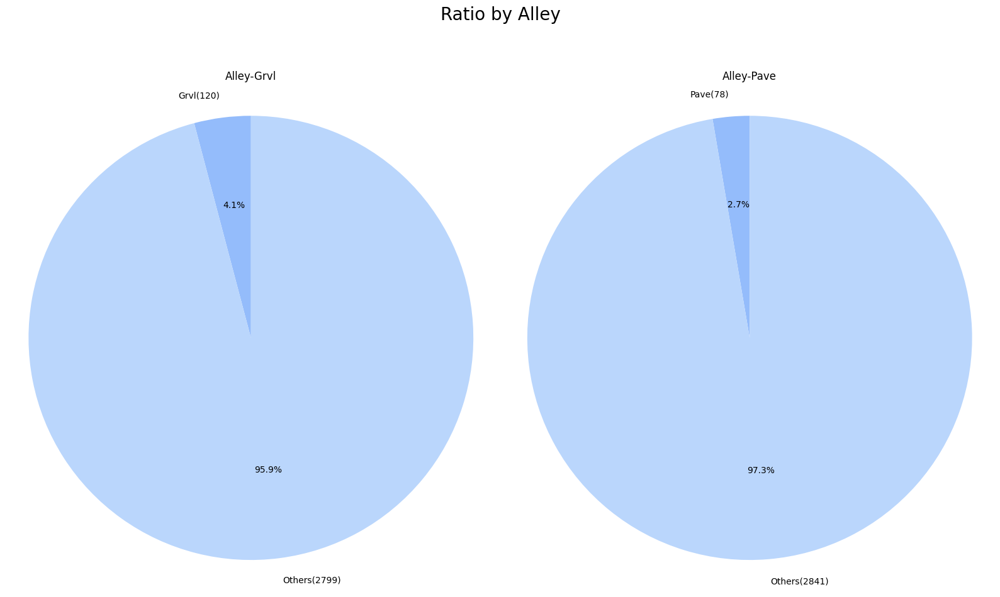

------------------------------------------------------------------------------------------------------------------------
          LotShape  Ratio (%)
LotShape                     
Reg           1859     63.686
IR1            968     33.162
IR2             76      2.604
IR3             16      0.548
------------------------------------------------------------------------------------------------------------------------


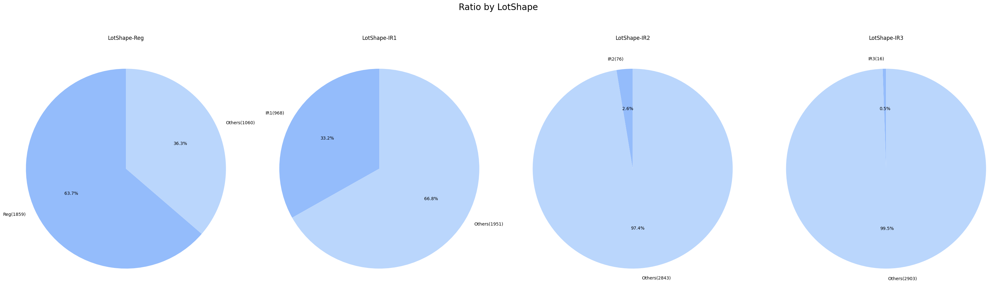

------------------------------------------------------------------------------------------------------------------------
             LandContour  Ratio (%)
LandContour                        
Lvl                 2622     89.825
HLS                  120      4.111
Bnk                  117      4.008
Low                   60      2.055
------------------------------------------------------------------------------------------------------------------------


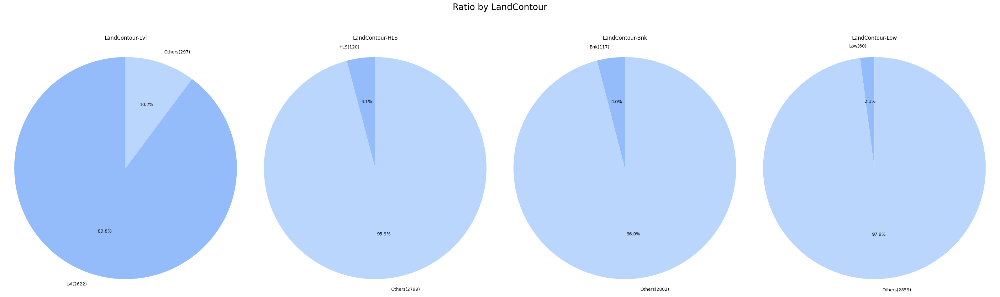

------------------------------------------------------------------------------------------------------------------------
           Utilities  Ratio (%)
Utilities                      
AllPub          2916     99.897
NoSeWa             1      0.034
------------------------------------------------------------------------------------------------------------------------


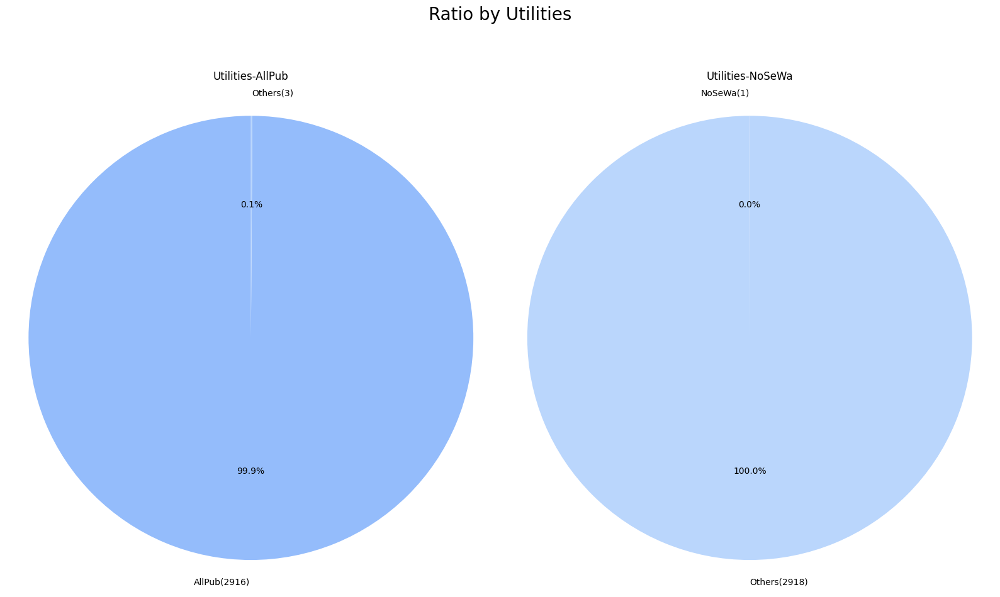

------------------------------------------------------------------------------------------------------------------------
           LotConfig  Ratio (%)
LotConfig                      
Inside          2133     73.073
Corner           511     17.506
CulDSac          176      6.029
FR2               85      2.912
FR3               14      0.480
------------------------------------------------------------------------------------------------------------------------


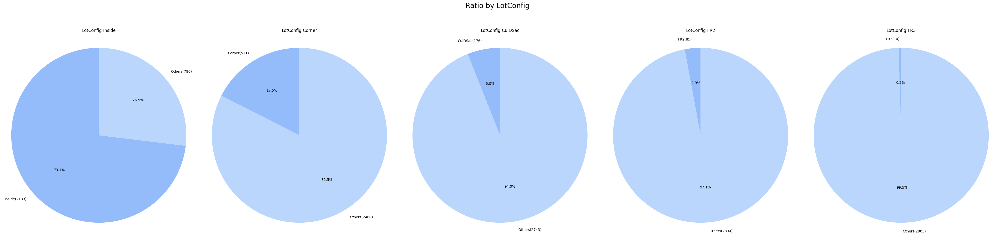

------------------------------------------------------------------------------------------------------------------------
           LandSlope  Ratio (%)
LandSlope                      
Gtl             2778     95.170
Mod              125      4.282
Sev               16      0.548
------------------------------------------------------------------------------------------------------------------------


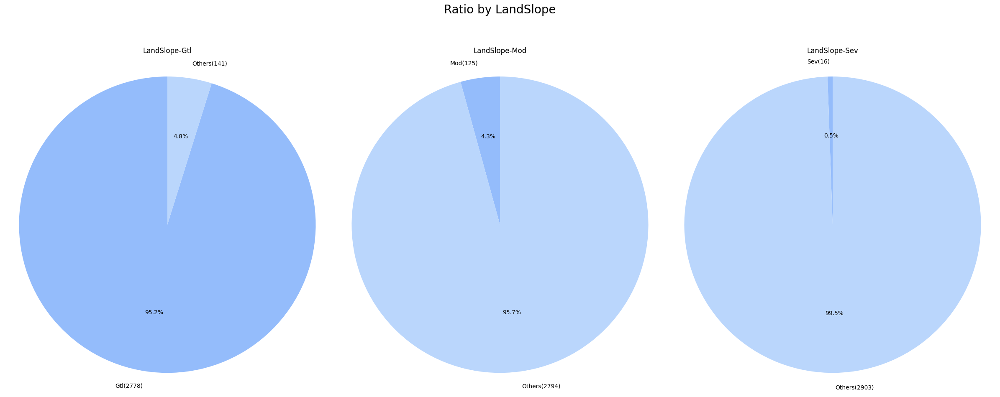

------------------------------------------------------------------------------------------------------------------------
              Neighborhood  Ratio (%)
Neighborhood                         
NAmes                  443     15.176
CollgCr                267      9.147
OldTown                239      8.188
Edwards                194      6.646
Somerst                182      6.235
NridgHt                166      5.687
Gilbert                165      5.653
Sawyer                 151      5.173
NWAmes                 131      4.488
SawyerW                125      4.282
Mitchel                114      3.905
BrkSide                108      3.700
Crawfor                103      3.529
IDOTRR                  93      3.186
Timber                  72      2.467
NoRidge                 71      2.432
StoneBr                 51      1.747
SWISU                   48      1.644
ClearCr                 44      1.507
MeadowV                 37      1.268
BrDale                  30      1.028
Blmng

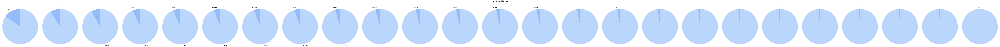

------------------------------------------------------------------------------------------------------------------------
            Condition1  Ratio (%)
Condition1                       
Norm              2511     86.023
Feedr              164      5.618
Artery              92      3.152
RRAn                50      1.713
PosN                39      1.336
RRAe                28      0.959
PosA                20      0.685
RRNn                 9      0.308
RRNe                 6      0.206
------------------------------------------------------------------------------------------------------------------------


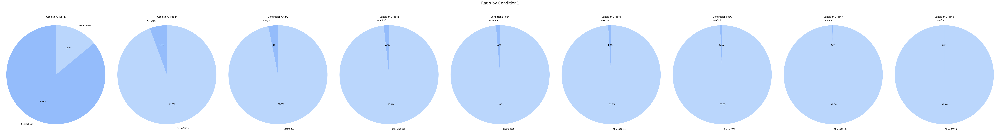

------------------------------------------------------------------------------------------------------------------------
            Condition2  Ratio (%)
Condition2                       
Norm              2889     98.972
Feedr               13      0.445
Artery               5      0.171
PosN                 4      0.137
PosA                 4      0.137
RRNn                 2      0.069
RRAn                 1      0.034
RRAe                 1      0.034
------------------------------------------------------------------------------------------------------------------------


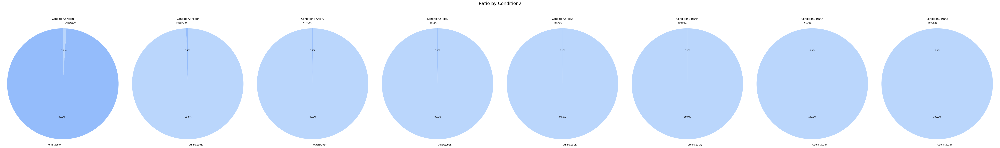

------------------------------------------------------------------------------------------------------------------------
          BldgType  Ratio (%)
BldgType                     
1Fam          2425     83.076
TwnhsE         227      7.777
Duplex         109      3.734
Twnhs           96      3.289
2fmCon          62      2.124
------------------------------------------------------------------------------------------------------------------------


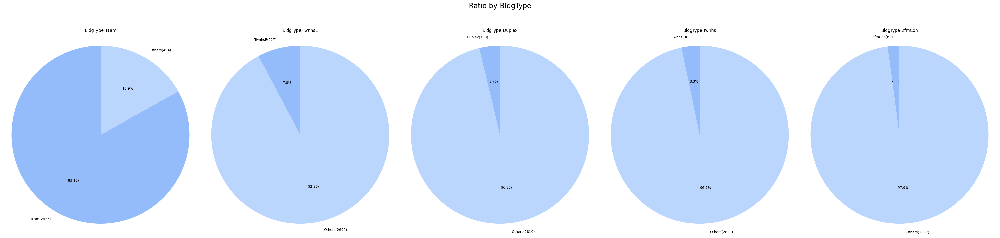

------------------------------------------------------------------------------------------------------------------------
            HouseStyle  Ratio (%)
HouseStyle                       
1Story            1471     50.394
2Story             872     29.873
1.5Fin             314     10.757
SLvl               128      4.385
SFoyer              83      2.843
2.5Unf              24      0.822
1.5Unf              19      0.651
2.5Fin               8      0.274
------------------------------------------------------------------------------------------------------------------------


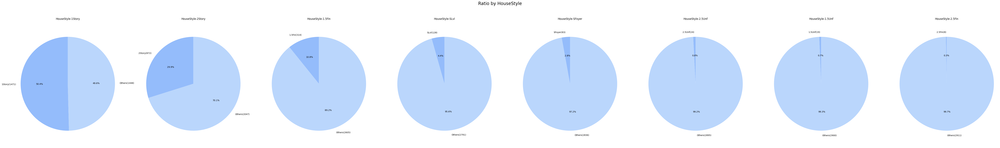

------------------------------------------------------------------------------------------------------------------------
           RoofStyle  Ratio (%)
RoofStyle                      
Gable           2310     79.137
Hip              551     18.876
Gambrel           22      0.754
Flat              20      0.685
Mansard           11      0.377
Shed               5      0.171
------------------------------------------------------------------------------------------------------------------------


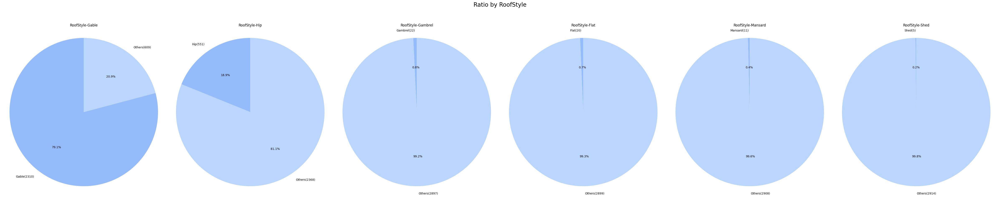

------------------------------------------------------------------------------------------------------------------------
          RoofMatl  Ratio (%)
RoofMatl                     
CompShg       2876     98.527
Tar&Grv         23      0.788
WdShake          9      0.308
WdShngl          7      0.240
Metal            1      0.034
Membran          1      0.034
Roll             1      0.034
ClyTile          1      0.034
------------------------------------------------------------------------------------------------------------------------


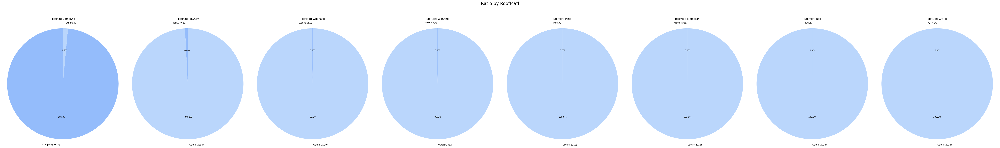

------------------------------------------------------------------------------------------------------------------------
             Exterior1st  Ratio (%)
Exterior1st                        
VinylSd             1025     35.115
MetalSd              450     15.416
HdBoard              442     15.142
Wd Sdng              411     14.080
Plywood              221      7.571
CemntBd              126      4.317
BrkFace               87      2.980
WdShing               56      1.918
AsbShng               44      1.507
Stucco                43      1.473
BrkComm                6      0.206
AsphShn                2      0.069
Stone                  2      0.069
CBlock                 2      0.069
ImStucc                1      0.034
------------------------------------------------------------------------------------------------------------------------


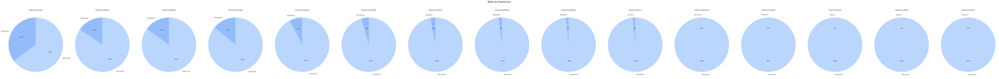

------------------------------------------------------------------------------------------------------------------------
             Exterior2nd  Ratio (%)
Exterior2nd                        
VinylSd             1014     34.738
MetalSd              447     15.313
HdBoard              406     13.909
Wd Sdng              391     13.395
Plywood              270      9.250
CmentBd              126      4.317
Wd Shng               81      2.775
BrkFace               47      1.610
Stucco                47      1.610
AsbShng               38      1.302
Brk Cmn               22      0.754
ImStucc               15      0.514
Stone                  6      0.206
AsphShn                4      0.137
CBlock                 3      0.103
Other                  1      0.034
------------------------------------------------------------------------------------------------------------------------


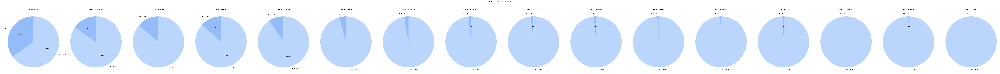

------------------------------------------------------------------------------------------------------------------------
            MasVnrType  Ratio (%)
MasVnrType                       
BrkFace            879     30.113
Stone              249      8.530
BrkCmn              25      0.856
------------------------------------------------------------------------------------------------------------------------


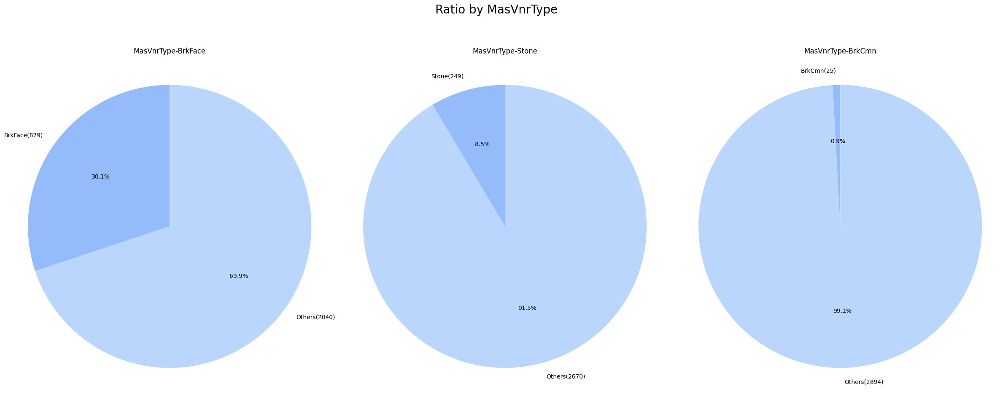

------------------------------------------------------------------------------------------------------------------------
           ExterQual  Ratio (%)
ExterQual                      
TA              1798     61.596
Gd               979     33.539
Ex               107      3.666
Fa                35      1.199
------------------------------------------------------------------------------------------------------------------------


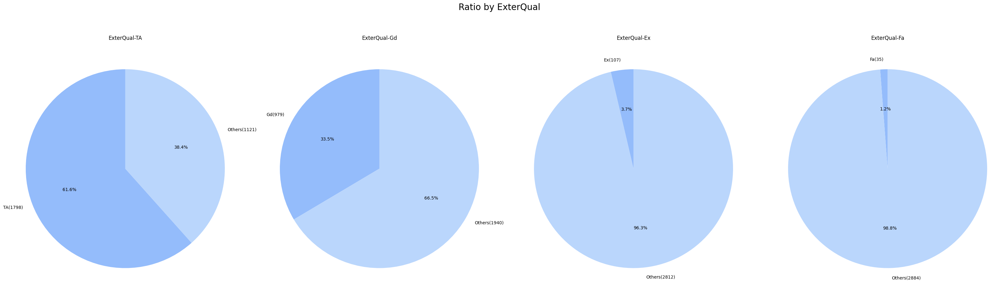

------------------------------------------------------------------------------------------------------------------------
           ExterCond  Ratio (%)
ExterCond                      
TA              2538     86.948
Gd               299     10.243
Fa                67      2.295
Ex                12      0.411
Po                 3      0.103
------------------------------------------------------------------------------------------------------------------------


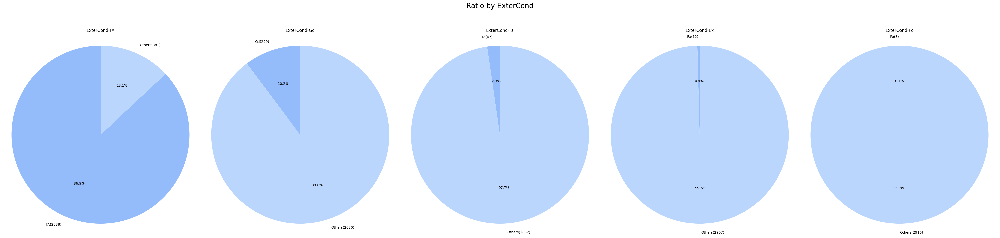

------------------------------------------------------------------------------------------------------------------------
            Foundation  Ratio (%)
Foundation                       
PConc             1308     44.810
CBlock            1235     42.309
BrkTil             311     10.654
Slab                49      1.679
Stone               11      0.377
Wood                 5      0.171
------------------------------------------------------------------------------------------------------------------------


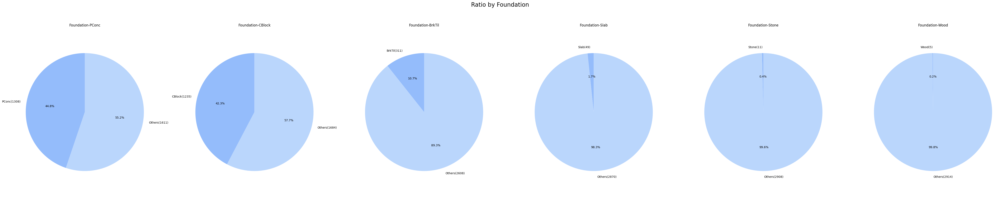

------------------------------------------------------------------------------------------------------------------------
          BsmtQual  Ratio (%)
BsmtQual                     
TA            1283     43.953
Gd            1209     41.418
Ex             258      8.839
Fa              88      3.015
------------------------------------------------------------------------------------------------------------------------


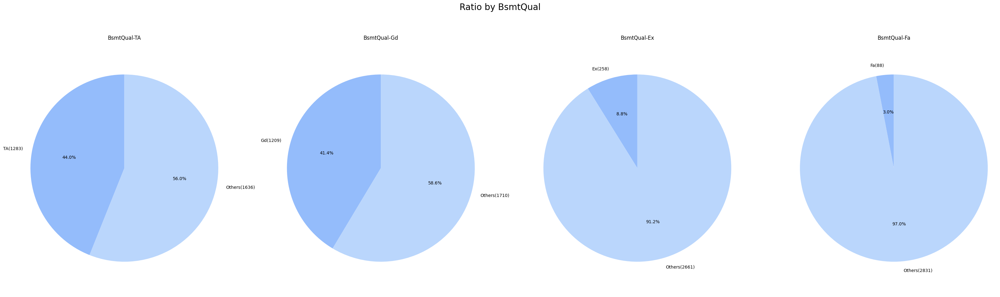

------------------------------------------------------------------------------------------------------------------------
          BsmtCond  Ratio (%)
BsmtCond                     
TA            2606     89.277
Gd             122      4.180
Fa             104      3.563
Po               5      0.171
------------------------------------------------------------------------------------------------------------------------


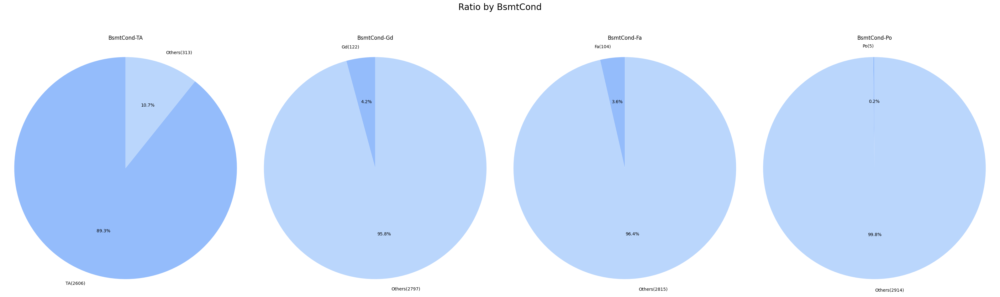

------------------------------------------------------------------------------------------------------------------------
              BsmtExposure  Ratio (%)
BsmtExposure                         
No                    1904     65.228
Av                     418     14.320
Gd                     276      9.455
Mn                     239      8.188
------------------------------------------------------------------------------------------------------------------------


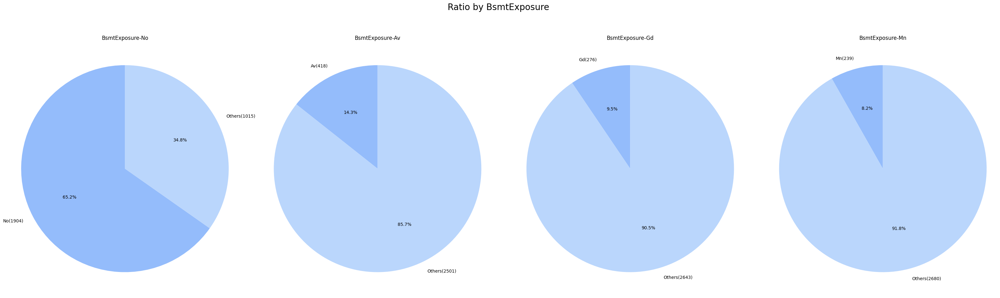

------------------------------------------------------------------------------------------------------------------------
              BsmtFinType1  Ratio (%)
BsmtFinType1                         
Unf                    851     29.154
GLQ                    849     29.085
ALQ                    429     14.697
Rec                    288      9.866
BLQ                    269      9.215
LwQ                    154      5.276
------------------------------------------------------------------------------------------------------------------------


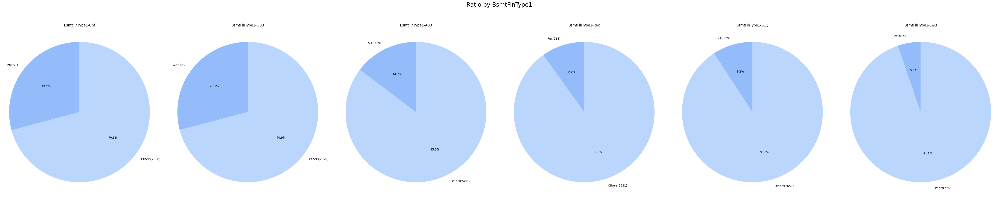

------------------------------------------------------------------------------------------------------------------------
              BsmtFinType2  Ratio (%)
BsmtFinType2                         
Unf                   2493     85.406
Rec                    105      3.597
LwQ                     87      2.980
BLQ                     68      2.330
ALQ                     52      1.781
GLQ                     34      1.165
------------------------------------------------------------------------------------------------------------------------


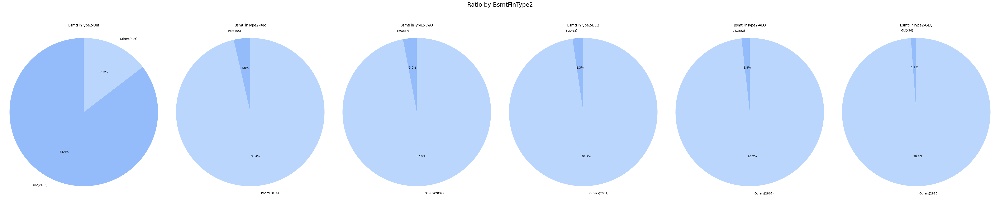

------------------------------------------------------------------------------------------------------------------------
         Heating  Ratio (%)
Heating                    
GasA        2874     98.458
GasW          27      0.925
Grav           9      0.308
Wall           6      0.206
OthW           2      0.069
Floor          1      0.034
------------------------------------------------------------------------------------------------------------------------


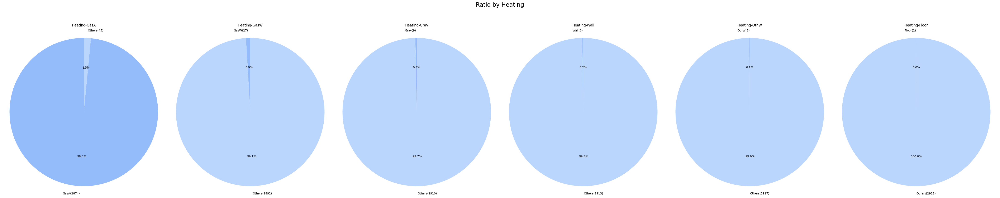

------------------------------------------------------------------------------------------------------------------------
           HeatingQC  Ratio (%)
HeatingQC                      
Ex              1493     51.148
TA               857     29.359
Gd               474     16.238
Fa                92      3.152
Po                 3      0.103
------------------------------------------------------------------------------------------------------------------------


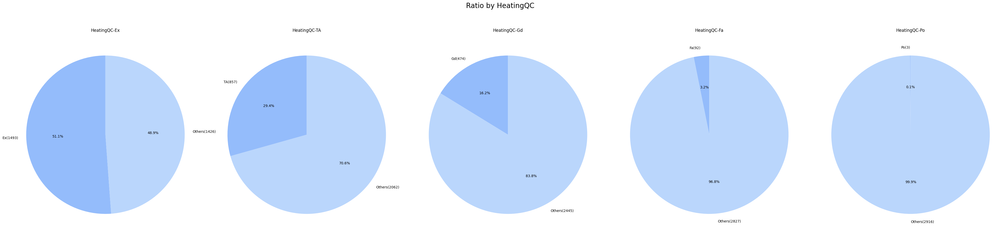

------------------------------------------------------------------------------------------------------------------------
            CentralAir  Ratio (%)
CentralAir                       
Y                 2723     93.285
N                  196      6.715
------------------------------------------------------------------------------------------------------------------------


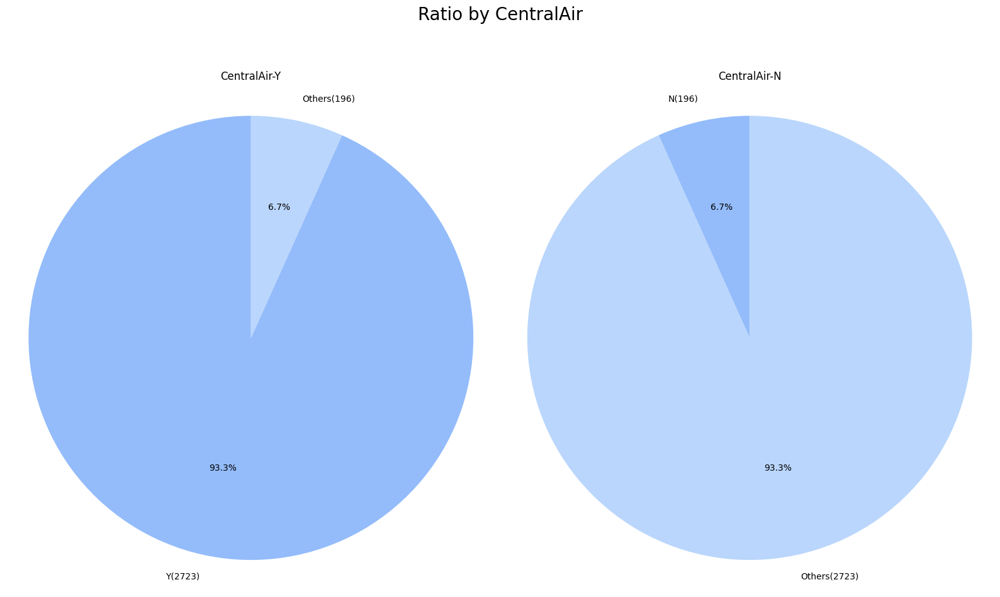

------------------------------------------------------------------------------------------------------------------------
            Electrical  Ratio (%)
Electrical                       
SBrkr             2671     91.504
FuseA              188      6.441
FuseF               50      1.713
FuseP                8      0.274
Mix                  1      0.034
------------------------------------------------------------------------------------------------------------------------


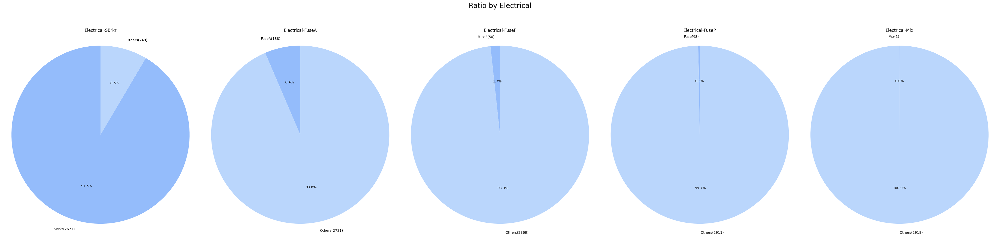

------------------------------------------------------------------------------------------------------------------------
             KitchenQual  Ratio (%)
KitchenQual                        
TA                  1492     51.113
Gd                  1151     39.431
Ex                   205      7.023
Fa                    70      2.398
------------------------------------------------------------------------------------------------------------------------


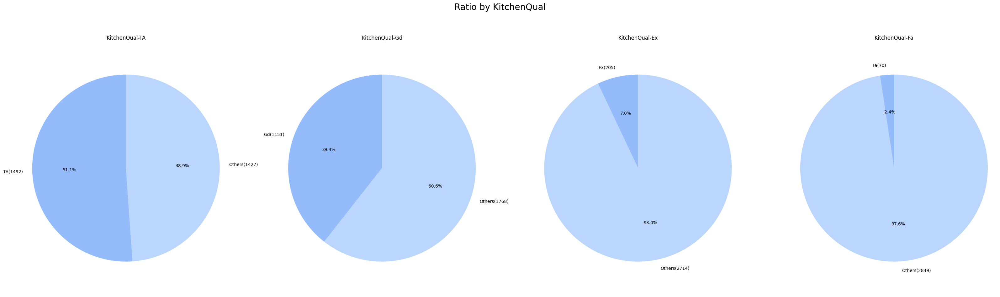

------------------------------------------------------------------------------------------------------------------------
            Functional  Ratio (%)
Functional                       
Typ               2717     93.080
Min2                70      2.398
Min1                65      2.227
Mod                 35      1.199
Maj1                19      0.651
Maj2                 9      0.308
Sev                  2      0.069
------------------------------------------------------------------------------------------------------------------------


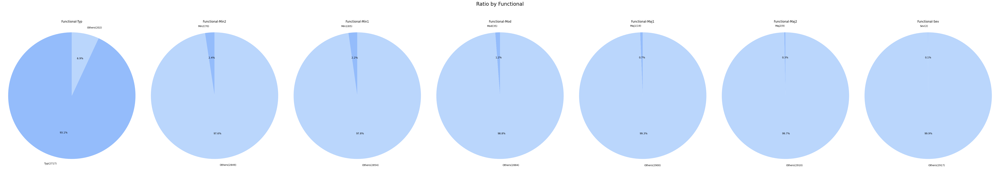

------------------------------------------------------------------------------------------------------------------------
             FireplaceQu  Ratio (%)
FireplaceQu                        
Gd                   744     25.488
TA                   592     20.281
Fa                    74      2.535
Po                    46      1.576
Ex                    43      1.473
------------------------------------------------------------------------------------------------------------------------


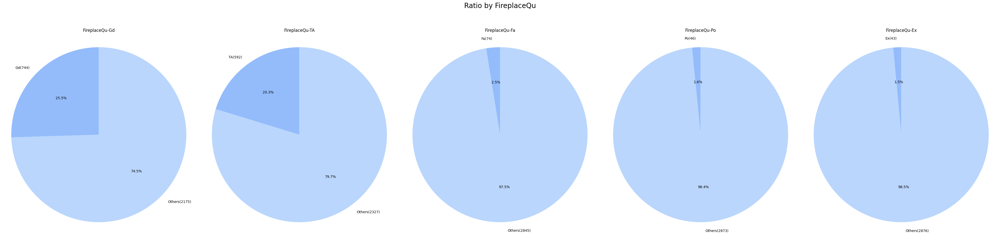

------------------------------------------------------------------------------------------------------------------------
            GarageType  Ratio (%)
GarageType                       
Attchd            1723     59.027
Detchd             779     26.687
BuiltIn            186      6.372
Basment             36      1.233
2Types              23      0.788
CarPort             15      0.514
------------------------------------------------------------------------------------------------------------------------


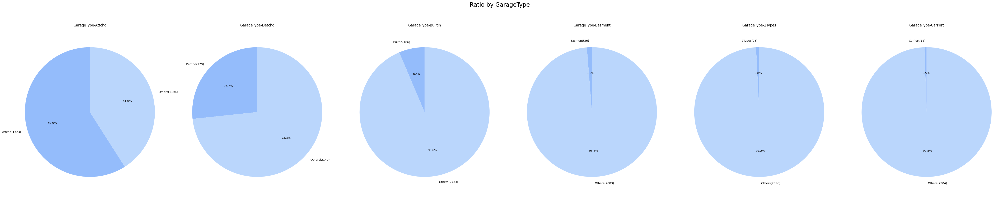

------------------------------------------------------------------------------------------------------------------------
              GarageFinish  Ratio (%)
GarageFinish                         
Unf                   1230     42.138
RFn                    811     27.783
Fin                    719     24.632
------------------------------------------------------------------------------------------------------------------------


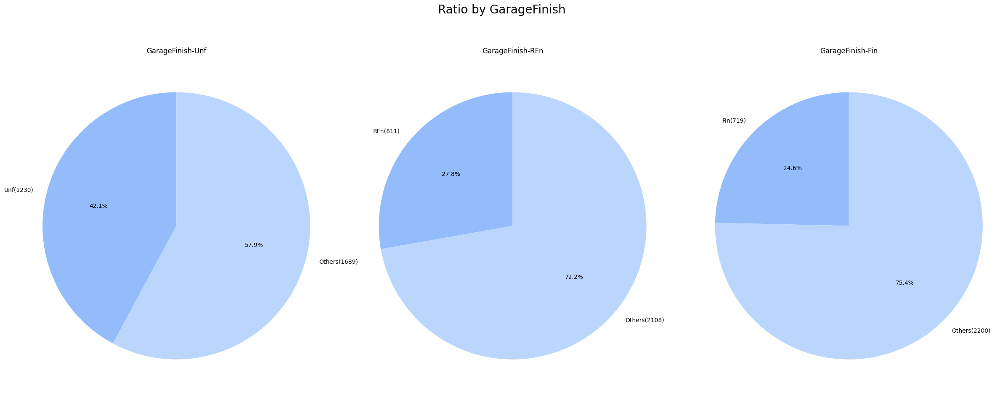

------------------------------------------------------------------------------------------------------------------------
            GarageQual  Ratio (%)
GarageQual                       
TA                2604     89.209
Fa                 124      4.248
Gd                  24      0.822
Po                   5      0.171
Ex                   3      0.103
------------------------------------------------------------------------------------------------------------------------


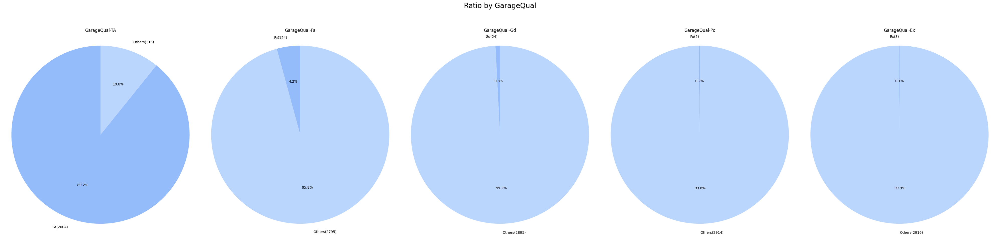

------------------------------------------------------------------------------------------------------------------------
            GarageCond  Ratio (%)
GarageCond                       
TA                2654     90.922
Fa                  74      2.535
Gd                  15      0.514
Po                  14      0.480
Ex                   3      0.103
------------------------------------------------------------------------------------------------------------------------


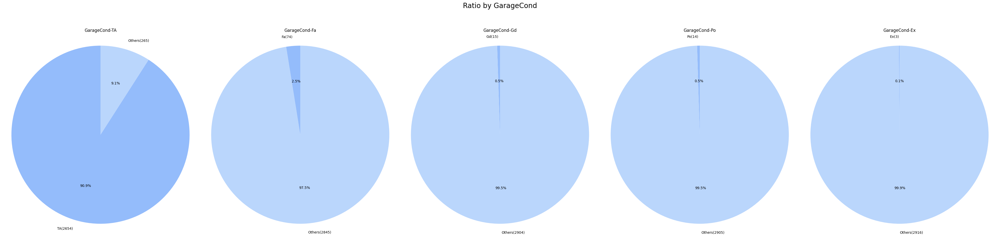

------------------------------------------------------------------------------------------------------------------------
            PavedDrive  Ratio (%)
PavedDrive                       
Y                 2641     90.476
N                  216      7.400
P                   62      2.124
------------------------------------------------------------------------------------------------------------------------


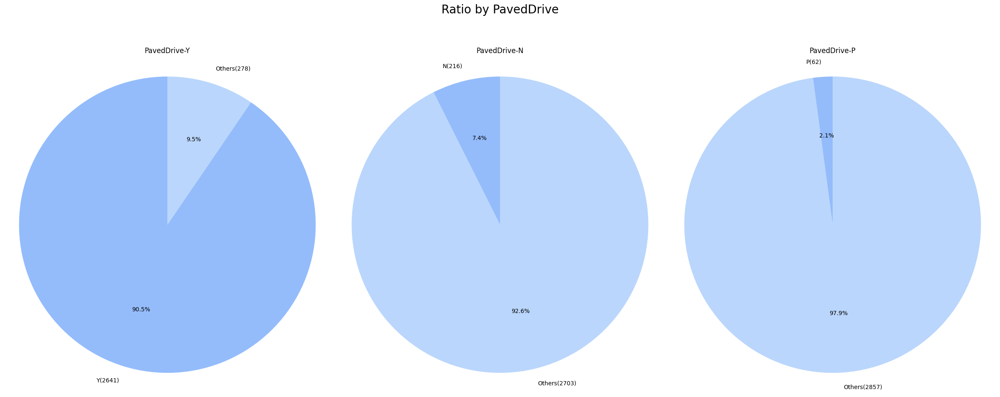

------------------------------------------------------------------------------------------------------------------------
        PoolQC  Ratio (%)
PoolQC                   
Ex           4      0.137
Gd           4      0.137
Fa           2      0.069
------------------------------------------------------------------------------------------------------------------------


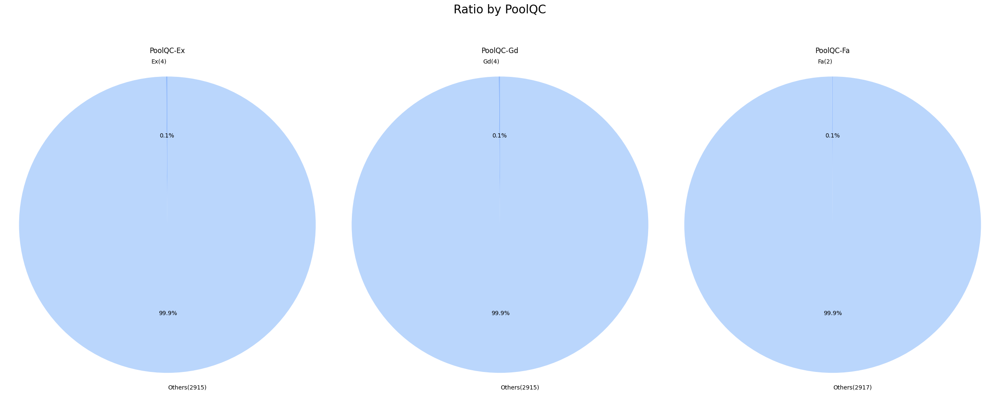

------------------------------------------------------------------------------------------------------------------------
       Fence  Ratio (%)
Fence                  
MnPrv    329     11.271
GdPrv    118      4.042
GdWo     112      3.837
MnWw      12      0.411
------------------------------------------------------------------------------------------------------------------------


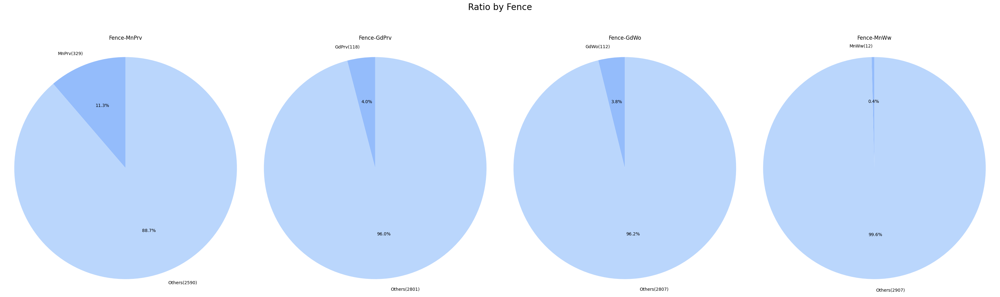

------------------------------------------------------------------------------------------------------------------------
             MiscFeature  Ratio (%)
MiscFeature                        
Shed                  95      3.255
Gar2                   5      0.171
Othr                   4      0.137
TenC                   1      0.034
------------------------------------------------------------------------------------------------------------------------


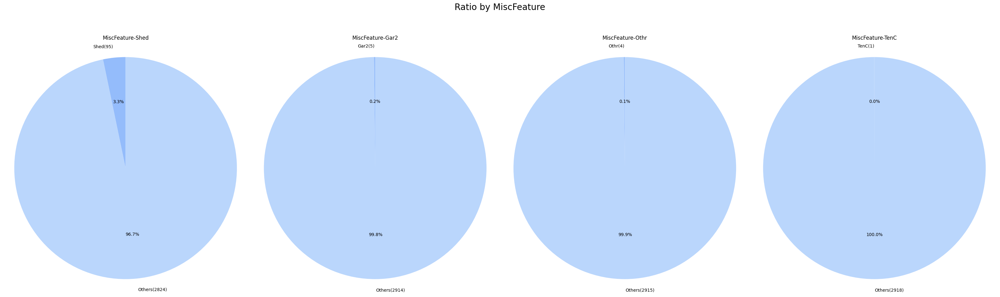

------------------------------------------------------------------------------------------------------------------------
          SaleType  Ratio (%)
SaleType                     
WD            2525     86.502
New            239      8.188
COD             87      2.980
ConLD           26      0.891
CWD             12      0.411
ConLI            9      0.308
ConLw            8      0.274
Oth              7      0.240
Con              5      0.171
------------------------------------------------------------------------------------------------------------------------


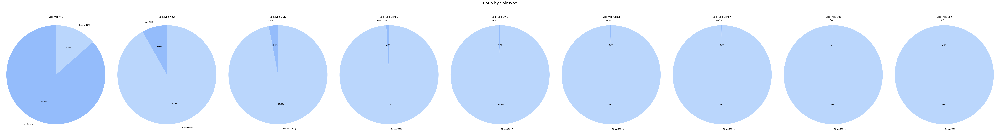

------------------------------------------------------------------------------------------------------------------------
               SaleCondition  Ratio (%)
SaleCondition                          
Normal                  2402     82.288
Partial                  245      8.393
Abnorml                  190      6.509
Family                    46      1.576
Alloca                    24      0.822
AdjLand                   12      0.411
------------------------------------------------------------------------------------------------------------------------


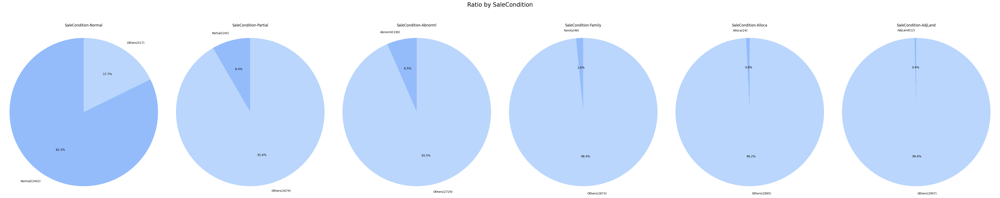

------------------------------------------------------------------------------------------------------------------------
             OverallCond  Ratio (%)
OverallCond                        
5                   1645     56.355
6                    531     18.191
7                    390     13.361
8                    144      4.933
4                    101      3.460
3                     50      1.713
9                     41      1.405
2                     10      0.343
1                      7      0.240
------------------------------------------------------------------------------------------------------------------------


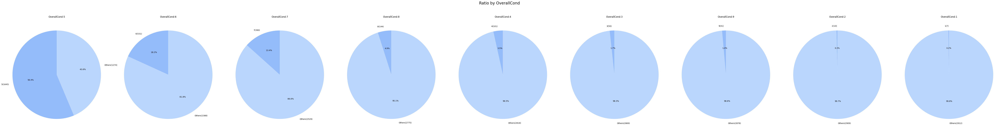

------------------------------------------------------------------------------------------------------------------------
              BsmtFullBath  Ratio (%)
BsmtFullBath                         
0.000                 1705     58.410
1.000                 1172     40.151
2.000                   38      1.302
3.000                    2      0.069
------------------------------------------------------------------------------------------------------------------------


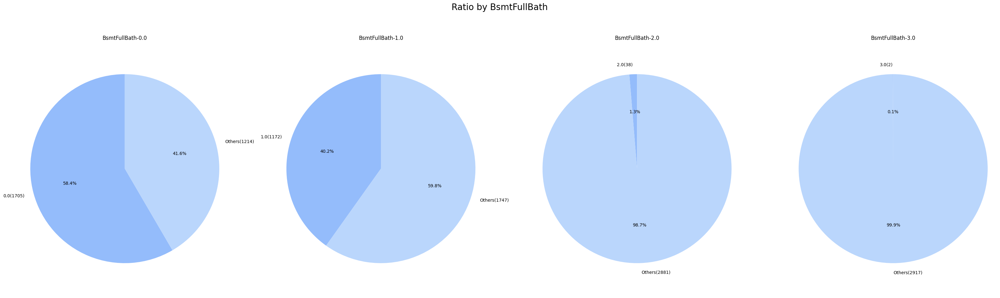

------------------------------------------------------------------------------------------------------------------------
              BsmtHalfBath  Ratio (%)
BsmtHalfBath                         
0.000                 2742     93.936
1.000                  171      5.858
2.000                    4      0.137
------------------------------------------------------------------------------------------------------------------------


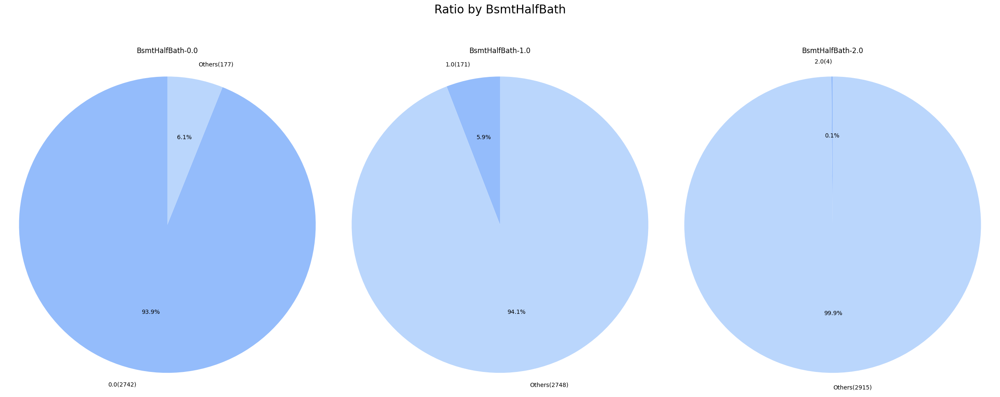

------------------------------------------------------------------------------------------------------------------------
          FullBath  Ratio (%)
FullBath                     
2             1530     52.415
1             1309     44.844
3               64      2.193
0               12      0.411
4                4      0.137
------------------------------------------------------------------------------------------------------------------------


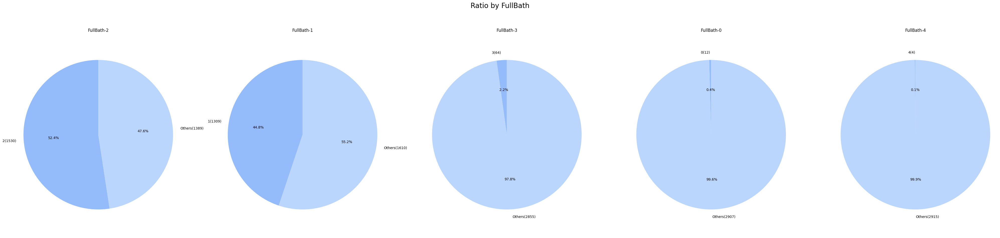

------------------------------------------------------------------------------------------------------------------------
          HalfBath  Ratio (%)
HalfBath                     
0             1834     62.830
1             1060     36.314
2               25      0.856
------------------------------------------------------------------------------------------------------------------------


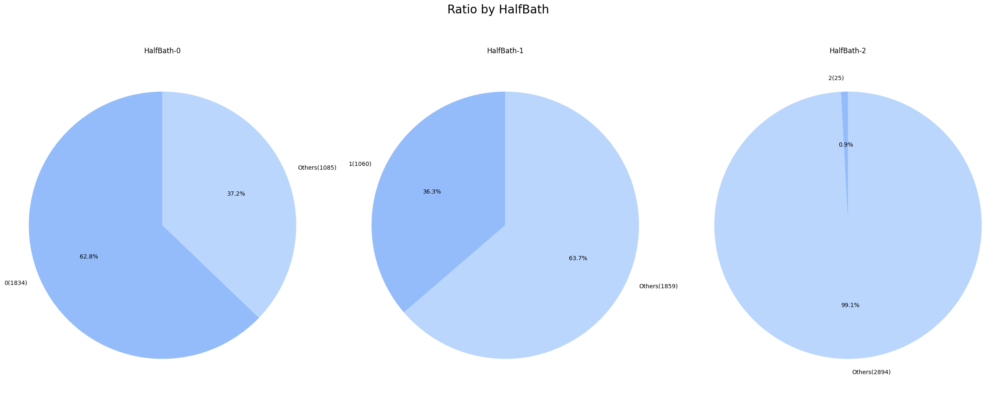

------------------------------------------------------------------------------------------------------------------------
              BedroomAbvGr  Ratio (%)
BedroomAbvGr                         
3                     1596     54.676
2                      742     25.420
4                      400     13.703
1                      103      3.529
5                       48      1.644
6                       21      0.719
0                        8      0.274
8                        1      0.034
------------------------------------------------------------------------------------------------------------------------


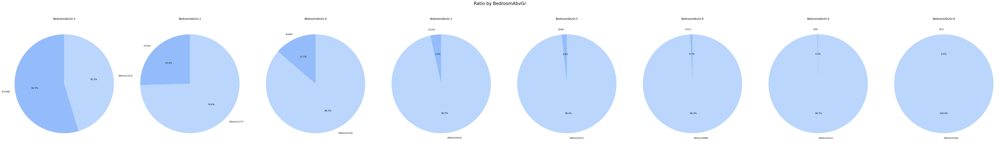

------------------------------------------------------------------------------------------------------------------------
              KitchenAbvGr  Ratio (%)
KitchenAbvGr                         
1                     2785     95.409
2                      129      4.419
0                        3      0.103
3                        2      0.069
------------------------------------------------------------------------------------------------------------------------


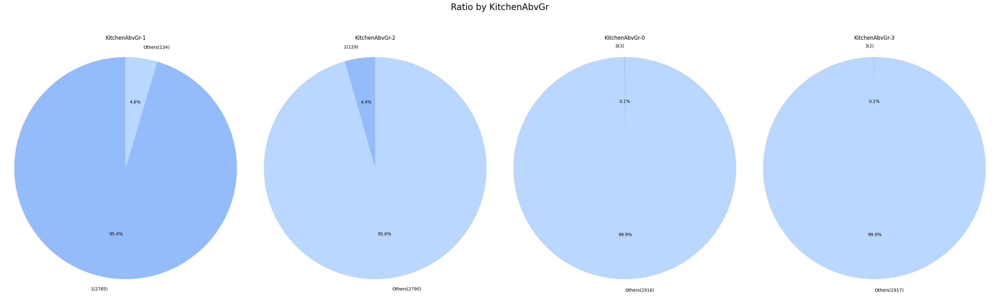

------------------------------------------------------------------------------------------------------------------------
            Fireplaces  Ratio (%)
Fireplaces                       
0                 1420     48.647
1                 1268     43.440
2                  219      7.503
3                   11      0.377
4                    1      0.034
------------------------------------------------------------------------------------------------------------------------


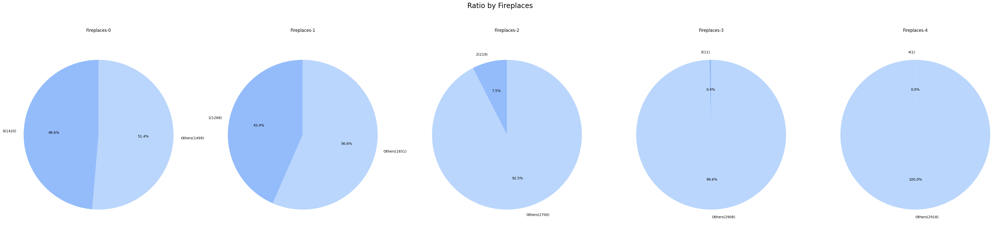

------------------------------------------------------------------------------------------------------------------------
            GarageCars  Ratio (%)
GarageCars                       
2.000             1594     54.608
1.000              776     26.584
3.000              374     12.813
0.000              157      5.379
4.000               16      0.548
5.000                1      0.034
------------------------------------------------------------------------------------------------------------------------


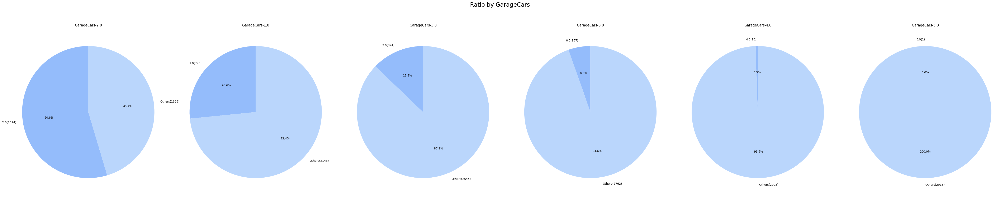

------------------------------------------------------------------------------------------------------------------------
        YrSold  Ratio (%)
YrSold                   
2007       692     23.707
2009       647     22.165
2008       622     21.309
2006       619     21.206
2010       339     11.614
------------------------------------------------------------------------------------------------------------------------


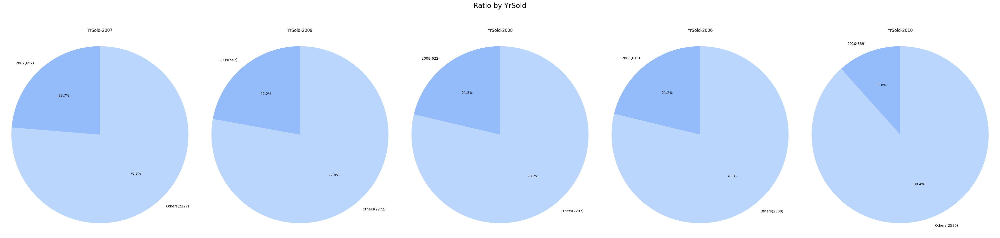

In [11]:
for col in cat_cols:
    to_analysis_cat(df,col,ratio=True,plot=True)

# NUMERICAL VARIABLES ANALYSIS
Function to summarize and optionally plot numerical variables.

In [12]:
def to_analysis_num(df,n_cols,bins=20,describeT=False,plot=False):
    if describeT:
        quantiles=[0.05,0.25,0.5,0.75,0.95,0.99]
        print(df[n_cols].describe(percentiles=quantiles).T)
    if plot:
        col_len = len(n_cols)
        fig, axs = plt.subplots(nrows=1, ncols=col_len, figsize=(6 * col_len, 6))
        
        if col_len == 1:
            axs = [axs]
        for i, col in enumerate(n_cols):
            # Histogram
            n, bins_hist, patches = axs[i].hist(df[col], 
                                                bins=bins, density=True, 
                                                label=col, edgecolor='black', 
                                                alpha=0.9, color='#bad6fc')
            #Density
            density = 1/(df[col].std() * (2 * np.pi)**0.5) * np.exp(-(bins_hist - df[col].mean())**2 / (2 * df[col].std()**2))
            axs[i].plot(bins_hist, density, color='#b1cffc', linewidth=2, label='Density')

            axs[i].set_title(f'Distribution of {col} Variable')
            axs[i].set_xlabel(col)
            axs[i].set_ylabel('Frequency / Density')
            axs[i].legend(loc='upper right')
            axs[i].grid(axis='y')
            
        plt.tight_layout()
        plt.show()


Loop through numerical columns to summarize and plot them.

                 count      mean      std      min       5%      25%      50%       75%       95%       99%        max
MSSubClass    2919.000    57.138   42.518   20.000   20.000   20.000   50.000    70.000   160.000   190.000    190.000
LotFrontage   2433.000    69.306   23.345   21.000   32.000   59.000   68.000    80.000   107.000   135.680    313.000
LotArea       2919.000 10168.114 7886.996 1300.000 3182.000 7478.000 9453.000 11570.000 17142.900 33038.640 215245.000
OverallQual   2919.000     6.089    1.410    1.000    4.000    5.000    6.000     7.000     8.000    10.000     10.000
YearBuilt     2919.000  1971.313   30.291 1872.000 1915.000 1953.500 1973.000  2001.000  2007.000  2008.000   2010.000
YearRemodAdd  2919.000  1984.264   20.894 1950.000 1950.000 1965.000 1993.000  2004.000  2007.000  2009.000   2010.000
MasVnrArea    2896.000   102.201  179.334    0.000    0.000    0.000    0.000   164.000   466.500   771.050   1600.000
BsmtFinSF1    2918.000   441.423  455.611    0.0

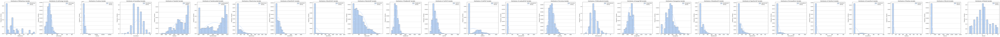

In [13]:
num_cols = [col for col in num_cols if 'SalePrice' not in col]
to_analysis_num(df,num_cols,describeT=True,plot=True)

# TARGET VARIABLES ANALYSIS
#### Analysis of Categorical Variables by Target
Function to compare the means, ratio, count of categorical variables by the target variable.

In [14]:
def cat_by_target(df, target, c_cols, plot=False):
    
    cat_tar = pd.DataFrame({'Target Mean': df.groupby(c_cols)[target].mean(), 
                            'Count': df[c_cols].value_counts(), 
                            'Ratio (%)': 100 * df[c_cols].value_counts() / len(df)})
    
    print('-' * 120)
    print(c_cols)
    print('-' * 120)
    print(cat_tar, end='\n\n\n')
    
    if plot:
        colors = ['#6c94dc','#b1cffc', '#94bcfb', '#c4dcfc']
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        
        
        values = df[c_cols].value_counts()
        sns.barplot(x=cat_tar.index, y=cat_tar['Target Mean'],palette=colors[:len(cat_tar)], ax=ax1)
        ax1.set_title(f'Target Mean by {c_cols}')
        ax1.set_ylabel('Target Mean')
        ax1.tick_params(axis='x', rotation=30)
        
        
        ax2.pie(x=cat_tar['Count'], labels=cat_tar.index, startangle=90, colors=colors[:len(values)])
        ax2.set_title(f'Ratio by {c_cols}')
        ax2.legend(labels=[f'{index} - {row["Ratio (%)"]:.2f}%'for index, row in cat_tar.iterrows()],
                   loc='center left', bbox_to_anchor=(1, 0, 0.5, 1))
        
        plt.subplots_adjust(wspace=0.4, hspace=0.4)
        plt.tight_layout()
        plt.show()

To execute the function for each categorical column.

------------------------------------------------------------------------------------------------------------------------
MSZoning
------------------------------------------------------------------------------------------------------------------------
          Target Mean  Count  Ratio (%)
MSZoning                               
C (all)     74528.000     25      0.856
FV         214014.062    139      4.762
RH         131558.375     26      0.891
RL         191004.995   2265     77.595
RM         126316.830    460     15.759




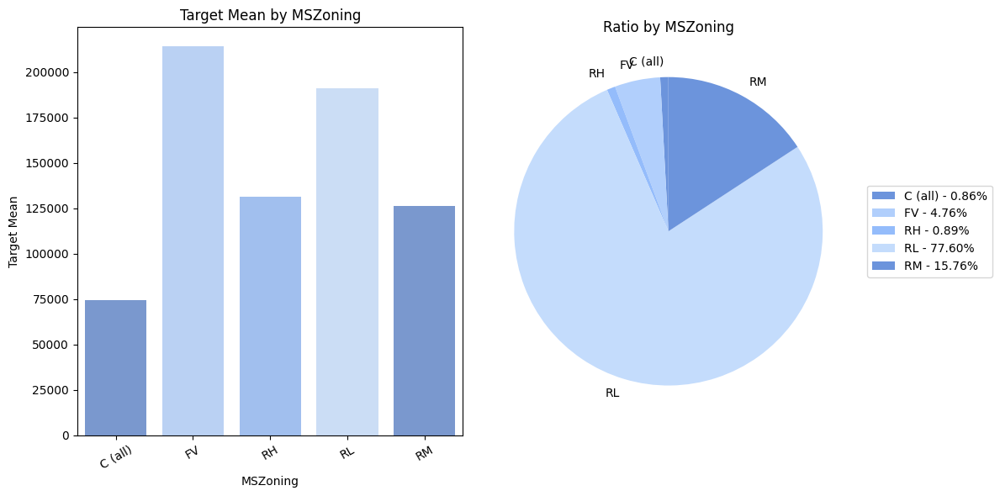

------------------------------------------------------------------------------------------------------------------------
Street
------------------------------------------------------------------------------------------------------------------------
        Target Mean  Count  Ratio (%)
Street                               
Grvl     130190.500     12      0.411
Pave     181130.539   2907     99.589




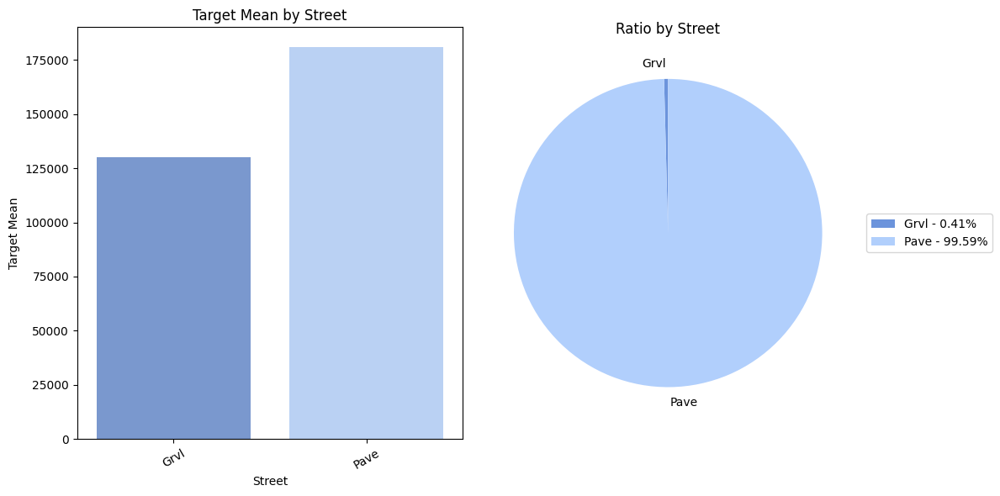

------------------------------------------------------------------------------------------------------------------------
Alley
------------------------------------------------------------------------------------------------------------------------
       Target Mean  Count  Ratio (%)
Alley                               
Grvl    122219.080    120      4.111
Pave    168000.585     78      2.672




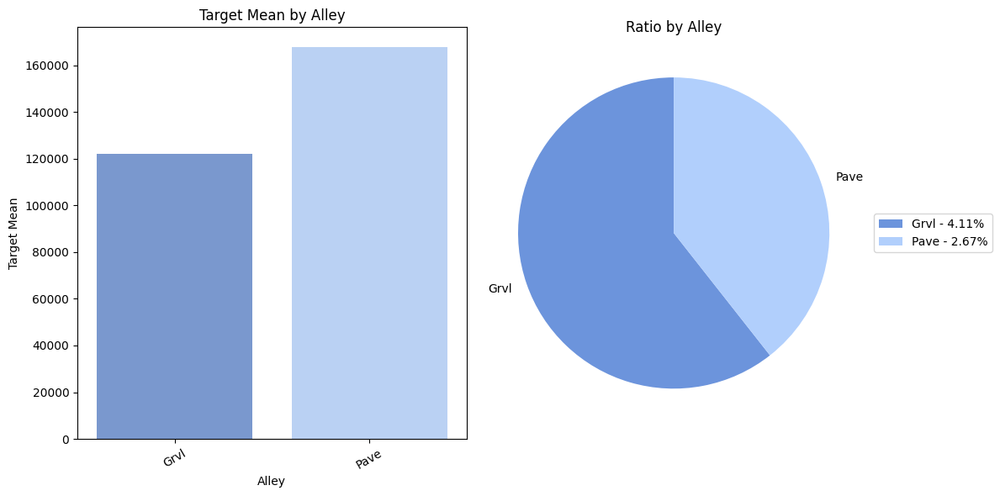

------------------------------------------------------------------------------------------------------------------------
LotShape
------------------------------------------------------------------------------------------------------------------------
          Target Mean  Count  Ratio (%)
LotShape                               
IR1        206101.665    968     33.162
IR2        239833.366     76      2.604
IR3        216036.500     16      0.548
Reg        164754.818   1859     63.686




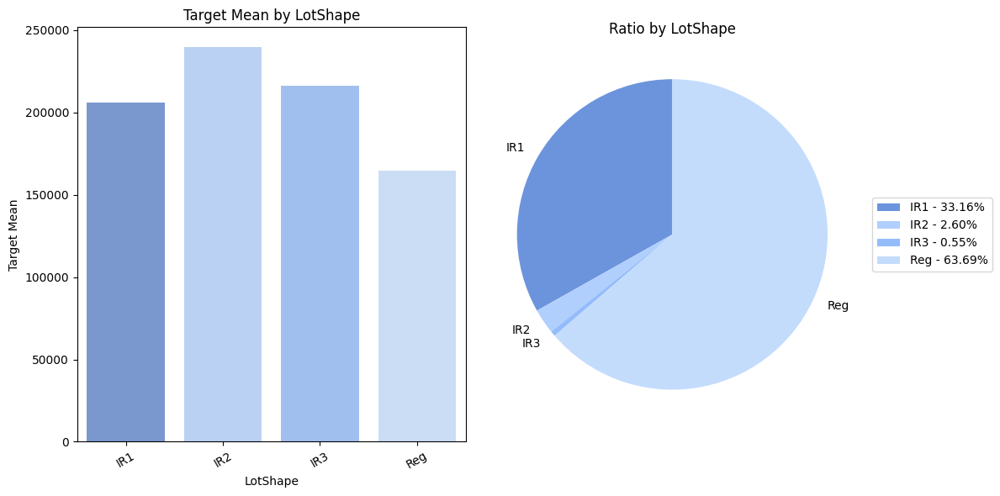

------------------------------------------------------------------------------------------------------------------------
LandContour
------------------------------------------------------------------------------------------------------------------------
             Target Mean  Count  Ratio (%)
LandContour                               
Bnk           143104.079    117      4.008
HLS           231533.940    120      4.111
Low           203661.111     60      2.055
Lvl           180183.747   2622     89.825




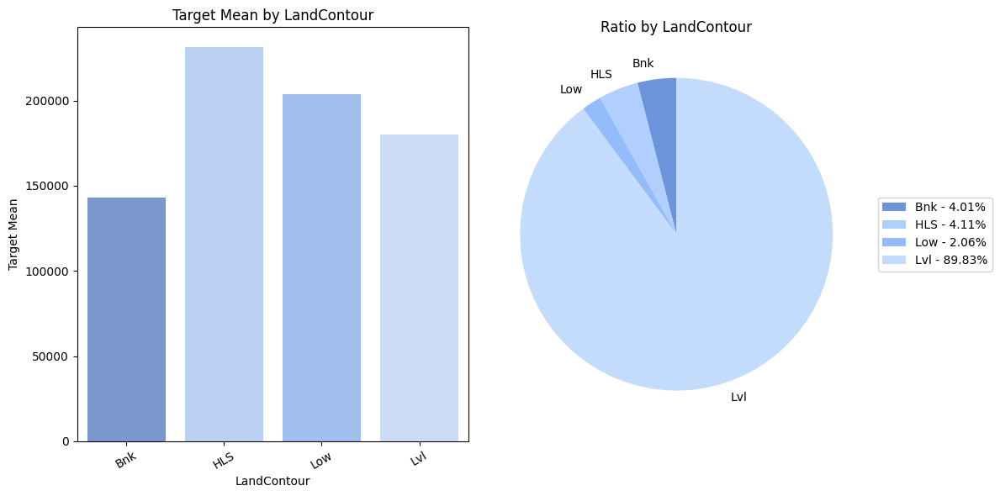

------------------------------------------------------------------------------------------------------------------------
Utilities
------------------------------------------------------------------------------------------------------------------------
           Target Mean  Count  Ratio (%)
Utilities                               
AllPub      180950.957   2916     99.897
NoSeWa      137500.000      1      0.034




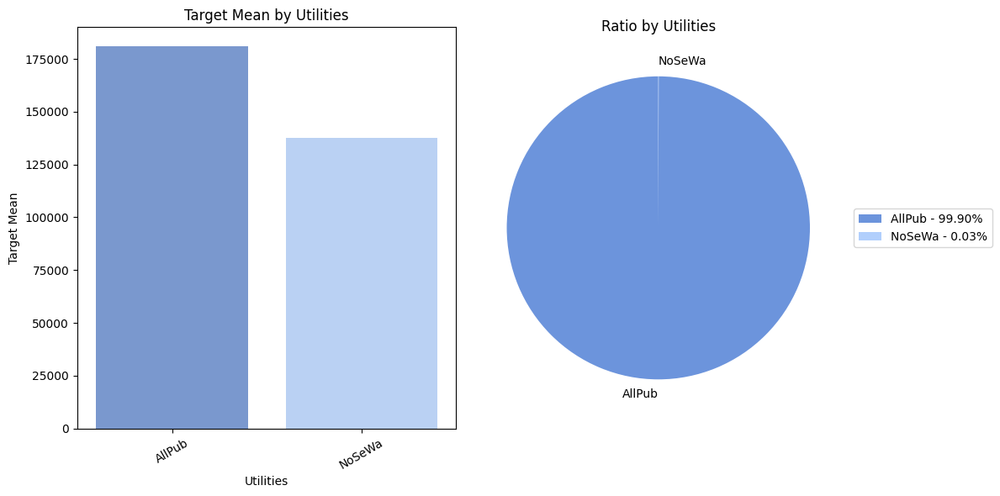

------------------------------------------------------------------------------------------------------------------------
LotConfig
------------------------------------------------------------------------------------------------------------------------
           Target Mean  Count  Ratio (%)
LotConfig                               
Corner      181623.426    511     17.506
CulDSac     223854.617    176      6.029
FR2         177934.574     85      2.912
FR3         208475.000     14      0.480
Inside      176938.048   2133     73.073




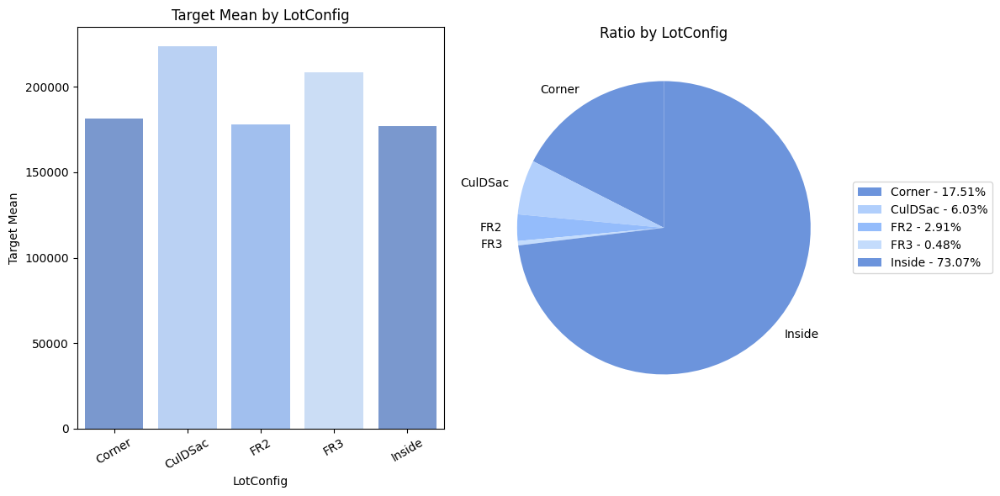

------------------------------------------------------------------------------------------------------------------------
LandSlope
------------------------------------------------------------------------------------------------------------------------
           Target Mean  Count  Ratio (%)
LandSlope                               
Gtl         179956.800   2778     95.170
Mod         196734.138    125      4.282
Sev         204379.231     16      0.548




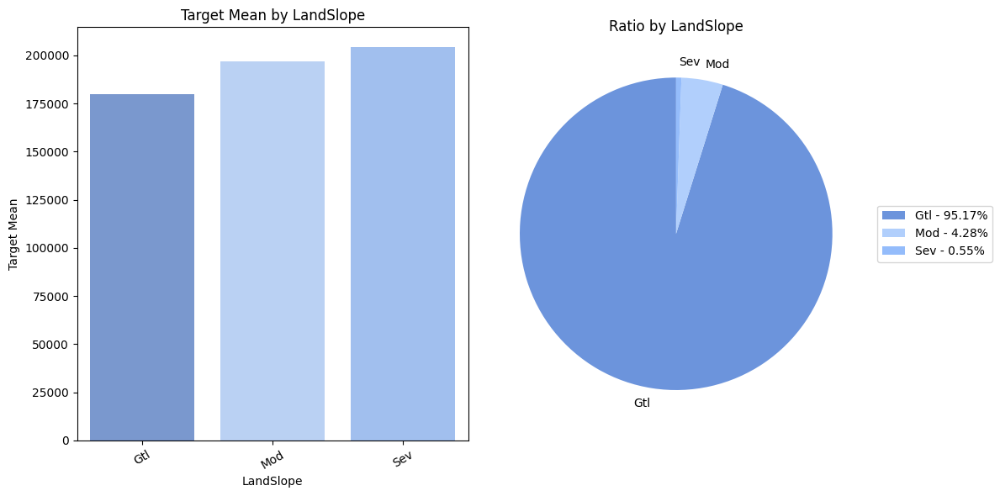

------------------------------------------------------------------------------------------------------------------------
Neighborhood
------------------------------------------------------------------------------------------------------------------------
              Target Mean  Count  Ratio (%)
Neighborhood                               
Blmngtn        194870.882     28      0.959
Blueste        137500.000     10      0.343
BrDale         104493.750     30      1.028
BrkSide        124834.052    108      3.700
ClearCr        212565.429     44      1.507
CollgCr        197965.773    267      9.147
Crawfor        210624.725    103      3.529
Edwards        128219.700    194      6.646
Gilbert        192854.506    165      5.653
IDOTRR         100123.784     93      3.186
MeadowV         98576.471     37      1.268
Mitchel        156270.122    114      3.905
NAmes          145847.080    443     15.176
NPkVill        142694.444     23      0.788
NWAmes         189050.068    131      4.4

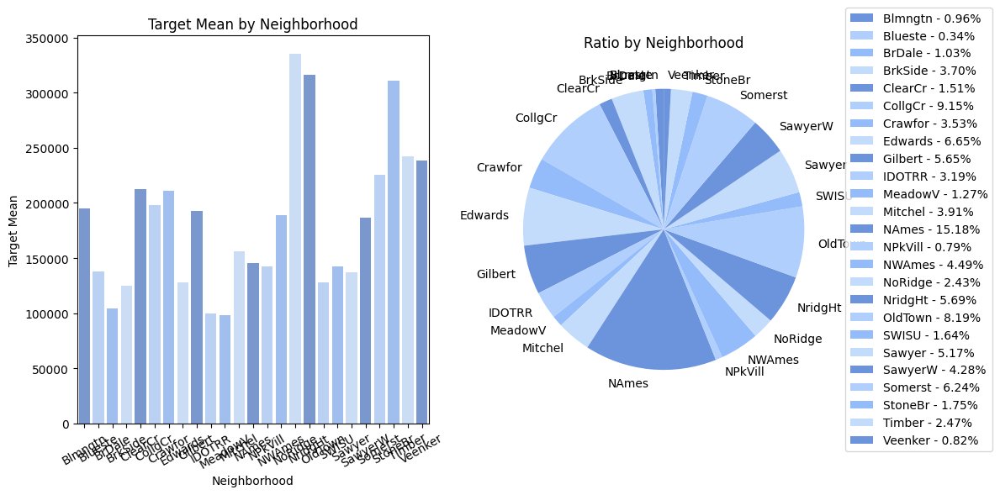

------------------------------------------------------------------------------------------------------------------------
Condition1
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
Condition1                               
Artery       135091.667     92      3.152
Feedr        142475.481    164      5.618
Norm         184495.492   2511     86.023
PosA         225875.000     20      0.685
PosN         215184.211     39      1.336
RRAe         138400.000     28      0.959
RRAn         184396.615     50      1.713
RRNe         190750.000      6      0.206
RRNn         212400.000      9      0.308




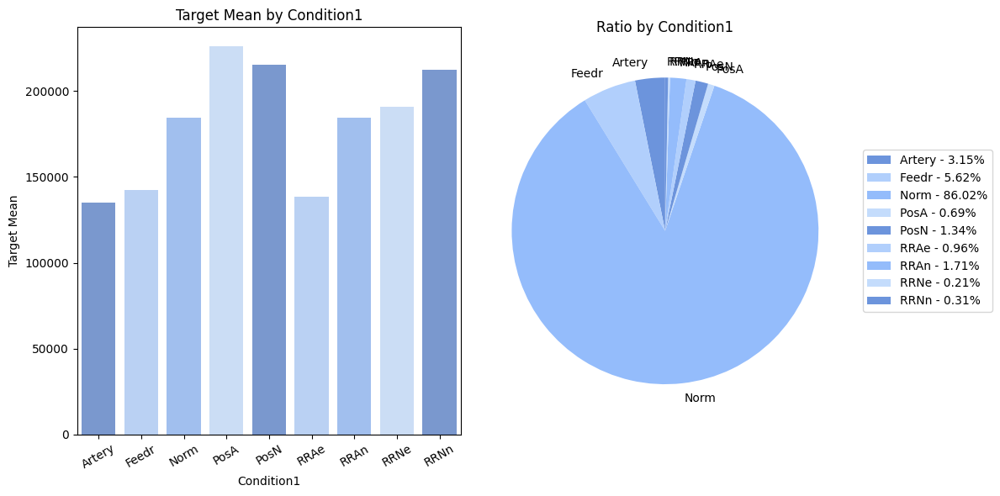

------------------------------------------------------------------------------------------------------------------------
Condition2
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
Condition2                               
Artery       106500.000      5      0.171
Feedr        121166.667     13      0.445
Norm         181169.406   2889     98.972
PosA         325000.000      4      0.137
PosN         284875.000      4      0.137
RRAe         190000.000      1      0.034
RRAn         136905.000      1      0.034
RRNn          96750.000      2      0.069




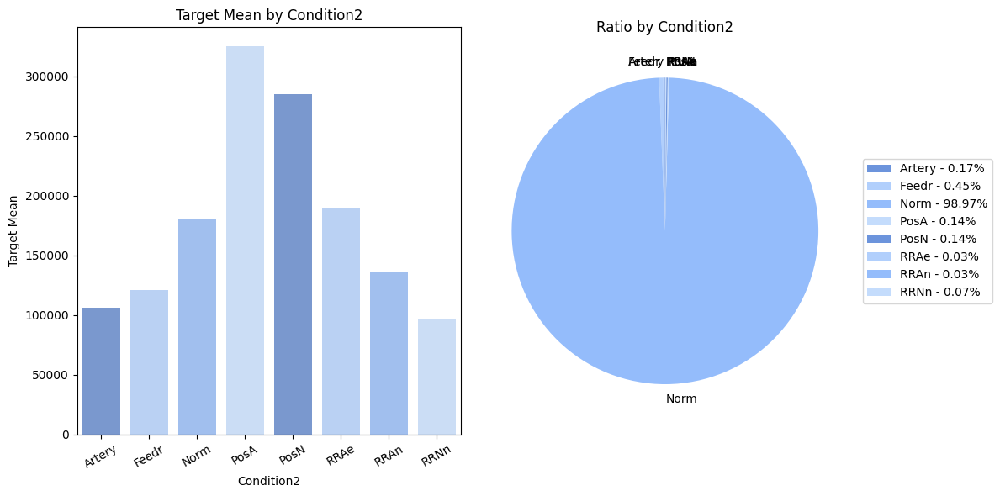

------------------------------------------------------------------------------------------------------------------------
BldgType
------------------------------------------------------------------------------------------------------------------------
          Target Mean  Count  Ratio (%)
BldgType                               
1Fam       185763.807   2425     83.076
2fmCon     128432.258     62      2.124
Duplex     133541.077    109      3.734
Twnhs      135911.628     96      3.289
TwnhsE     181959.342    227      7.777




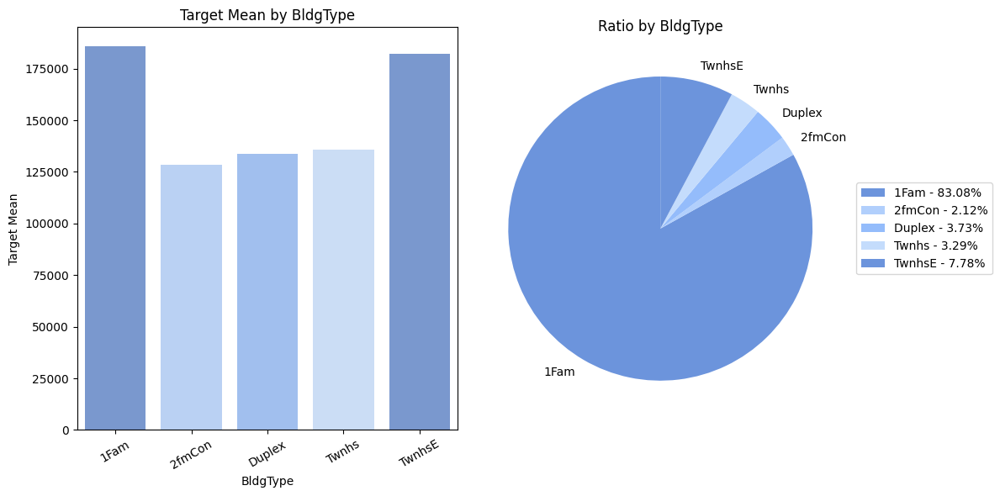

------------------------------------------------------------------------------------------------------------------------
HouseStyle
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
HouseStyle                               
1.5Fin       143116.740    314     10.757
1.5Unf       110150.000     19      0.651
1Story       175985.478   1471     50.394
2.5Fin       220000.000      8      0.274
2.5Unf       157354.545     24      0.822
2Story       210051.764    872     29.873
SFoyer       135074.486     83      2.843
SLvl         166703.385    128      4.385




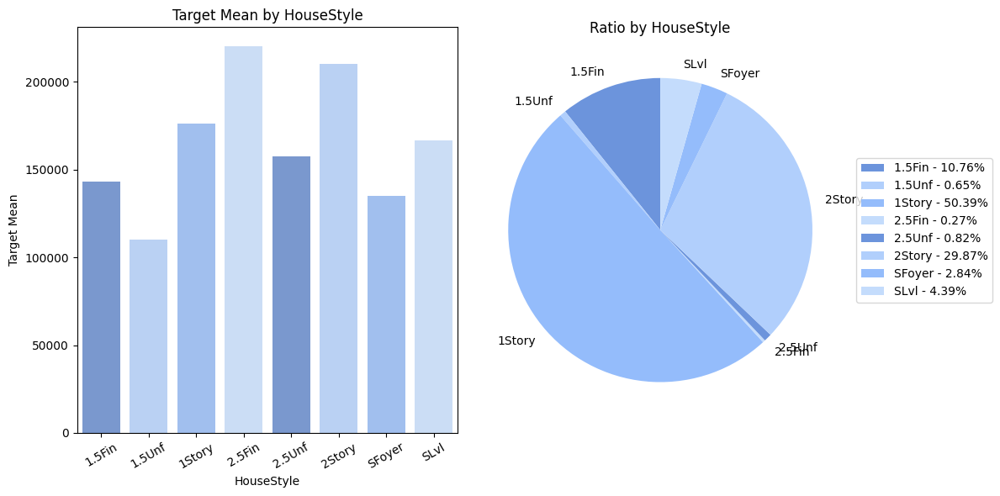

------------------------------------------------------------------------------------------------------------------------
RoofStyle
------------------------------------------------------------------------------------------------------------------------
           Target Mean  Count  Ratio (%)
RoofStyle                               
Flat        194690.000     20      0.685
Gable       171483.956   2310     79.137
Gambrel     148909.091     22      0.754
Hip         218876.934    551     18.876
Mansard     180568.429     11      0.377
Shed        225000.000      5      0.171




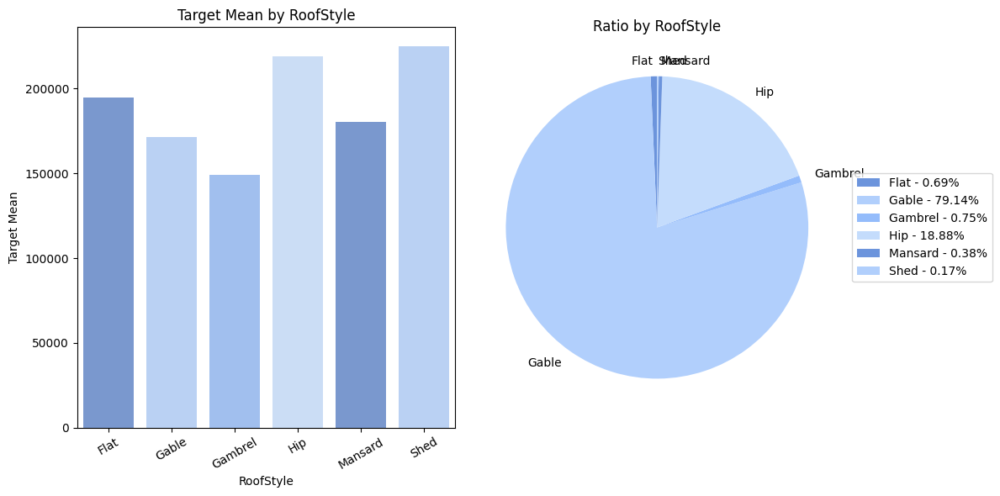

------------------------------------------------------------------------------------------------------------------------
RoofMatl
------------------------------------------------------------------------------------------------------------------------
          Target Mean  Count  Ratio (%)
RoofMatl                               
ClyTile    160000.000      1      0.034
CompShg    179803.679   2876     98.527
Membran    241500.000      1      0.034
Metal      180000.000      1      0.034
Roll       137000.000      1      0.034
Tar&Grv    185406.364     23      0.788
WdShake    241400.000      9      0.308
WdShngl    390250.000      7      0.240




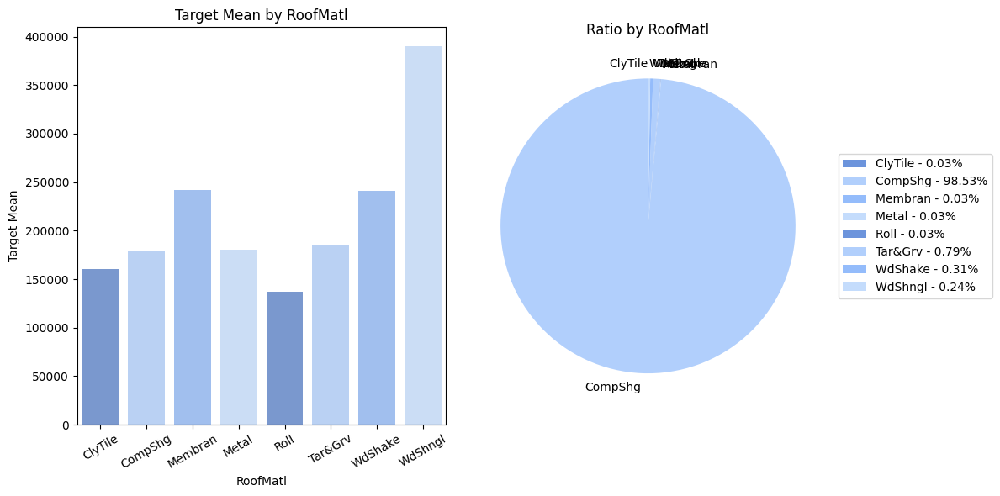

------------------------------------------------------------------------------------------------------------------------
Exterior1st
------------------------------------------------------------------------------------------------------------------------
             Target Mean  Count  Ratio (%)
Exterior1st                               
AsbShng       107385.550     44      1.507
AsphShn       100000.000      2      0.069
BrkComm        71000.000      6      0.206
BrkFace       194573.000     87      2.980
CBlock        105000.000      2      0.069
CemntBd       231690.656    126      4.317
HdBoard       163077.450    442     15.142
ImStucc       262000.000      1      0.034
MetalSd       149422.177    450     15.416
Plywood       175942.380    221      7.571
Stone         258500.000      2      0.069
Stucco        162990.000     43      1.473
VinylSd       213732.901   1025     35.115
Wd Sdng       149841.646    411     14.080
WdShing       150655.077     56      1.918




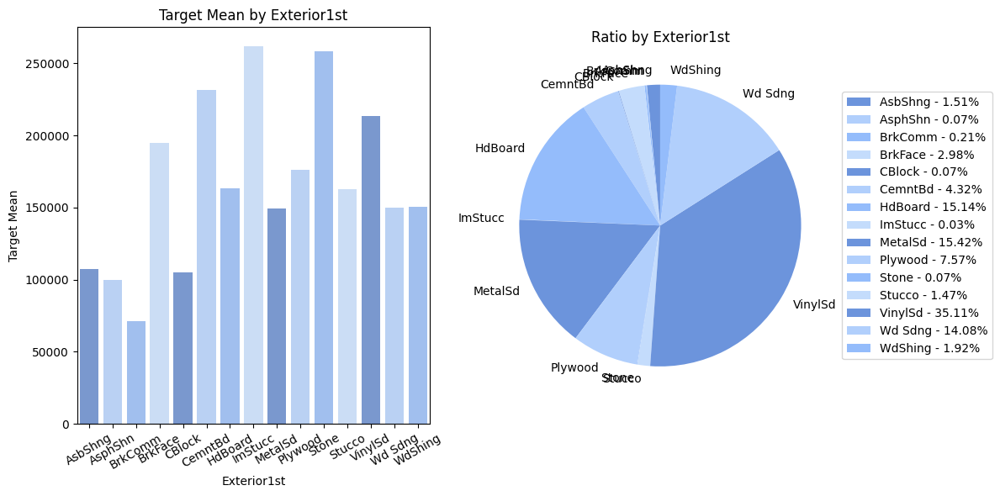

------------------------------------------------------------------------------------------------------------------------
Exterior2nd
------------------------------------------------------------------------------------------------------------------------
             Target Mean  Count  Ratio (%)
Exterior2nd                               
AsbShng       114060.550     38      1.302
AsphShn       138000.000      4      0.137
Brk Cmn       126714.286     22      0.754
BrkFace       195818.000     47      1.610
CBlock        105000.000      3      0.103
CmentBd       230093.833    126      4.317
HdBoard       167661.565    406     13.909
ImStucc       252070.000     15      0.514
MetalSd       149803.173    447     15.313
Other         319000.000      1      0.034
Plywood       168112.387    270      9.250
Stone         158224.800      6      0.206
Stucco        155905.154     47      1.610
VinylSd       214432.460   1014     34.738
Wd Sdng       148386.066    391     13.395
Wd Shng       1

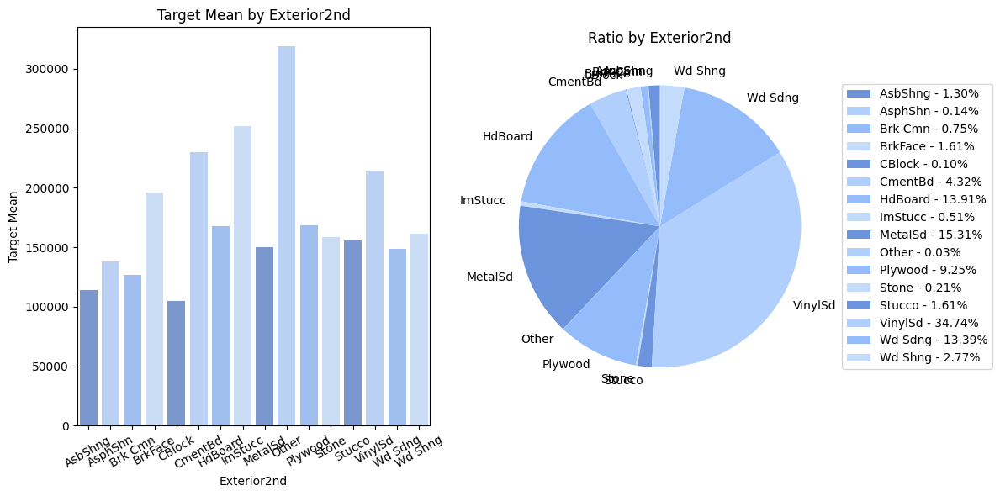

------------------------------------------------------------------------------------------------------------------------
MasVnrType
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
MasVnrType                               
BrkCmn       146318.067     25      0.856
BrkFace      204691.872    879     30.113
Stone        265583.625    249      8.530




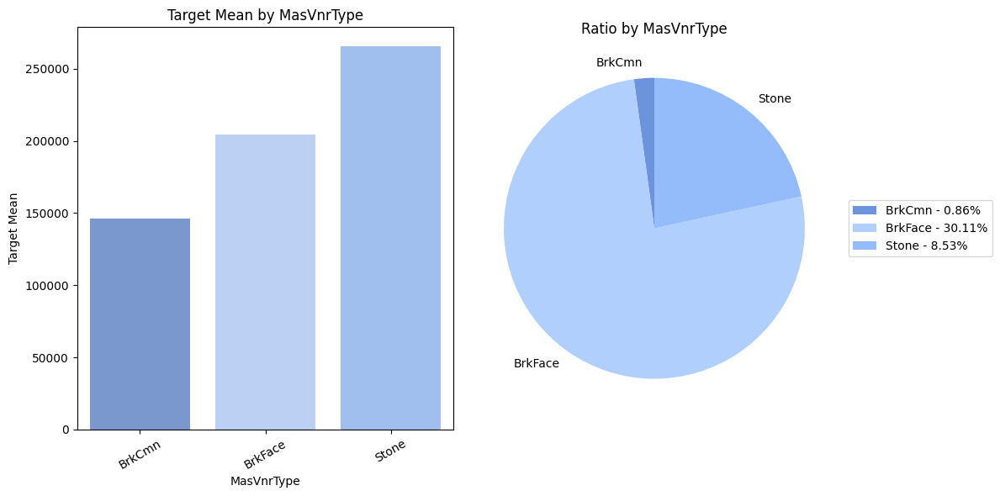

------------------------------------------------------------------------------------------------------------------------
ExterQual
------------------------------------------------------------------------------------------------------------------------
           Target Mean  Count  Ratio (%)
ExterQual                               
Ex          367360.962    107      3.666
Fa           87985.214     35      1.199
Gd          231633.510    979     33.539
TA          144341.313   1798     61.596




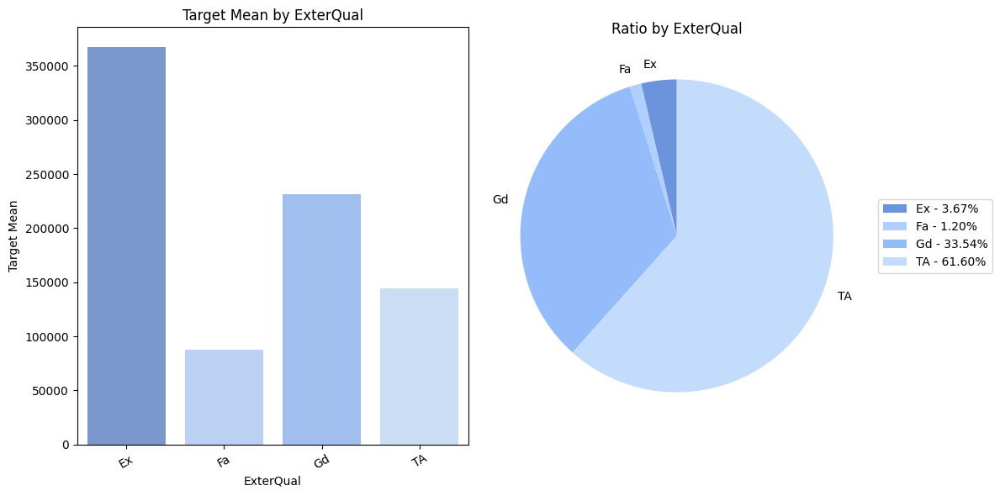

------------------------------------------------------------------------------------------------------------------------
ExterCond
------------------------------------------------------------------------------------------------------------------------
           Target Mean  Count  Ratio (%)
ExterCond                               
Ex          201333.333     12      0.411
Fa          102595.143     67      2.295
Gd          168897.568    299     10.243
Po           76500.000      3      0.103
TA          184034.896   2538     86.948




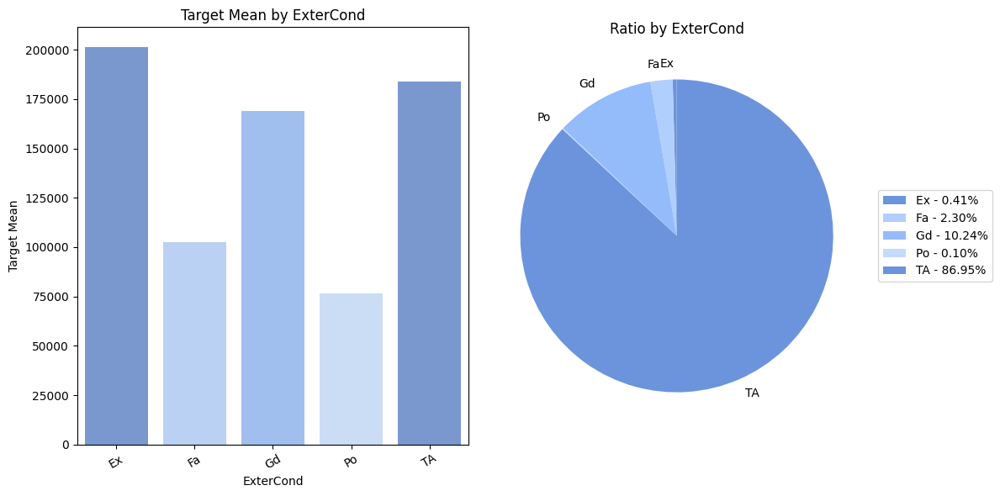

------------------------------------------------------------------------------------------------------------------------
Foundation
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
Foundation                               
BrkTil       132291.075    311     10.654
CBlock       149805.715   1235     42.309
PConc        225230.442   1308     44.810
Slab         107365.625     49      1.679
Stone        165959.167     11      0.377
Wood         185666.667      5      0.171




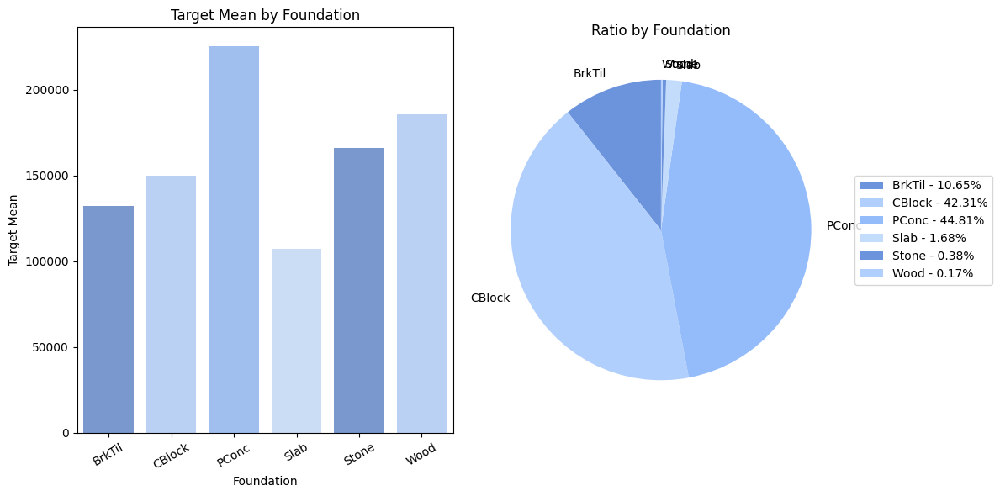

------------------------------------------------------------------------------------------------------------------------
BsmtQual
------------------------------------------------------------------------------------------------------------------------
          Target Mean  Count  Ratio (%)
BsmtQual                               
Ex         327041.041    258      8.839
Fa         115692.029     88      3.015
Gd         202688.479   1209     41.418
TA         140759.818   1283     43.953




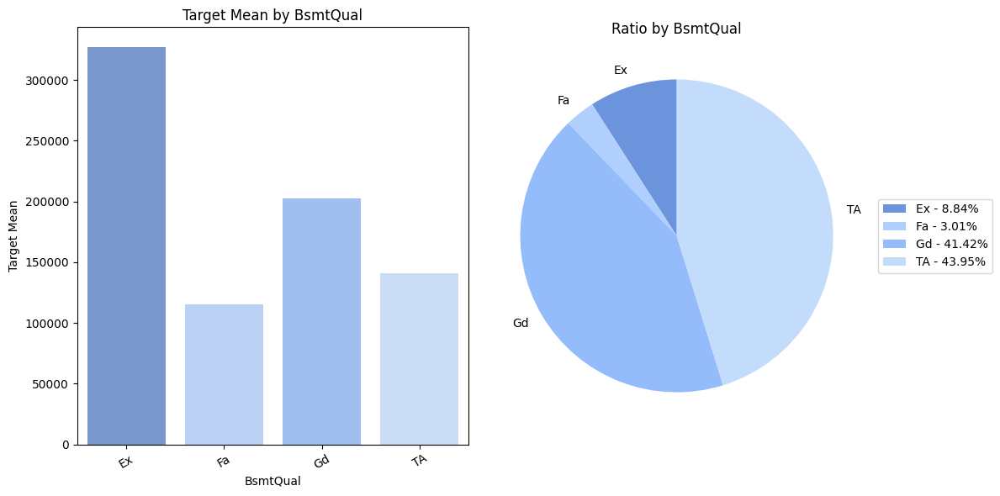

------------------------------------------------------------------------------------------------------------------------
BsmtCond
------------------------------------------------------------------------------------------------------------------------
          Target Mean  Count  Ratio (%)
BsmtCond                               
Fa         121809.533    104      3.563
Gd         213599.908    122      4.180
Po          64000.000      5      0.171
TA         183632.621   2606     89.277




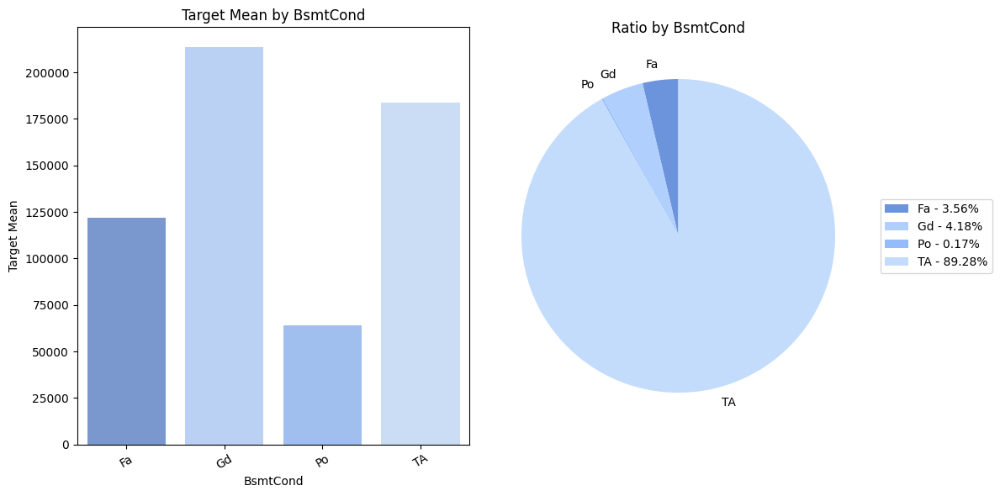

------------------------------------------------------------------------------------------------------------------------
BsmtExposure
------------------------------------------------------------------------------------------------------------------------
              Target Mean  Count  Ratio (%)
BsmtExposure                               
Av             206643.421    418     14.320
Gd             257689.806    276      9.455
Mn             192789.658    239      8.188
No             165652.296   1904     65.228




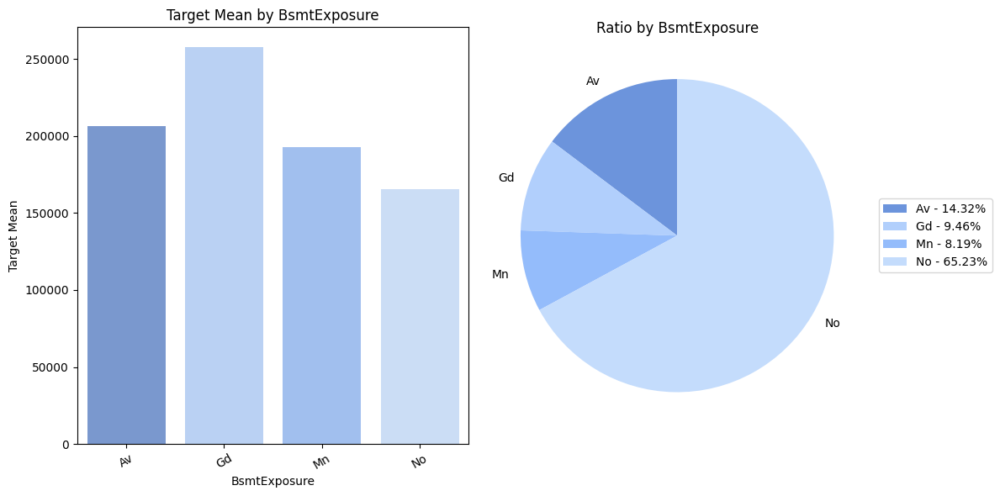

------------------------------------------------------------------------------------------------------------------------
BsmtFinType1
------------------------------------------------------------------------------------------------------------------------
              Target Mean  Count  Ratio (%)
BsmtFinType1                               
ALQ            161573.068    429     14.697
BLQ            149493.655    269      9.215
GLQ            235413.720    849     29.085
LwQ            151852.703    154      5.276
Rec            146889.248    288      9.866
Unf            170670.577    851     29.154




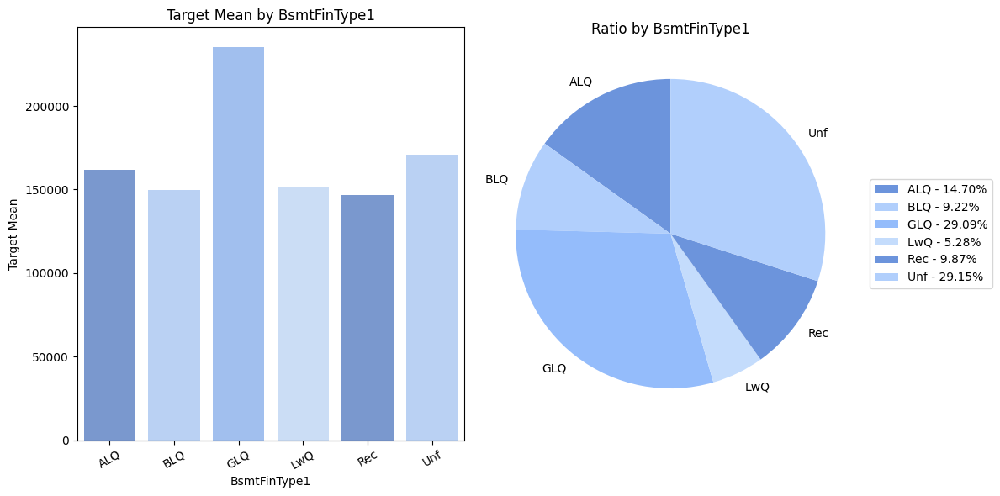

------------------------------------------------------------------------------------------------------------------------
BsmtFinType2
------------------------------------------------------------------------------------------------------------------------
              Target Mean  Count  Ratio (%)
BsmtFinType2                               
ALQ            209942.105     52      1.781
BLQ            151101.000     68      2.330
GLQ            180982.143     34      1.165
LwQ            164364.130     87      2.980
Rec            164917.130    105      3.597
Unf            184694.690   2493     85.406




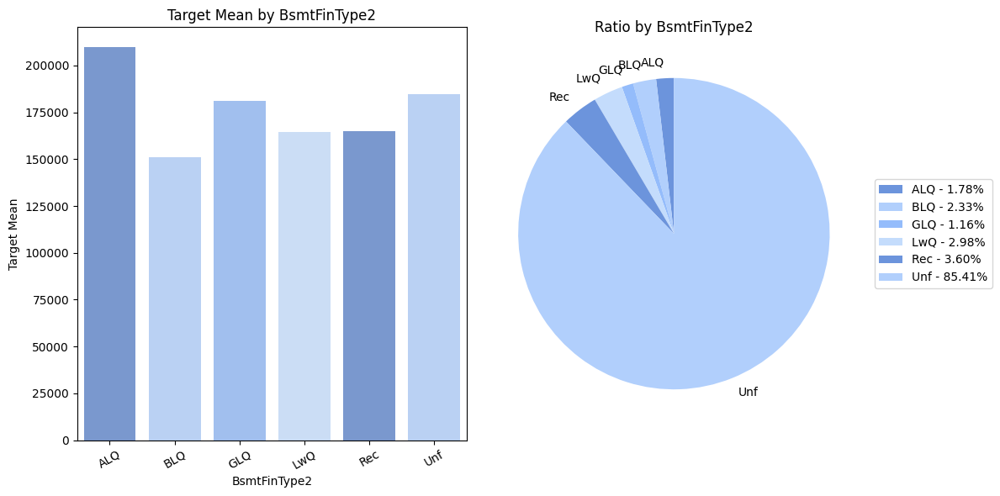

------------------------------------------------------------------------------------------------------------------------
Heating
------------------------------------------------------------------------------------------------------------------------
         Target Mean  Count  Ratio (%)
Heating                               
Floor      72500.000      1      0.034
GasA      182021.195   2874     98.458
GasW      166632.167     27      0.925
Grav       75271.429      9      0.308
OthW      125750.000      2      0.069
Wall       92100.000      6      0.206




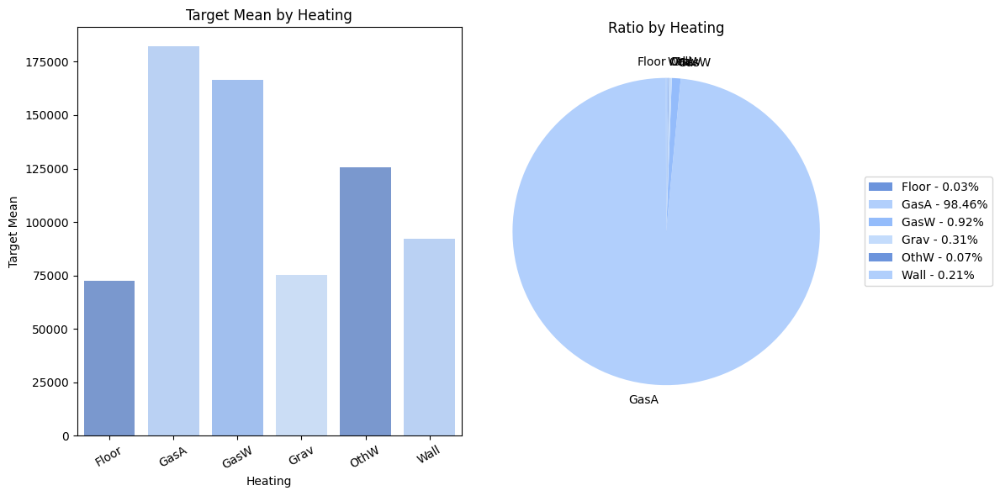

------------------------------------------------------------------------------------------------------------------------
HeatingQC
------------------------------------------------------------------------------------------------------------------------
           Target Mean  Count  Ratio (%)
HeatingQC                               
Ex          214914.429   1493     51.148
Fa          123919.490     92      3.152
Gd          156858.871    474     16.238
Po           87000.000      3      0.103
TA          142362.876    857     29.359




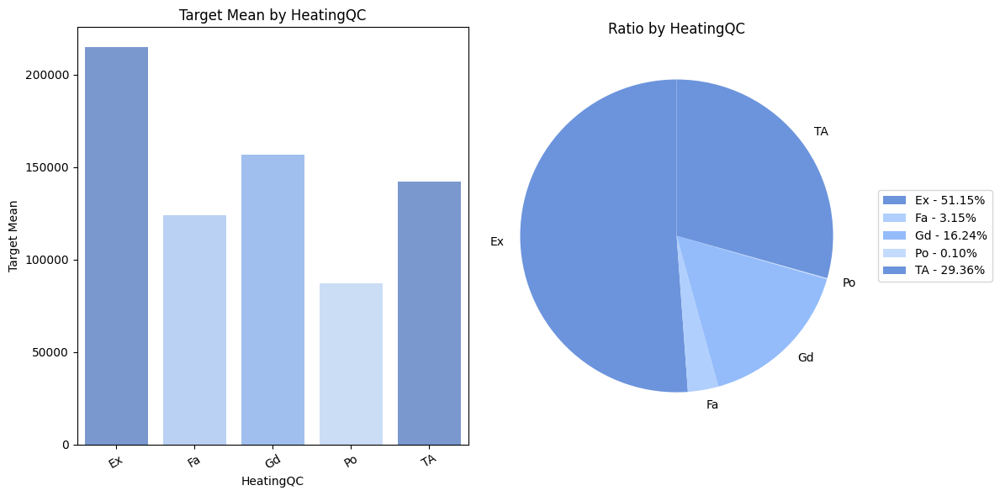

------------------------------------------------------------------------------------------------------------------------
CentralAir
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
CentralAir                               
N            105264.074    196      6.715
Y            186186.710   2723     93.285




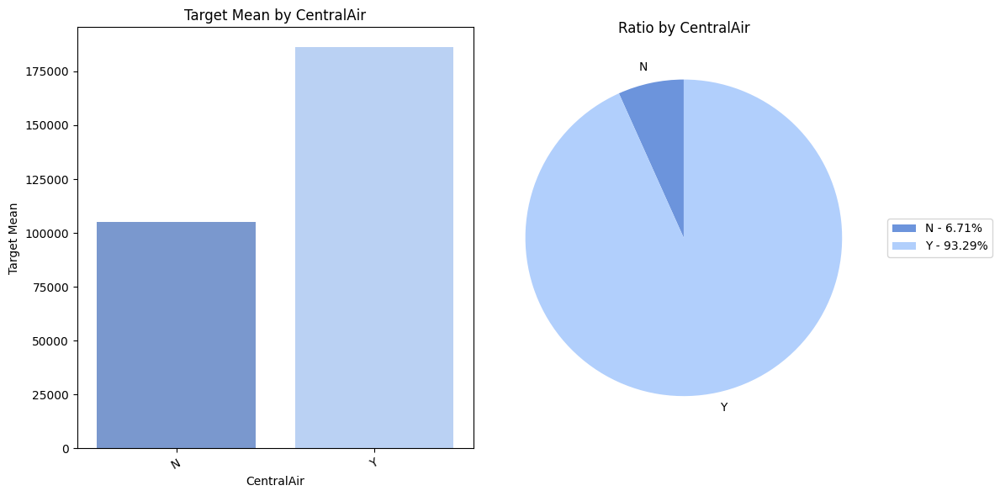

------------------------------------------------------------------------------------------------------------------------
Electrical
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
Electrical                               
FuseA        122196.894    188      6.441
FuseF        107675.444     50      1.713
FuseP         97333.333      8      0.274
Mix           67000.000      1      0.034
SBrkr        186825.113   2671     91.504




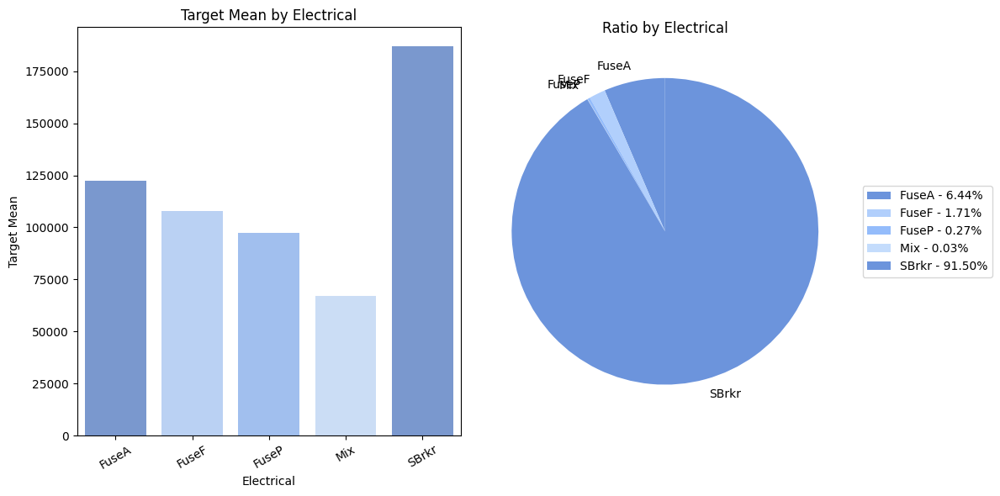

------------------------------------------------------------------------------------------------------------------------
KitchenQual
------------------------------------------------------------------------------------------------------------------------
             Target Mean  Count  Ratio (%)
KitchenQual                               
Ex            328554.670    205      7.023
Fa            105565.205     70      2.398
Gd            212116.024   1151     39.431
TA            139962.512   1492     51.113




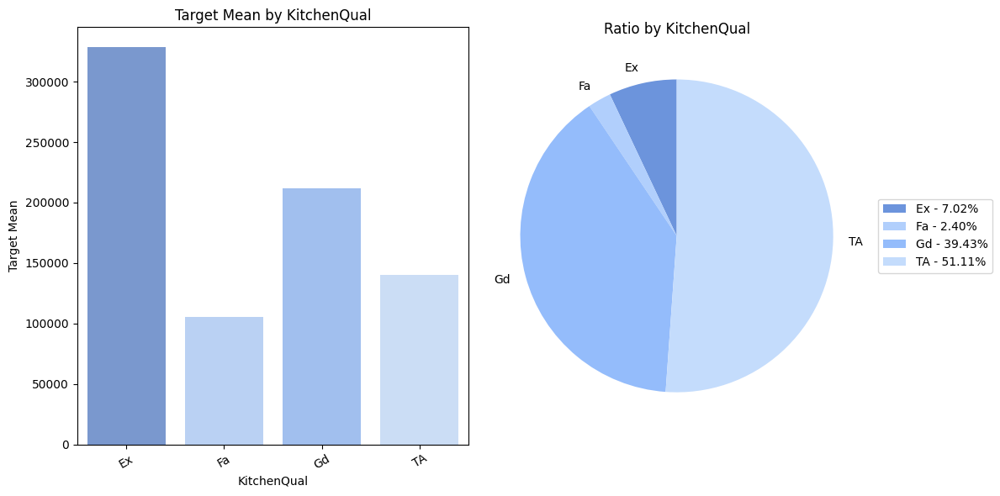

------------------------------------------------------------------------------------------------------------------------
Functional
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
Functional                               
Maj1         153948.143     19      0.651
Maj2          85800.000      9      0.308
Min1         146385.484     65      2.227
Min2         144240.647     70      2.398
Mod          168393.333     35      1.199
Sev          129000.000      2      0.069
Typ          183429.147   2717     93.080




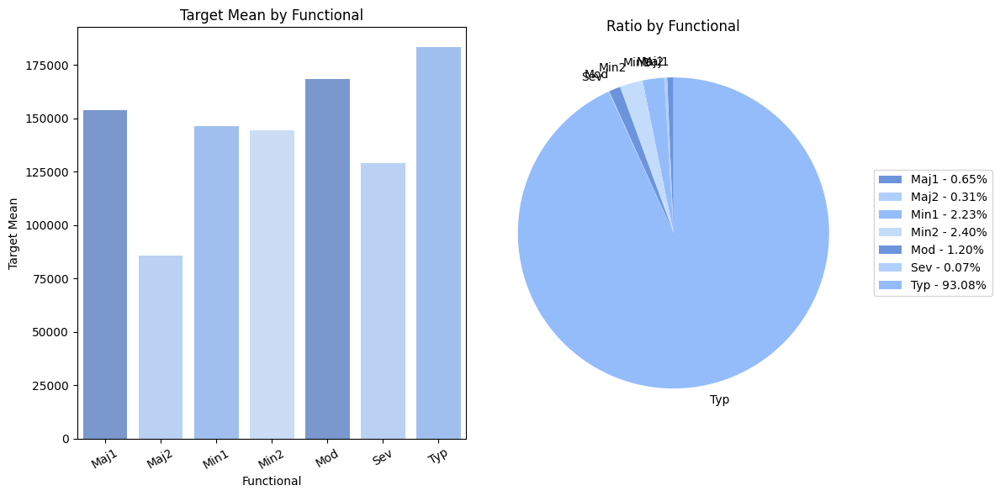

------------------------------------------------------------------------------------------------------------------------
FireplaceQu
------------------------------------------------------------------------------------------------------------------------
             Target Mean  Count  Ratio (%)
FireplaceQu                               
Ex            337712.500     43      1.473
Fa            167298.485     74      2.535
Gd            226351.416    744     25.488
Po            129764.150     46      1.576
TA            205723.489    592     20.281




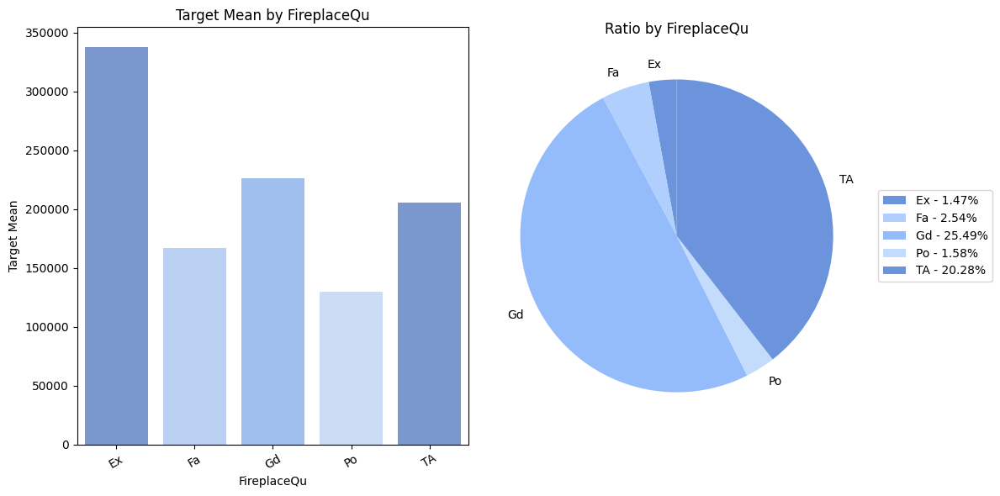

------------------------------------------------------------------------------------------------------------------------
GarageType
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
GarageType                               
2Types       151283.333     23      0.788
Attchd       202892.656   1723     59.027
Basment      160570.684     36      1.233
BuiltIn      254751.739    186      6.372
CarPort      109962.111     15      0.514
Detchd       134091.163    779     26.687




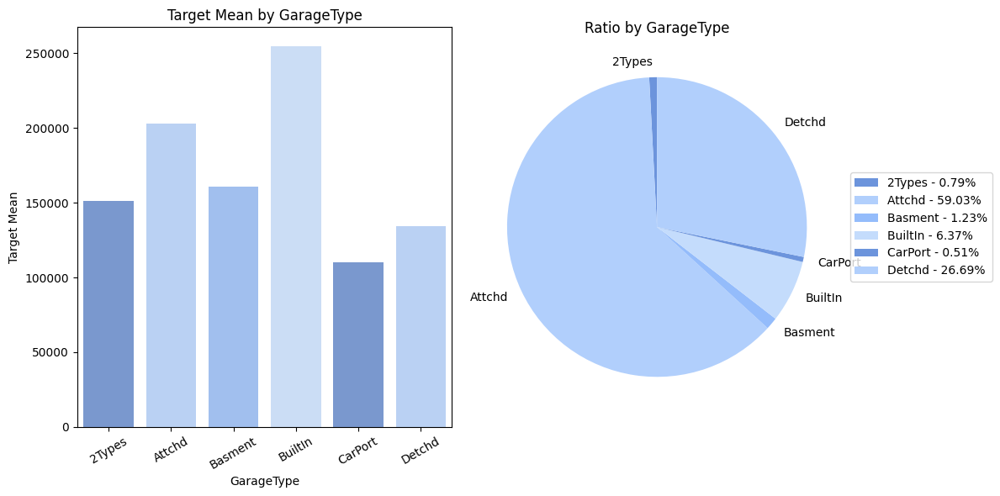

------------------------------------------------------------------------------------------------------------------------
GarageFinish
------------------------------------------------------------------------------------------------------------------------
              Target Mean  Count  Ratio (%)
GarageFinish                               
Fin            240052.690    719     24.632
RFn            202068.870    811     27.783
Unf            142156.423   1230     42.138




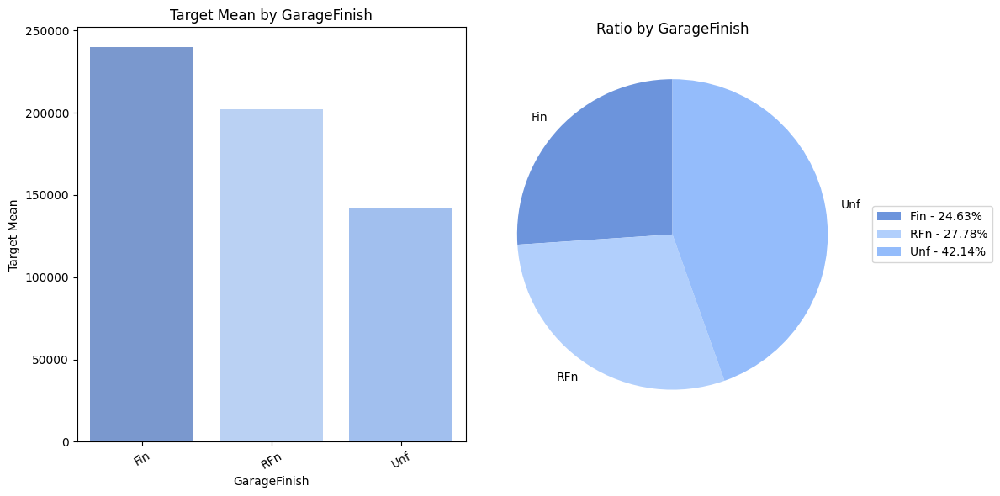

------------------------------------------------------------------------------------------------------------------------
GarageQual
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
GarageQual                               
Ex           241000.000      3      0.103
Fa           123573.354    124      4.248
Gd           215860.714     24      0.822
Po           100166.667      5      0.171
TA           187489.836   2604     89.209




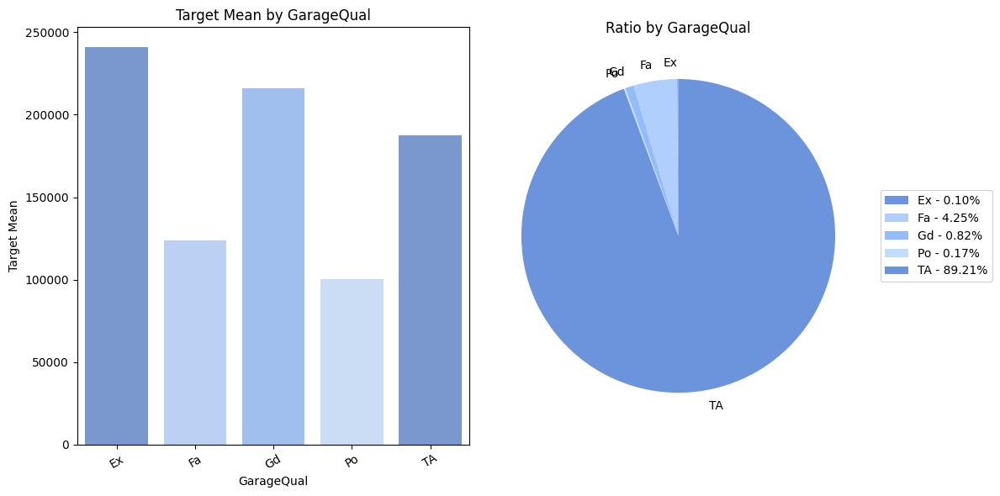

------------------------------------------------------------------------------------------------------------------------
GarageCond
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
GarageCond                               
Ex           124000.000      3      0.103
Fa           114654.029     74      2.535
Gd           179930.000     15      0.514
Po           108500.000     14      0.480
TA           187885.735   2654     90.922




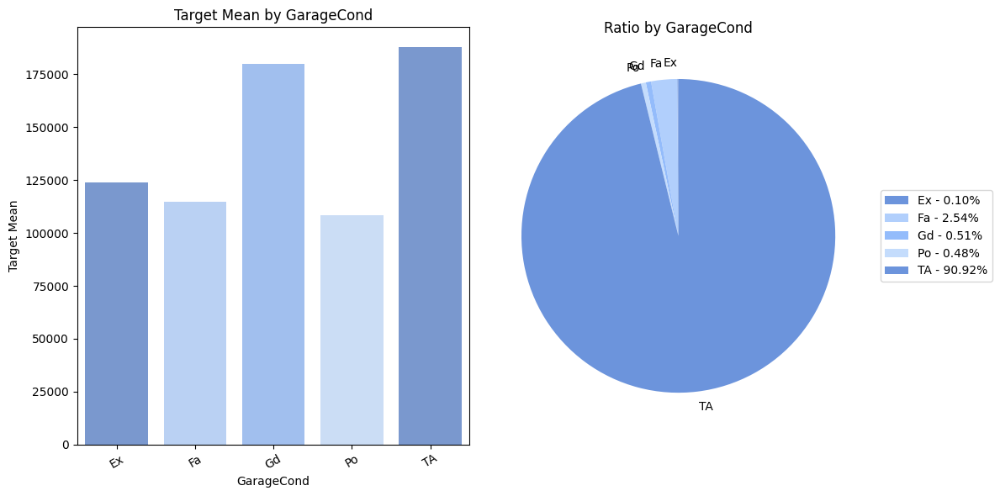

------------------------------------------------------------------------------------------------------------------------
PavedDrive
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
PavedDrive                               
N            115039.122    216      7.400
P            132330.000     62      2.124
Y            186433.974   2641     90.476




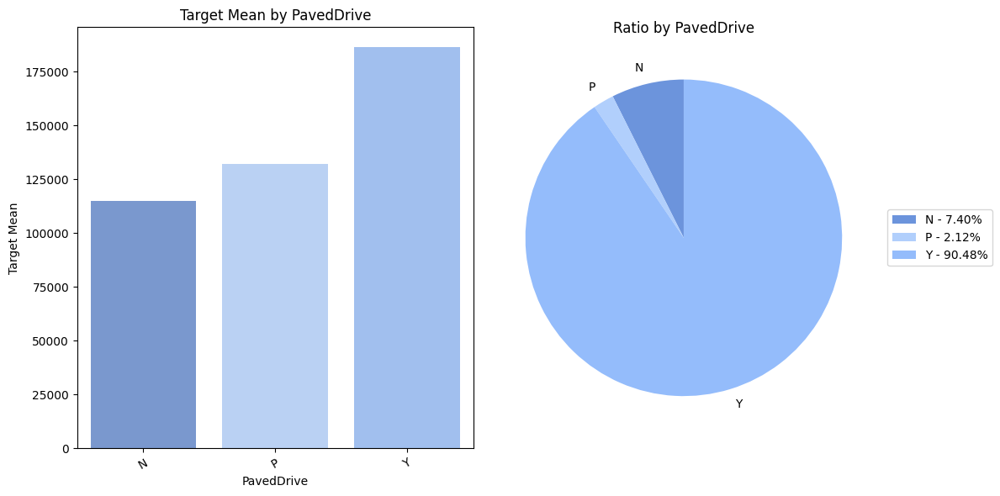

------------------------------------------------------------------------------------------------------------------------
PoolQC
------------------------------------------------------------------------------------------------------------------------
        Target Mean  Count  Ratio (%)
PoolQC                               
Ex       490000.000      4      0.137
Fa       215500.000      2      0.069
Gd       201990.000      4      0.137




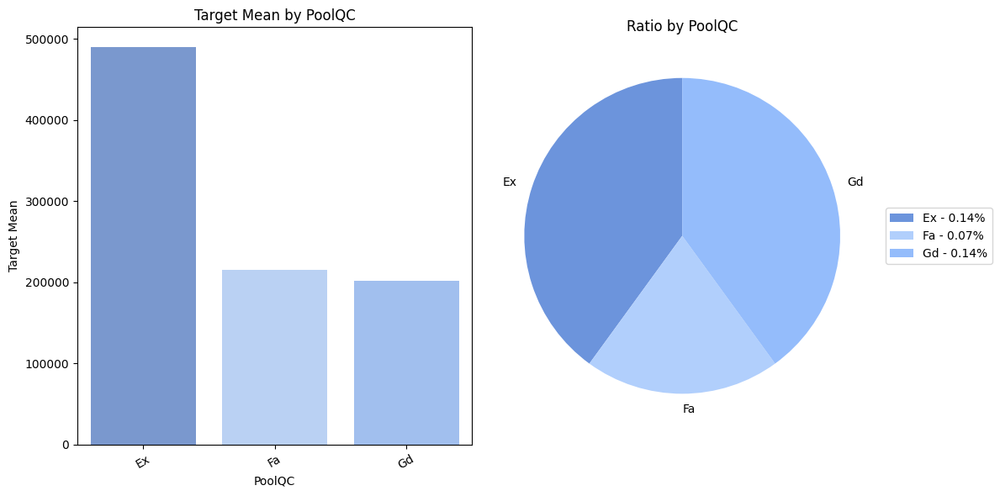

------------------------------------------------------------------------------------------------------------------------
Fence
------------------------------------------------------------------------------------------------------------------------
       Target Mean  Count  Ratio (%)
Fence                               
GdPrv   178927.458    118      4.042
GdWo    140379.315    112      3.837
MnPrv   148751.089    329     11.271
MnWw    134286.364     12      0.411




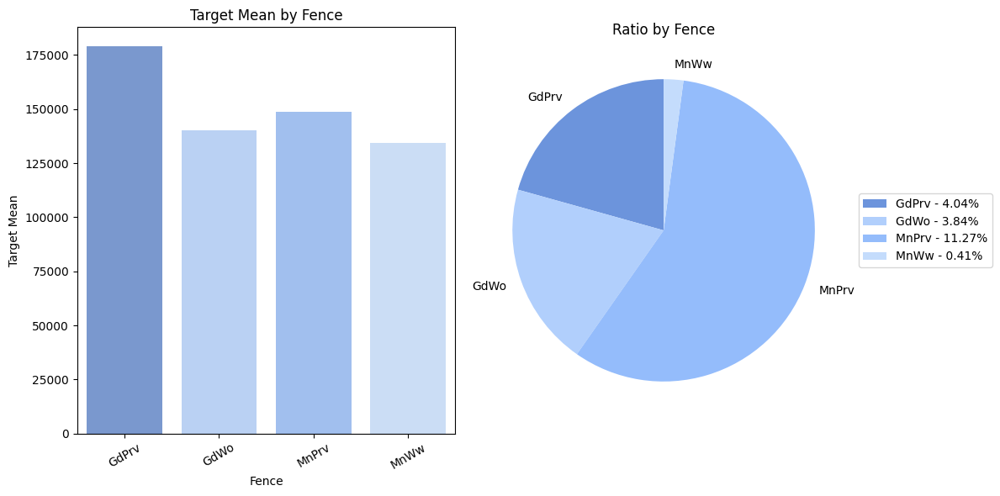

------------------------------------------------------------------------------------------------------------------------
MiscFeature
------------------------------------------------------------------------------------------------------------------------
             Target Mean  Count  Ratio (%)
MiscFeature                               
Gar2          170750.000      5      0.171
Othr           94000.000      4      0.137
Shed          151187.612     95      3.255
TenC          250000.000      1      0.034




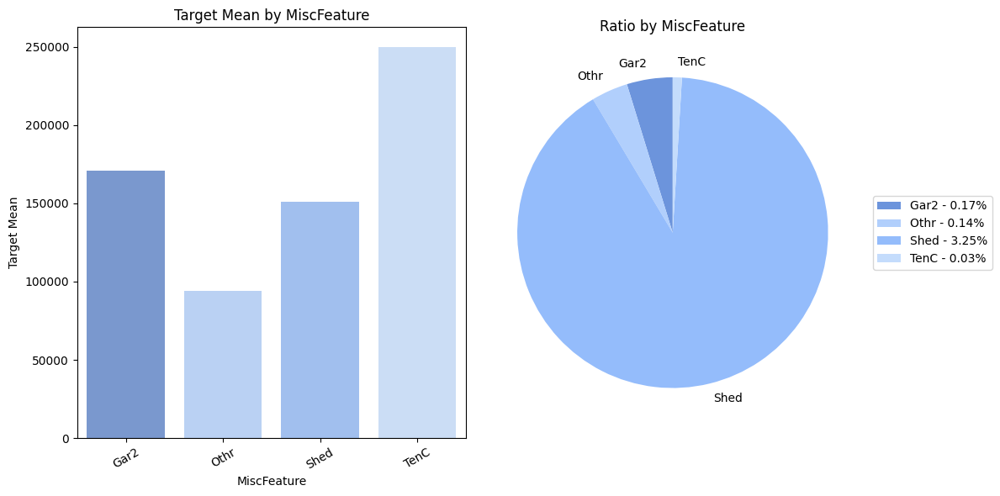

------------------------------------------------------------------------------------------------------------------------
SaleType
------------------------------------------------------------------------------------------------------------------------
          Target Mean  Count  Ratio (%)
SaleType                               
COD        143973.256     87      2.980
CWD        210600.000     12      0.411
Con        269600.000      5      0.171
ConLD      138780.889     26      0.891
ConLI      200390.000      9      0.308
ConLw      143700.000      8      0.274
New        274945.418    239      8.188
Oth        119850.000      7      0.240
WD         173401.837   2525     86.502




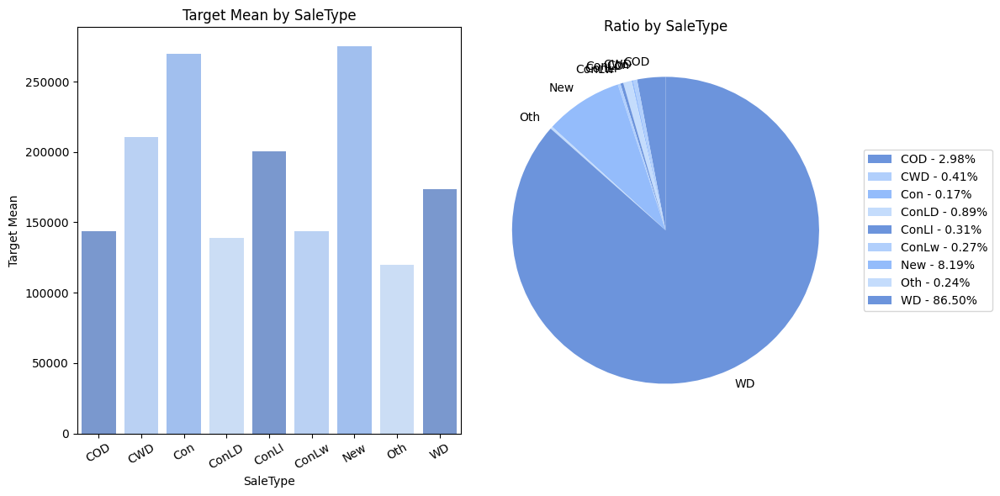

------------------------------------------------------------------------------------------------------------------------
SaleCondition
------------------------------------------------------------------------------------------------------------------------
               Target Mean  Count  Ratio (%)
SaleCondition                               
Abnorml         146526.624    190      6.509
AdjLand         104125.000     12      0.411
Alloca          167377.417     24      0.822
Family          149600.000     46      1.576
Normal          175202.220   2402     82.288
Partial         272291.752    245      8.393




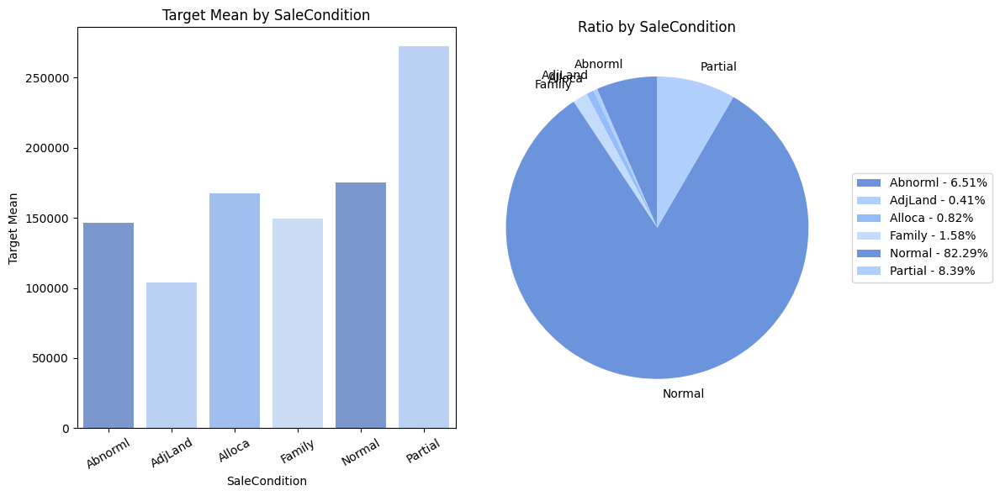

------------------------------------------------------------------------------------------------------------------------
OverallCond
------------------------------------------------------------------------------------------------------------------------
             Target Mean  Count  Ratio (%)
OverallCond                               
1              61000.000      7      0.240
2             141986.400     10      0.343
3             101929.400     50      1.713
4             120438.439    101      3.460
5             203146.915   1645     56.355
6             153961.591    531     18.191
7             158145.488    390     13.361
8             155651.736    144      4.933
9             216004.545     41      1.405




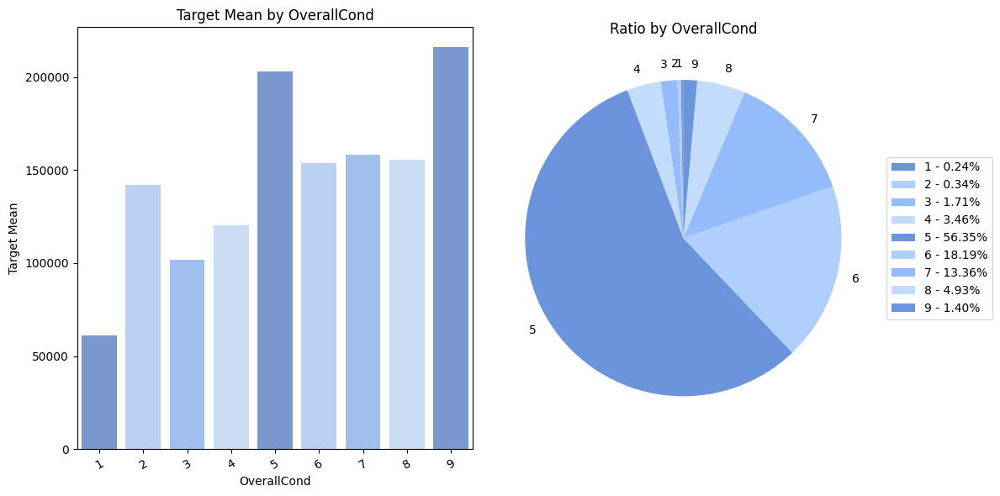

------------------------------------------------------------------------------------------------------------------------
BsmtFullBath
------------------------------------------------------------------------------------------------------------------------
              Target Mean  Count  Ratio (%)
BsmtFullBath                               
0.000          165521.640   1705     58.410
1.000          202522.918   1172     40.151
2.000          213063.067     38      1.302
3.000          179000.000      2      0.069




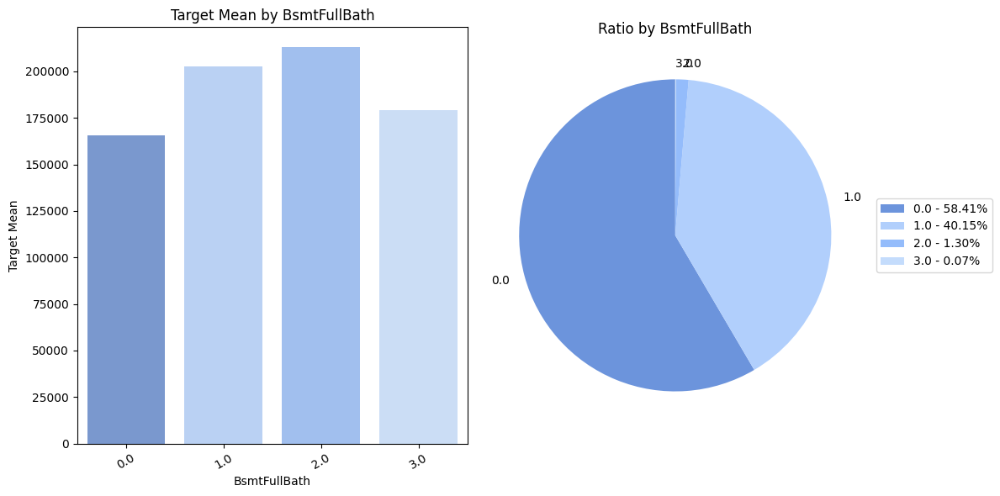

------------------------------------------------------------------------------------------------------------------------
BsmtHalfBath
------------------------------------------------------------------------------------------------------------------------
              Target Mean  Count  Ratio (%)
BsmtHalfBath                               
0.000          181230.330   2742     93.936
1.000          176098.125    171      5.858
2.000          160850.500      4      0.137




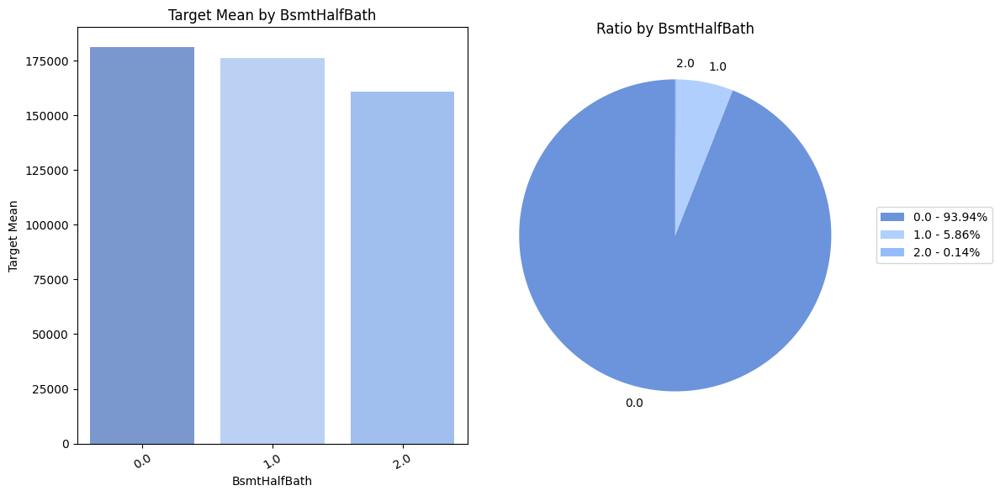

------------------------------------------------------------------------------------------------------------------------
FullBath
------------------------------------------------------------------------------------------------------------------------
          Target Mean  Count  Ratio (%)
FullBath                               
0          165200.889     12      0.411
1          134751.440   1309     44.844
2          213009.826   1530     52.415
3          347822.909     64      2.193
4                 NaN      4      0.137




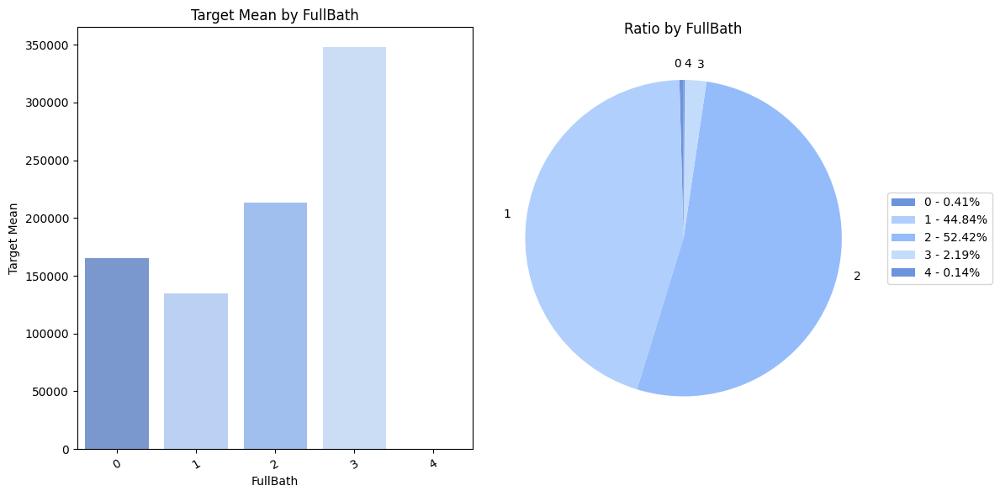

------------------------------------------------------------------------------------------------------------------------
HalfBath
------------------------------------------------------------------------------------------------------------------------
          Target Mean  Count  Ratio (%)
HalfBath                               
0          162534.885   1834     62.830
1          212721.961   1060     36.314
2          162028.917     25      0.856




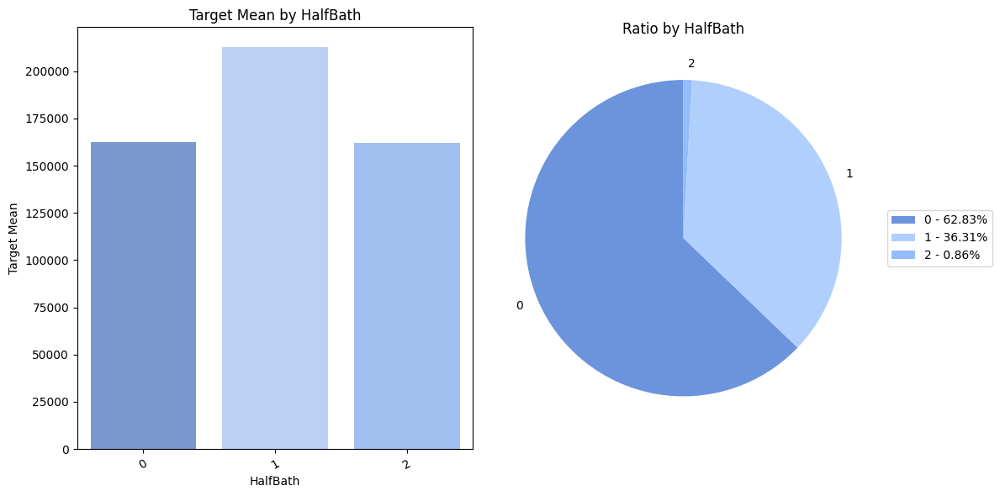

------------------------------------------------------------------------------------------------------------------------
BedroomAbvGr
------------------------------------------------------------------------------------------------------------------------
              Target Mean  Count  Ratio (%)
BedroomAbvGr                               
0              221493.167      8      0.274
1              173162.420    103      3.529
2              158197.659    742     25.420
3              181056.871   1596     54.676
4              220421.254    400     13.703
5              180819.048     48      1.644
6              143779.000     21      0.719
8              200000.000      1      0.034




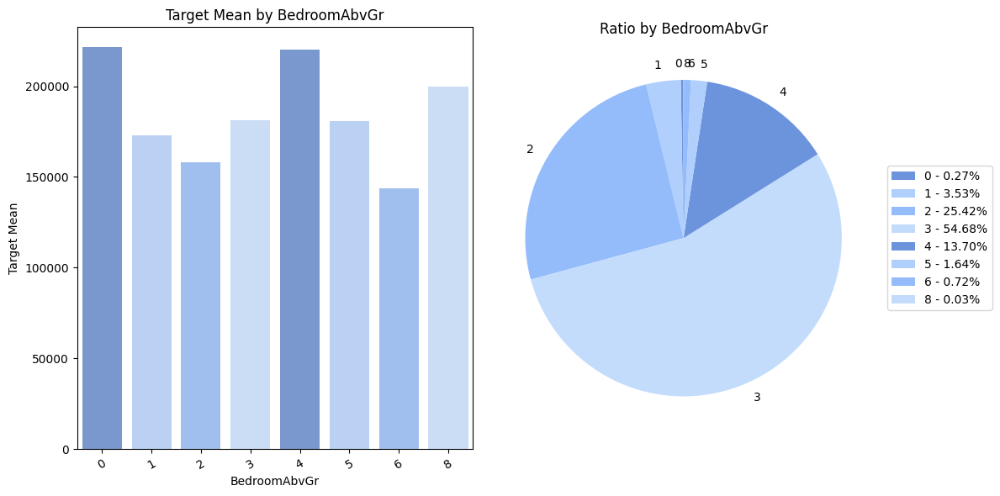

------------------------------------------------------------------------------------------------------------------------
KitchenAbvGr
------------------------------------------------------------------------------------------------------------------------
              Target Mean  Count  Ratio (%)
KitchenAbvGr                               
0              127500.000      3      0.103
1              183388.790   2785     95.409
2              131096.154    129      4.419
3              109500.000      2      0.069




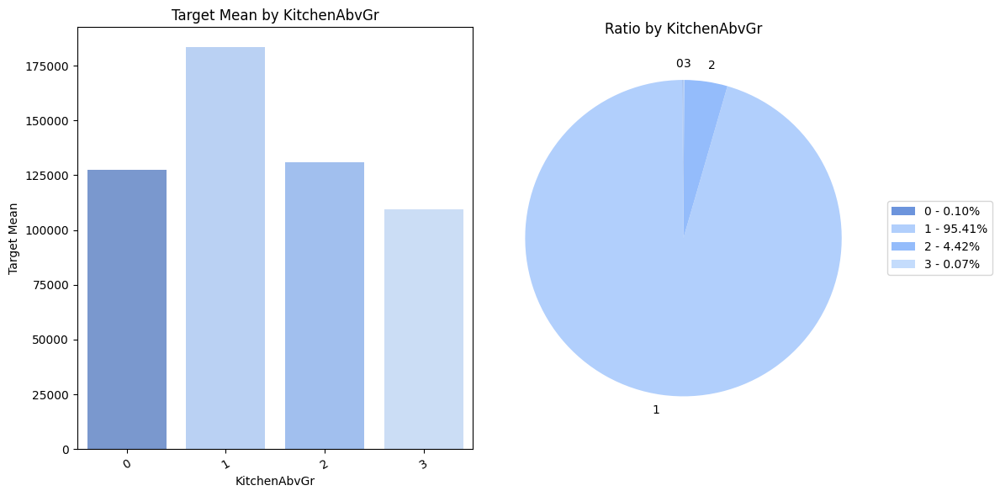

------------------------------------------------------------------------------------------------------------------------
Fireplaces
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
Fireplaces                               
0            141331.483   1420     48.647
1            211843.909   1268     43.440
2            240588.539    219      7.503
3            252000.000     11      0.377
4                   NaN      1      0.034




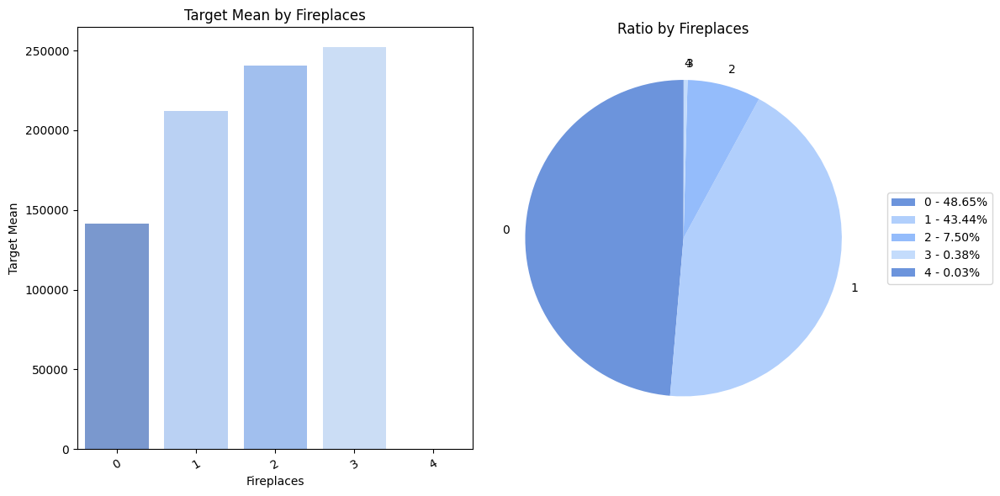

------------------------------------------------------------------------------------------------------------------------
GarageCars
------------------------------------------------------------------------------------------------------------------------
            Target Mean  Count  Ratio (%)
GarageCars                               
0.000        103317.284    157      5.379
1.000        128116.688    776     26.584
2.000        183851.664   1594     54.608
3.000        309636.122    374     12.813
4.000        192655.800     16      0.548
5.000               NaN      1      0.034




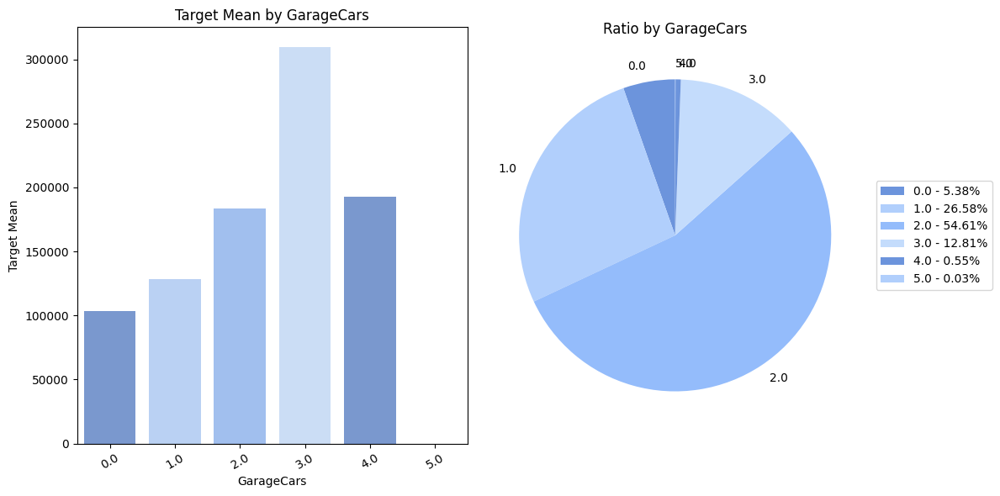

------------------------------------------------------------------------------------------------------------------------
YrSold
------------------------------------------------------------------------------------------------------------------------
        Target Mean  Count  Ratio (%)
YrSold                               
2006     182549.459    619     21.206
2007     186063.152    692     23.707
2008     177360.839    622     21.309
2009     179432.104    647     22.165
2010     177393.674    339     11.614




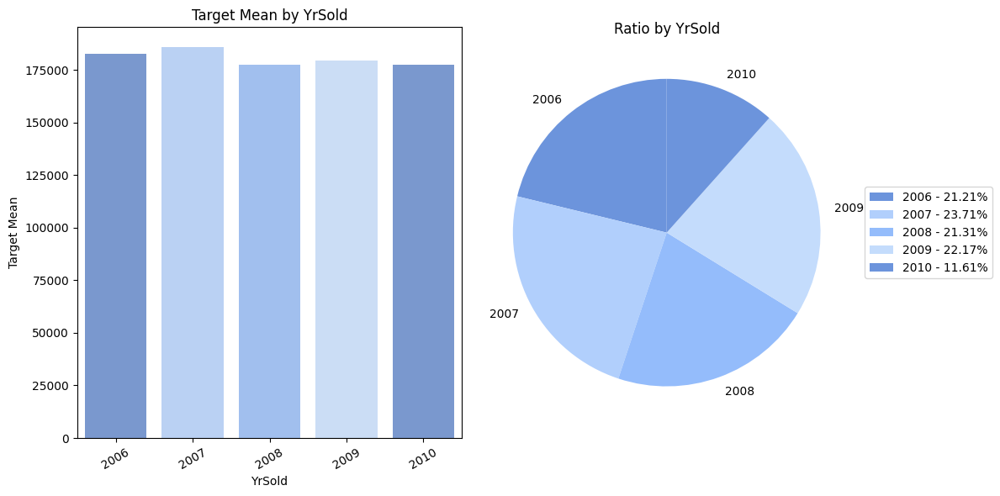

In [15]:
for col in cat_cols:
    cat_by_target(df, 'SalePrice', col, plot=True)

### Analysis of Numerical Variables by Target
Function to compare the means of numerical columns by the target variable.

In [16]:
def num_by_target (df, target):
    df[target].hist(bins=100, alpha=0.7, color='#6c94dc')

    plt.title('Distribution of SalePrice')
    plt.xlabel('SalePrice')
    plt.ylabel('Frequency')
    plt.show()                  

To execute the function for each numerical column.

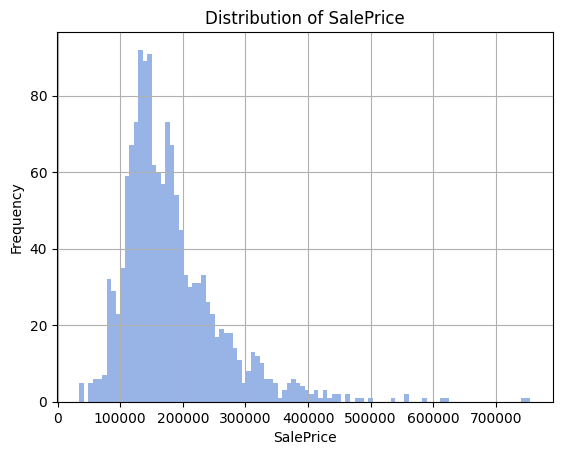

In [17]:
num_by_target(df, 'SalePrice')

# CORRELATION ANALYSIS
Display the correlation matrix for numerical variables.

In [18]:
def corr_by_num(df, target, n_cols, plot=False):
    num_df = df[n_cols]
    corr_matrix = num_df.corr()
    print('-' * 80)

    corr_with_tar = num_df.corrwith(df[target]).sort_values(ascending=False)
    highest_corr = corr_with_tar.drop(target).idxmax()
    highest_corr_value = corr_with_tar[highest_corr]
    print(f'Highest Correlation: {highest_corr} ({highest_corr_value})')
    print('-' * 80)

    if plot:
        custom_cmap = LinearSegmentedColormap.from_list('custom', ['#eaf2fe', '#6C94DC'])
        plt.figure(figsize=[20, 15])
        sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap=custom_cmap,
                    linewidths=.5,linecolor='black', cbar_kws={'label': 'Scale'})
        plt.title('Correlation Matrix:', fontsize=20)
        plt.xticks(fontsize=7, rotation=40)
        plt.yticks(fontsize=7, rotation=0)
        plt.tight_layout()
        plt.show()

To analyze how each variable correlates with the target variable 'SalePrice'.

--------------------------------------------------------------------------------
Highest Correlation: OverallQual (0.7909816005838044)
--------------------------------------------------------------------------------


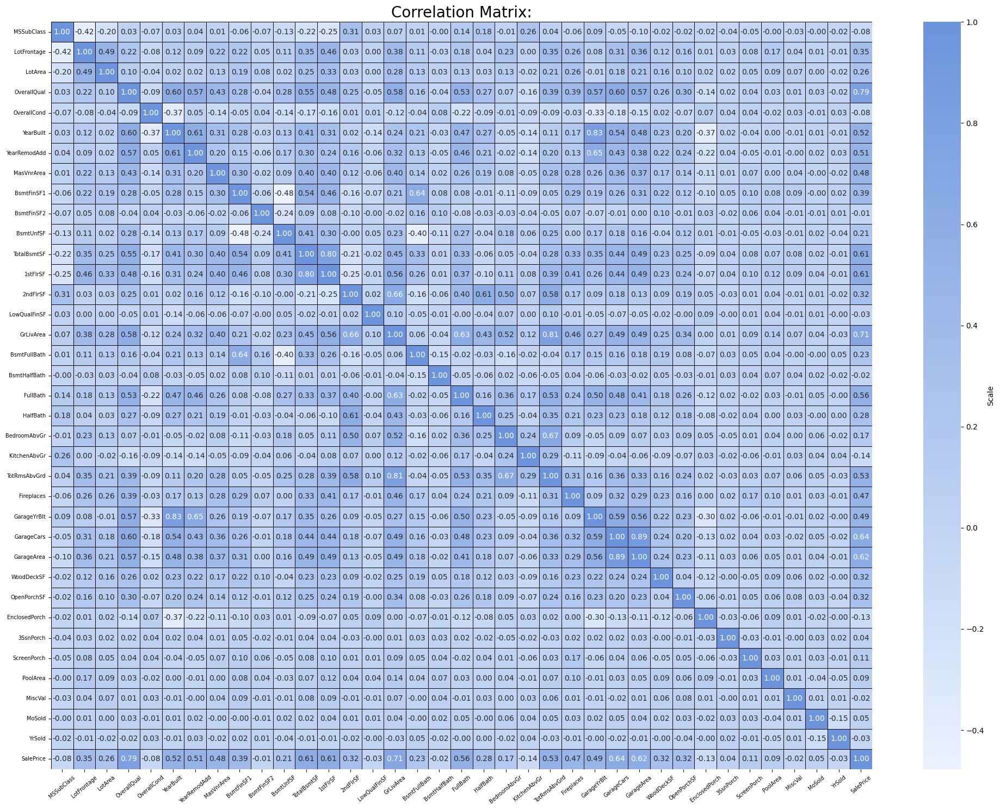

In [19]:
num_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist() # to get all numerical 
corr_by_num(df, 'SalePrice', num_cols, plot=True)

# OUTLIER ANALYSIS
Function to calculate outlier thresholds.

In [20]:
def outlier_thresholds(df, col_name, q1=0.05, q3=0.95):
    quartile1 = df[col_name].quantile(q1)
    quartile3 = df[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

Function to check for outliers in a column.

In [21]:
def check_outlier(df, col_name):
    low_limit, up_limit = outlier_thresholds(df, col_name)
    if df[(df[col_name] > up_limit) | (df[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

To analyze outliers for numerical columns.

In [22]:
for col in num_cols:
    print(col, check_outlier(df, col))

MSSubClass False
LotFrontage True
LotArea True
OverallQual False
OverallCond False
YearBuilt False
YearRemodAdd False
MasVnrArea True
BsmtFinSF1 True
BsmtFinSF2 True
BsmtUnfSF False
TotalBsmtSF True
1stFlrSF True
2ndFlrSF False
LowQualFinSF True
GrLivArea True
BsmtFullBath True
BsmtHalfBath False
FullBath True
HalfBath False
BedroomAbvGr True
KitchenAbvGr True
TotRmsAbvGrd False
Fireplaces False
GarageYrBlt True
GarageCars False
GarageArea False
WoodDeckSF True
OpenPorchSF True
EnclosedPorch True
3SsnPorch True
ScreenPorch True
PoolArea True
MiscVal True
MoSold False
YrSold False
SalePrice True


Our dataset has some outliers.

For this reason, We'll suppress outliers with the following function.

In [23]:
def replace_with_thresholds(df, variable):
    low_limit, up_limit = outlier_thresholds(df, variable)
    df.loc[(df[variable] < low_limit), variable] = low_limit
    df.loc[(df[variable] > up_limit), variable] = up_limit

In [24]:
for col in num_cols:
    if col != 'SalePrice':
        replace_with_thresholds(df, col)

In [25]:
for col in num_cols:
    print(col, check_outlier(df, col))

MSSubClass False
LotFrontage False
LotArea False
OverallQual False
OverallCond False
YearBuilt False
YearRemodAdd False
MasVnrArea False
BsmtFinSF1 False
BsmtFinSF2 False
BsmtUnfSF False
TotalBsmtSF False
1stFlrSF False
2ndFlrSF False
LowQualFinSF False
GrLivArea False
BsmtFullBath False
BsmtHalfBath False
FullBath False
HalfBath False
BedroomAbvGr False
KitchenAbvGr False
TotRmsAbvGrd False
Fireplaces False
GarageYrBlt False
GarageCars False
GarageArea False
WoodDeckSF False
OpenPorchSF False
EnclosedPorch False
3SsnPorch False
ScreenPorch False
PoolArea False
MiscVal False
MoSold False
YrSold False
SalePrice True


# MISSING VALUES ANALYSIS
Function to create a summary table of missing values in the dataframe.

In [26]:
df.isnull().sum() # to check for any missing values in the dataset.

MSSubClass          0
MSZoning            4
LotFrontage       486
LotArea             0
Street              0
Alley            2721
LotShape            0
LandContour         0
Utilities           2
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         1
Exterior2nd         1
MasVnrType       1766
MasVnrArea         23
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           81
BsmtCond           82
BsmtExposure       82
BsmtFinType1       79
BsmtFinSF1          1
BsmtFinType2       80
BsmtFinSF2          1
BsmtUnfSF           1
TotalBsmtSF         1
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea 

In [27]:
def missing_values_table(df, na_name=False):
    na_columns = [col for col in df.columns if df[col].isnull().sum() > 0]
    n_miss = df[na_columns].isnull().sum().sort_values(ascending=False)
    ratio = (df[na_columns].isnull().sum() / df.shape[0] * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_miss, np.round(ratio, 2)], axis=1, keys=['n_miss', 'ratio'])
    print(missing_df, end='\n')
    if na_name:
        return na_columns

To execute the function to display the missing values table.

In [28]:
na_columns = missing_values_table(df, na_name=True)
df[na_columns].describe().T

              n_miss  ratio
PoolQC          2909 99.660
MiscFeature     2814 96.400
Alley           2721 93.220
Fence           2348 80.440
MasVnrType      1766 60.500
SalePrice       1459 49.980
FireplaceQu     1420 48.650
LotFrontage      486 16.650
GarageCond       159  5.450
GarageYrBlt      159  5.450
GarageFinish     159  5.450
GarageQual       159  5.450
GarageType       157  5.380
BsmtExposure      82  2.810
BsmtCond          82  2.810
BsmtQual          81  2.770
BsmtFinType2      80  2.740
BsmtFinType1      79  2.710
MasVnrArea        23  0.790
MSZoning           4  0.140
Functional         2  0.070
BsmtHalfBath       2  0.070
BsmtFullBath       2  0.070
Utilities          2  0.070
KitchenQual        1  0.030
TotalBsmtSF        1  0.030
BsmtUnfSF          1  0.030
GarageCars         1  0.030
GarageArea         1  0.030
BsmtFinSF2         1  0.030
BsmtFinSF1         1  0.030
Exterior2nd        1  0.030
Exterior1st        1  0.030
SaleType           1  0.030
Electrical         1

,count,mean,std,min,25%,50%,75%,max
LotFrontage,2433.000,69.229,22.687,21.000,59.000,68.000,80.000,219.500
MasVnrArea,2896.000,101.895,177.255,0.000,0.000,0.000,164.000,1166.250
BsmtFinSF1,2918.000,440.298,446.202,0.000,0.000,368.500,733.000,3185.000
BsmtFinSF2,2918.000,49.144,166.037,0.000,0.000,0.000,0.000,1087.500
BsmtUnfSF,2918.000,560.772,439.544,0.000,220.000,467.000,805.500,2336.000
TotalBsmtSF,2918.000,1050.513,430.020,0.000,793.000,989.500,1302.000,3757.500
BsmtFullBath,2917.000,0.430,0.523,0.000,0.000,0.000,1.000,2.500
BsmtHalfBath,2917.000,0.061,0.246,0.000,0.000,0.000,0.000,2.000
GarageYrBlt,2760.000,1978.084,25.356,1895.000,1960.000,1979.000,2002.000,2125.500
GarageCars,2918.000,1.767,0.762,0.000,1.000,2.000,2.000,5.000


Function to fill out some missing values with 'No'.

In [29]:
def fill_with_no(df, na_cols):
    for col in na_cols:
        df[col].fillna((f'No'), inplace=True)

In [30]:
some_na_cols = ['Alley', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu',
            'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']

fill_with_no(df, some_na_cols)

In [31]:
df[some_na_cols].describe().T

,count,unique,top,freq
Alley,2919,3,No,2721
BsmtQual,2919,5,TA,1283
BsmtCond,2919,5,TA,2606
BsmtExposure,2919,4,No,1986
BsmtFinType1,2919,7,Unf,851
BsmtFinType2,2919,7,Unf,2493
FireplaceQu,2919,6,No,1420
GarageType,2919,7,Attchd,1723
GarageFinish,2919,4,Unf,1230
GarageQual,2919,6,TA,2604


Function to fill out the rest of missing values.

In [32]:
 missing_values_table(df, na_name=True)

              n_miss  ratio
MasVnrType      1766 60.500
SalePrice       1459 49.980
LotFrontage      486 16.650
GarageYrBlt      159  5.450
MasVnrArea        23  0.790
MSZoning           4  0.140
BsmtFullBath       2  0.070
BsmtHalfBath       2  0.070
Functional         2  0.070
Utilities          2  0.070
Exterior2nd        1  0.030
BsmtFinSF1         1  0.030
BsmtFinSF2         1  0.030
BsmtUnfSF          1  0.030
Exterior1st        1  0.030
Electrical         1  0.030
KitchenQual        1  0.030
GarageCars         1  0.030
GarageArea         1  0.030
SaleType           1  0.030
TotalBsmtSF        1  0.030


['MSZoning',
 'LotFrontage',
 'Utilities',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'Electrical',
 'BsmtFullBath',
 'BsmtHalfBath',
 'KitchenQual',
 'Functional',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'SaleType',
 'SalePrice']

In [33]:
def quick_missing_imp(data, num_method='median', cat_length=20, target='SalePrice'):
    variables_with_na = [col for col in data.columns if data[col].isnull().sum() > 0]
    temp_target = data[target]
    print('--BEFORE--')
    print(data[variables_with_na].isnull().sum(), '\n\n')
    data = data.apply(lambda x: x.fillna(x.mode()[0]) if (x.dtype == 'O' and len(x.unique()) <= cat_length) else x, axis=0)
    if num_method == 'mean':
        data = data.apply(lambda x: x.fillna(x.mean()) if x.dtype != 'O' else x, axis=0)
    elif num_method == 'median':
        data = data.apply(lambda x: x.fillna(x.median()) if x.dtype != 'O' else x, axis=0)
    data[target] = temp_target
    print("--AFTER-- \n Imputation method is 'MODE' for categorical variables!")
    print(" Imputation method is '" + num_method.upper() + "' for numeric variables! \n")
    print(data[variables_with_na].isnull().sum(), "\n\n")
    return data

df = quick_missing_imp(df, num_method='median', cat_length=17)


--BEFORE--
MSZoning           4
LotFrontage      486
Utilities          2
Exterior1st        1
Exterior2nd        1
MasVnrType      1766
MasVnrArea        23
BsmtFinSF1         1
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
Electrical         1
BsmtFullBath       2
BsmtHalfBath       2
KitchenQual        1
Functional         2
GarageYrBlt      159
GarageCars         1
GarageArea         1
SaleType           1
SalePrice       1459
dtype: int64 


--AFTER-- 
 Imputation method is 'MODE' for categorical variables!
 Imputation method is 'MEDIAN' for numeric variables! 

MSZoning           0
LotFrontage        0
Utilities          0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         0
BsmtFinSF1         0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Electrical         0
BsmtFullBath       0
BsmtHalfBath       0
KitchenQual        0
Functional         0
GarageYrBlt        0
GarageCars         0
GarageArea         0
SaleType  

To verify if missing values have been addressed.

In [34]:
df.isnull().any() #to check

MSSubClass       False
MSZoning         False
LotFrontage      False
LotArea          False
Street           False
Alley            False
LotShape         False
LandContour      False
Utilities        False
LotConfig        False
LandSlope        False
Neighborhood     False
Condition1       False
Condition2       False
BldgType         False
HouseStyle       False
OverallQual      False
OverallCond      False
YearBuilt        False
YearRemodAdd     False
RoofStyle        False
RoofMatl         False
Exterior1st      False
Exterior2nd      False
MasVnrType       False
MasVnrArea       False
ExterQual        False
ExterCond        False
Foundation       False
BsmtQual         False
BsmtCond         False
BsmtExposure     False
BsmtFinType1     False
BsmtFinSF1       False
BsmtFinType2     False
BsmtFinSF2       False
BsmtUnfSF        False
TotalBsmtSF      False
Heating          False
HeatingQC        False
CentralAir       False
Electrical       False
1stFlrSF         False
2ndFlrSF   

In [35]:
cat_cols, num_cols, cat_but_car, num_but_cat = grab_col_names(df, car_th=25)

Observations: 2919
Variables: 80
cat_cols: 57
num_cols: 23
cat_but_car: 0
num_but_cat: 14


In [36]:
identify_check(df)

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Categorical : ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces', 'GarageCars', '3SsnPorch', 'PoolArea', 'MiscVal', 'YrSold']
--------------------------------

# RARE ANALYSIS
To analyze the relationship between rare categories with little impact and dependent variable.

In [37]:
def rare_analyser(df, target, c_cols):
    for col in c_cols:
        print(col, ':', len(df[col].value_counts()))
        print(pd.DataFrame({'Count': df[col].value_counts(),
                            'Ratio %': df[col].value_counts() / len(df),
                            'Target Mean': df.groupby(col)[target].mean()}), end='\n\n\n')

rare_analyser(df, 'SalePrice', cat_cols)

MSZoning : 5
          Count  Ratio %  Target Mean
MSZoning                             
C (all)      25    0.009    74528.000
FV          139    0.048   214014.062
RH           26    0.009   131558.375
RL         2269    0.777   191004.995
RM          460    0.158   126316.830


Street : 2
        Count  Ratio %  Target Mean
Street                             
Grvl       12    0.004   130190.500
Pave     2907    0.996   181130.539


Alley : 3
       Count  Ratio %  Target Mean
Alley                             
Grvl     120    0.041   122219.080
No      2721    0.932   183452.131
Pave      78    0.027   168000.585


LotShape : 4
          Count  Ratio %  Target Mean
LotShape                             
IR1         968    0.332   206101.665
IR2          76    0.026   239833.366
IR3          16    0.005   216036.500
Reg        1859    0.637   164754.818


LandContour : 4
             Count  Ratio %  Target Mean
LandContour                             
Bnk            117    0.040   1431

Detection of rare classes

In [38]:
def rare_encoder(df, rare_perc):
    temp_df = df.copy()
    
    rare_cols = [col for col in temp_df.columns if temp_df[col].dtype == 'O'
                    and (temp_df[col].value_counts() / len(temp_df) < rare_perc).any()]
    for var in rare_cols:
       
        tmp = temp_df[var].value_counts() / len(temp_df)
        rare_labels = tmp[tmp < rare_perc].index
       
        temp_df[var] = np.where(temp_df[var].isin(rare_labels), 'Rare', temp_df[var])
    return temp_df, rare_cols

In [39]:
rare_df, rare_cols = rare_encoder(df, 0.01)

In [40]:
print(rare_df.columns)

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu',
       'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch',
       '3SsnP

# Feature Engineering
### BASE MODEL
* Make a copy of the original dataframe for model training to preserve the original data and exclude the target variable 'SalePrice' from the list of categorical columns.
* Encoding steps required for our Base Model.

In [41]:

df_base= df.copy()

def label_encoder(df, binary_col):
    labelencoder = LabelEncoder()
    df[binary_col] = labelencoder.fit_transform(df[binary_col])
    return df

binary_cols = [col for col in df.columns if df[col].dtypes == 'O' and len(df[col].unique()) == 2]

for col in binary_cols:
    label_encoder(df_base, col)

def one_hot_encoder(df, categorical_cols, drop_first=False):
    df = pd.get_dummies(df, columns=categorical_cols, drop_first=drop_first, dtype=int)
    return df

df_base = one_hot_encoder(df_base, cat_cols, drop_first=True)
df_base.head()


,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_1,Alley_No,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_1,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_No,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_No,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No,MiscFeature_No,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,BsmtFullBath_1.0,BsmtFullBath_2.0,Bs

Model selection among various models for our base model.

In [42]:
train_base= df_base[df_base['SalePrice'].notnull()]
test_base = df_base[df_base['SalePrice'].isnull()]

y = train_base['SalePrice']
X = train_base.drop(['SalePrice'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=34)

models = [('LR', LinearRegression()),
          ('KNN', KNeighborsRegressor()),
          ('CART', DecisionTreeRegressor()),
          ('RF', RandomForestRegressor()),
          ('XGB', XGBRegressor()),
          ("LightGBM", LGBMRegressor(force_row_wise=True, verbose=-1)),
          ('CatBoost', CatBoostRegressor(verbose=False))]

for name, model in models:
    rmse = np.mean(np.sqrt(-cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')))    
    print(f"RMSE: {round(rmse, 4)} ({name})")

# print('-'*80)

# for name, model in models:
#     model.fit(X_train,y_train)
#     y_pred = model.predict(X_test)
#     mse = mean_squared_error(y_test,y_pred)
#     rmse = np.sqrt(mse)
#     print(f"RMSE: {round(rmse, 4)} ({name})")

RMSE: 54244.0311 (LR)
RMSE: 45971.5412 (KNN)
RMSE: 42701.7976 (CART)
RMSE: 30308.7604 (RF)
RMSE: 28270.4271 (XGB)
RMSE: 29054.2563 (LightGBM)
RMSE: 25472.6435 (CatBoost)


## Base Model Setup
I prefer the CatBoost model at this stage.

In [43]:
base_final_model = CatBoostRegressor(verbose=False, random_state=34).fit(X_train, y_train)
print(f"{'-' * 10} Base Model  {'-' * 10}")
print(f"RMSE: {round(rmse, 4)} (CatBoost)")

---------- Base Model  ----------
RMSE: 25472.6435 (CatBoost)


In [44]:
df_base.shape

(2919, 283)

## FEATURE IMPORTANCE
Function to check the most importance of features in the dataset.

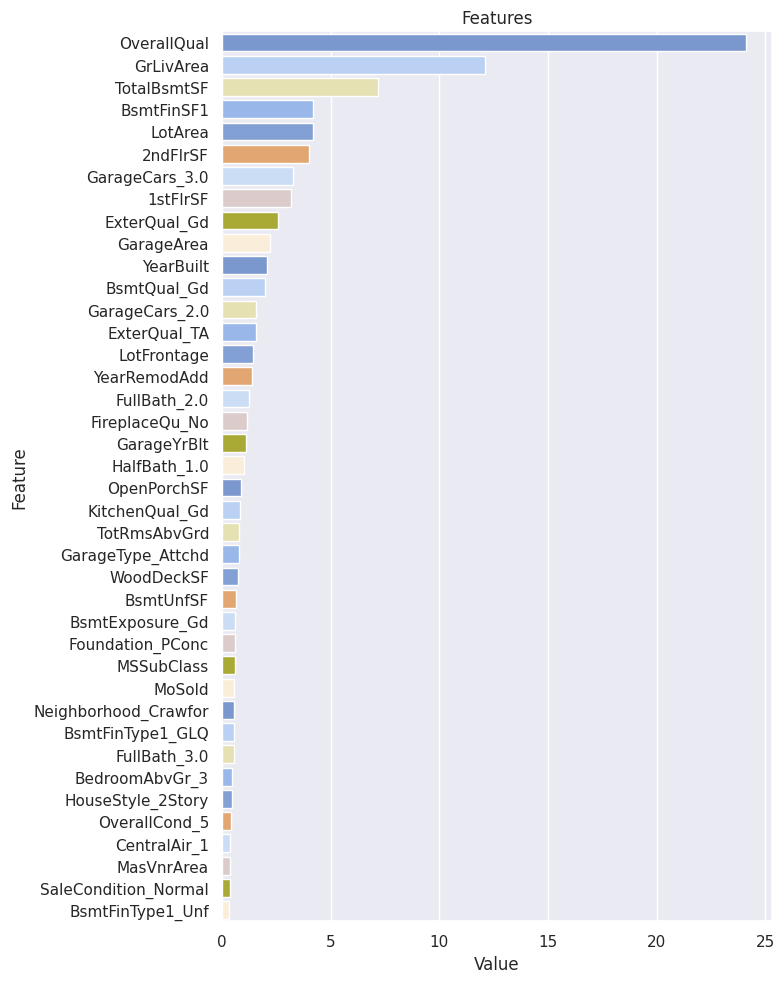

In [45]:
def plot_importance(model, features, df, save=False):
    num = len(df)
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(8, 10))
    sns.set_theme(font_scale=1)
    palette =palette = ['#6c94dc', '#b1cffc', '#eee8aa', '#8cb4f5', '#749ce2', '#f4a460', '#c4dcfc', '#DDCAC9', '#bcbd22', '#ffefd5']
    sns.barplot(x='Value', y='Feature', data=feature_imp.sort_values(by='Value', ascending=False)[0:40], palette=palette)
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')

plot_importance(base_final_model, X_train, df_base)

## FEATURE EXTRACTION
To create new features with columns.

In [46]:
def to_create_features(df):
    new_df = df.copy()

    # Calculate total floor area by summing the first and second floor areas
    new_df['NEW_TotalFlrSF'] = new_df['1stFlrSF'] + new_df['2ndFlrSF']

    # Calculate total basement finished area by summing the two basement finished areas
    new_df['NEW_TotalBsmtFin'] = new_df['BsmtFinSF1'] + new_df['BsmtFinSF2']

    # Calculate total porch area by summing all porch-related areas
    new_df['NEW_PorchArea'] = new_df['OpenPorchSF'] + new_df['EnclosedPorch'] + new_df['ScreenPorch'] + new_df['3SsnPorch'] + new_df['WoodDeckSF']

    # Calculate total house area by summing total floor area and total basement area
    new_df['NEW_TotalHouseArea'] = new_df['NEW_TotalFlrSF'] + new_df['TotalBsmtSF']

    # Calculate total square feet by summing above ground living area and total basement area
    new_df['NEW_TotalSqFeet'] = new_df['GrLivArea'] + new_df['TotalBsmtSF']

    # Calculate the ratio of ground living area to lot area
    new_df['NEW_LotRatio'] = new_df['GrLivArea'] / new_df['LotArea']

    # Calculate the ratio of total house area to lot area
    new_df['NEW_RatioArea'] = new_df['NEW_TotalHouseArea'] / new_df['LotArea']

    # Calculate overall grade by multiplying overall quality and overall condition
    new_df['NEW_OverallGrade'] = new_df['OverallQual'] * new_df['OverallCond']

    # Calculate years since the house was remodeled
    new_df['NEW_Restoration'] = new_df['YearRemodAdd'] - new_df['YearBuilt']

    # Calculate the age of the house
    new_df['NEW_HouseAge'] = new_df['YrSold'] - new_df['YearBuilt']

    # Calculate years since the house was remodeled at the time of sale
    new_df['NEW_RestorationAge'] = new_df['YrSold'] - new_df['YearRemodAdd']

    # Calculate years since the garage was built at the time of sale
    new_df['NEW_GarageSold'] = new_df['YrSold'] - new_df['GarageYrBlt']

    # Calculate total square footage by summing basement and both floor areas
    new_df['NEW_TotalSF'] = new_df['TotalBsmtSF'] + new_df['1stFlrSF'] + new_df['2ndFlrSF']

    # Calculate total number of bathrooms considering full and half baths
    new_df['NEW_TotalBath'] = new_df['FullBath'] + (0.5 * new_df['HalfBath']) + new_df['BsmtFullBath'] + (0.5 * new_df['BsmtHalfBath'])

    # Calculate total porch square footage by summing relevant areas
    new_df['NEW_TotalPorchSF'] = new_df['OpenPorchSF'] + new_df['EnclosedPorch'] + new_df['3SsnPorch'] + new_df['ScreenPorch']

    # Calculate the ratio of ground living area to the number of rooms above ground
    new_df['NEW_RoomPerArea'] = new_df['GrLivArea'] / new_df['TotRmsAbvGrd']

    # Create binary feature indicating if there is a pool
    new_df['NEW_HasPool'] = new_df['PoolQC'].apply(lambda x: 0 if pd.isnull(x) else 1)

    # Create binary feature indicating if there is a miscellaneous feature
    new_df['NEW_HasMiscFeature'] = new_df['MiscFeature'].apply(lambda x: 0 if pd.isnull(x) else 1)

    # Create binary feature indicating if there is an alley
    new_df['NEW_HasAlley'] = new_df['Alley'].apply(lambda x: 0 if pd.isnull(x) else 1)

    # Create binary feature indicating if there is a fence
    new_df['NEW_HasFence'] = new_df['Fence'].apply(lambda x: 0 if pd.isnull(x) else 1)

    # Create binary feature indicating if the house has central air conditioning
    new_df['NEW_HasCentralAir'] = new_df['CentralAir'].apply(lambda x: 1 if x == 'Y' else 0)

    # Create binary feature indicating if the house was sold in winter
    new_df['NEW_IsSoldInWinter'] = new_df['MoSold'].apply(lambda x: 1 if x in [12, 1, 2] else 0)

    # Create binary feature indicating if the house was sold in summer
    new_df['NEW_IsSoldInSummer'] = new_df['MoSold'].apply(lambda x: 1 if x in [6, 7, 8] else 0)

    # Calculate exterior score by summing mapped values of exterior quality and condition
    new_df['NEW_ExterScore'] = (new_df['ExterQual'].map({'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}) + new_df['ExterCond'].map({'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}))

    # Calculate the logarithm of ground living area
    new_df['NEW_LogGrLivArea'] = np.log1p(new_df['GrLivArea'])

    # Calculate the logarithm of sale price
    new_df['NEW_LogSalePrice'] = np.log1p(new_df['SalePrice'])

    # Normalize ground living area
    new_df['NEW_NormalizedGrLivArea'] = (new_df['GrLivArea'] - new_df['GrLivArea'].mean()) / new_df['GrLivArea'].std()

    # Normalize sale price
    new_df['NEW_NormalizedSalePrice'] = (new_df['SalePrice'] - new_df['SalePrice'].mean()) / new_df['SalePrice'].std()

    # Calculate the age of the house at the time of sale
    new_df['NEW_AgeAtSale'] = new_df['YrSold'] - new_df['YearBuilt']

    # Calculate years since the house was remodeled at the time of sale
    new_df['NEW_YearsSinceRemod'] = new_df['YrSold'] - new_df['YearRemodAdd']

    # Calculate overall quality score by multiplying overall quality and overall condition
    new_df['NEW_QualityScore'] = new_df['OverallQual'] * new_df['OverallCond']

    # Calculate total square footage by summing basement and both floor areas
    new_df['NEW_TotalSF'] = new_df['TotalBsmtSF'] + new_df['1stFlrSF'] + new_df['2ndFlrSF']

    return new_df

The variables we created are reflected in the dataset.

In [47]:
df = to_create_features(df)
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_LotRatio,NEW_RatioArea,NEW_OverallGrade,NEW_Restoration,NEW_HouseAge,NEW_RestorationAge,NEW_GarageSold,NEW_TotalSF,NEW_TotalBath,NEW_TotalPorchSF,NEW_RoomPerArea,NEW_HasPool,NEW_HasMiscFeature,NEW_HasAlley,NEW_HasFence,NEW_HasCentralAir,NEW_IsSoldInWinter,NEW_IsSoldInSummer,NEW_ExterScore,NEW_LogGrLivArea,NEW_LogSalePrice,NEW_NormalizedGrLivArea,NEW_NormalizedSalePrice,NEW_AgeAtSale,NEW_YearsSinceRemod,NEW_QualityScore
0,60,RL,65.000,8450.000,Pave,No,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2.000,1.000,3,1,Gd,8.000,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61.000,0,0,0.000,0,No,No,No,0,2.000,2008,WD,Normal,208500.000,1710.000,706.000,61.000,2566.000,2566.000,0.202,0.304,35,0.000,5,5.000,5.000,2566.000,3.500,61.000,213.750,1,1,1,1,1,1,0,7,7.445,12.248,0.416,0.347,5,5.000,35
1,20,RL,80.000,9600.000,Pave,No,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,BrkFace,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2.000,0.000,3,1,TA,6.000,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0.000,0,0,0.000,0,No,No,No,0,5.000,2007,WD,Normal,181500.000,1262.000,978.000,298.000,2524.000,2524.000,0.131,0.263,48,0.000,31,31.000,31.000,2524.000,2.500,0.000,210.333,1,1,1,1,1,0,0,6,7.141,12.109,-0.473,0.007,31,31.000,48
2,60,RL,68.000,11250.000,Pave,No,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2.000,1.000,3,1,Gd,6.000,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42.000,0,0,0.000,0,No,No,No,0,9.000,2008,WD,Normal,223500.000,1786.000,486.000,42.000,2706.000,2706.000,0.159,0.241,35,1.000,7,6.000,7.000,2706.000,3.500,42.000,297.667,1,1,1,1,1,0,0,7,7.488,12.317,0.567,0.536,7,6.000,35
3,70,RL,60.000,9550.000,Pave,No,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1.000,0.000,3,1,Gd,7.000,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35.000,272,0,0.000,0,No,No,No,0,2.000,2006,WD,Abnorml,140000.000,1717.000,216.000,307.000,2473.000,2473.000,0.180,0.259,35,55.000,91,36.000,8.000,2473.000,2.000,307.000,245.286,1,1,1,1,1,1,0,6,7.449,11.849,0.430,-0.515,91,36.000,35
4,60,RL,84.000,14260.000,Pave,No,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2.000,1.000,4,1,Gd,9.000,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84.000,0,0,0.000,

To check the dataset with new features.

In [48]:
cat_cols, num_cols, cat_but_car, num_but_cat = grab_col_names(df, car_th=25)

Observations: 2919
Variables: 111
cat_cols: 65
num_cols: 46
cat_but_car: 0
num_but_cat: 22


In [49]:
identify_check(df) 

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Categorical : ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces', 'GarageCars', '3SsnPorch', 'PoolArea', 'MiscVal', 'YrSold', 'NEW_HasPool', 'NEW_HasMiscFeatu

To find and delete highly correlated features..

In [50]:
def to_find_highly_corr_features(df, corr_th=0.90):
    
    corr = df.corr(numeric_only=True)
    cor_matrix = corr.abs()
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))
    
    highly_correlated_features = set()
    for col in upper_triangle_matrix.columns:
        if any(upper_triangle_matrix[col] > corr_th):
            highly_correlated_features.add(col)
    
    return list(highly_correlated_features)

In [51]:
df.drop(columns=to_find_highly_corr_features(df, corr_th=0.90), inplace=True)
df.shape

(2919, 96)

In [52]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,NEW_PorchArea,NEW_TotalHouseArea,NEW_LotRatio,NEW_OverallGrade,NEW_Restoration,NEW_TotalBath,NEW_TotalPorchSF,NEW_RoomPerArea,NEW_HasPool,NEW_HasMiscFeature,NEW_HasAlley,NEW_HasFence,NEW_HasCentralAir,NEW_IsSoldInWinter,NEW_IsSoldInSummer,NEW_ExterScore
0,60,RL,65.000,8450.000,Pave,No,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2.000,1.000,3,1,Gd,8.000,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61.000,0,0,0.000,0,No,No,No,0,2.000,2008,WD,Normal,208500.000,61.000,2566.000,0.202,35,0.000,3.500,61.000,213.750,1,1,1,1,1,1,0,7
1,20,RL,80.000,9600.000,Pave,No,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,BrkFace,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2.000,0.000,3,1,TA,6.000,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0.000,0,0,0.000,0,No,No,No,0,5.000,2007,WD,Normal,181500.000,298.000,2524.000,0.131,48,0.000,2.500,0.000,210.333,1,1,1,1,1,0,0,6
2,60,RL,68.000,11250.000,Pave,No,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2.000,1.000,3,1,Gd,6.000,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42.000,0,0,0.000,0,No,No,No,0,9.000,2008,WD,Normal,223500.000,42.000,2706.000,0.159,35,1.000,3.500,42.000,297.667,1,1,1,1,1,0,0,7
3,70,RL,60.000,9550.000,Pave,No,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1.000,0.000,3,1,Gd,7.000,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35.000,272,0,0.000,0,No,No,No,0,2.000,2006,WD,Abnorml,140000.000,307.000,2473.000,0.180,35,55.000,2.000,307.000,245.286,1,1,1,1,1,1,0,6
4,60,RL,84.000,14260.000,Pave,No,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2.000,1.000,4,1,Gd,9.000,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84.000,0,0,0.000,0,No,No,No,0,12.000,2008,WD,Normal,250000.000,276.000,3343.000,0.154,40,0.000,3.500,84.000,244.222,1,1,1,1,1,1,0,7


# ENCODING
### Label Encoding
Transforming binary categorical variables into a machine-readable format.

In [53]:
cat_cols, num_cols, cat_but_car, num_but_cat = grab_col_names(df, car_th=25)

Observations: 2919
Variables: 96
cat_cols: 65
num_cols: 31
cat_but_car: 0
num_but_cat: 22


In [54]:
def label_encoder(df, binary_col):
    labelencoder = LabelEncoder()
    df[binary_col] = labelencoder.fit_transform(df[binary_col])
    return df

binary_cols = [col for col in df.columns if df[col].dtypes == 'O' and df[col].nunique() == 2]

for col in binary_cols:
    df = label_encoder(df, col)

In [55]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,NEW_PorchArea,NEW_TotalHouseArea,NEW_LotRatio,NEW_OverallGrade,NEW_Restoration,NEW_TotalBath,NEW_TotalPorchSF,NEW_RoomPerArea,NEW_HasPool,NEW_HasMiscFeature,NEW_HasAlley,NEW_HasFence,NEW_HasCentralAir,NEW_IsSoldInWinter,NEW_IsSoldInSummer,NEW_ExterScore
0,60,RL,65.000,8450.000,1,No,Reg,Lvl,0,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,1,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2.000,1.000,3,1,Gd,8.000,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61.000,0,0,0.000,0,No,No,No,0,2.000,2008,WD,Normal,208500.000,61.000,2566.000,0.202,35,0.000,3.500,61.000,213.750,1,1,1,1,1,1,0,7
1,20,RL,80.000,9600.000,1,No,Reg,Lvl,0,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,BrkFace,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,1,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2.000,0.000,3,1,TA,6.000,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0.000,0,0,0.000,0,No,No,No,0,5.000,2007,WD,Normal,181500.000,298.000,2524.000,0.131,48,0.000,2.500,0.000,210.333,1,1,1,1,1,0,0,6
2,60,RL,68.000,11250.000,1,No,IR1,Lvl,0,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,1,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2.000,1.000,3,1,Gd,6.000,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42.000,0,0,0.000,0,No,No,No,0,9.000,2008,WD,Normal,223500.000,42.000,2706.000,0.159,35,1.000,3.500,42.000,297.667,1,1,1,1,1,0,0,7
3,70,RL,60.000,9550.000,1,No,IR1,Lvl,0,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,1,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1.000,0.000,3,1,Gd,7.000,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35.000,272,0,0.000,0,No,No,No,0,2.000,2006,WD,Abnorml,140000.000,307.000,2473.000,0.180,35,55.000,2.000,307.000,245.286,1,1,1,1,1,1,0,6
4,60,RL,84.000,14260.000,1,No,IR1,Lvl,0,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,1,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2.000,1.000,4,1,Gd,9.000,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84.000,0,0,0.000,0,No,No,No,0,12.000,2008,WD,Normal,250000.000,276.000,3343.000,0.154,40,0.000,3.500,84.000,244.222,1,1,1,1,1,1,0,7


# One-Hot Encoding
Transforming categorical variables with more than two categories into a machine-readable format.

In [56]:
cat_cols = [col for col in cat_cols if col not in binary_cols]

def one_hot_encoder(df, c_cols, drop_first=False):
    df = pd.get_dummies(df, columns=c_cols, drop_first=drop_first , dtype=int)
    return df


df = one_hot_encoder(df, cat_cols, drop_first=True)

In [57]:
df.head()

,MSSubClass,LotFrontage,LotArea,Street,Utilities,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,SalePrice,NEW_PorchArea,NEW_TotalHouseArea,NEW_LotRatio,NEW_OverallGrade,NEW_Restoration,NEW_TotalBath,NEW_TotalPorchSF,NEW_RoomPerArea,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_No,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_No,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_No,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No,MiscFeature_No,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,OverallCond_2,OverallCond_3,

In [58]:
df.shape

(2919, 301)

In [59]:
def rare_cols(df , rare_perc = 0.01):
    
    rare_cols = [col for col in df.columns if df[col].nunique() == 2 and
     (df[col].value_counts() / len(df) < rare_perc).any(axis=None)]
    
    df.drop(columns=rare_cols, axis=1, inplace=True)
    return rare_cols

In [60]:
rare_cols(df, rare_perc = 0.01)

['Street',
 'Utilities',
 'MSZoning_RH',
 'LotShape_IR3',
 'LotConfig_FR3',
 'LandSlope_Sev',
 'Neighborhood_Blueste',
 'Neighborhood_NPkVill',
 'Neighborhood_Veenker',
 'Condition1_PosA',
 'Condition1_RRAe',
 'Condition1_RRNe',
 'Condition1_RRNn',
 'Condition2_Feedr',
 'Condition2_PosA',
 'Condition2_PosN',
 'Condition2_RRAe',
 'Condition2_RRAn',
 'Condition2_RRNn',
 'HouseStyle_1.5Unf',
 'HouseStyle_2.5Fin',
 'HouseStyle_2.5Unf',
 'RoofStyle_Gambrel',
 'RoofStyle_Mansard',
 'RoofStyle_Shed',
 'RoofMatl_Membran',
 'RoofMatl_Metal',
 'RoofMatl_Roll',
 'RoofMatl_Tar&Grv',
 'RoofMatl_WdShake',
 'RoofMatl_WdShngl',
 'Exterior1st_AsphShn',
 'Exterior1st_BrkComm',
 'Exterior1st_CBlock',
 'Exterior1st_ImStucc',
 'Exterior1st_Stone',
 'Exterior2nd_AsphShn',
 'Exterior2nd_Brk Cmn',
 'Exterior2nd_CBlock',
 'Exterior2nd_ImStucc',
 'Exterior2nd_Other',
 'Exterior2nd_Stone',
 'ExterCond_Po',
 'Foundation_Stone',
 'Foundation_Wood',
 'BsmtCond_Po',
 'Heating_GasW',
 'Heating_Grav',
 'Heating_OthW',

In [61]:
df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,SalePrice,NEW_PorchArea,NEW_TotalHouseArea,NEW_LotRatio,NEW_OverallGrade,NEW_Restoration,NEW_TotalBath,NEW_TotalPorchSF,NEW_RoomPerArea,MSZoning_FV,MSZoning_RL,MSZoning_RM,Alley_No,Alley_Pave,LotShape_IR2,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LandSlope_Mod,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,Condition2_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_CompShg,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,Electrical_FuseF,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_No,GarageQual_TA,GarageCond_Fa,GarageCond_No,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_No,MiscFeature_No,MiscFeature_Shed,SaleType_New,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,BsmtFullBath_1.0,BsmtFullBath_2.0,BsmtHalfBath_1.0,FullBath_1.0,FullBath_2.0,FullBath_3.0,HalfBath_1.0,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,Fireplaces_1,Fireplaces_2,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010,NEW_HasCentralAir_1,NEW_IsSoldInWinter_1,NEW_IsSoldInSummer_1,NEW_ExterScore_5,NEW_ExterScore_6,NEW_ExterScore_7,NEW_ExterScore_8
0,60,65.000,8450.000,7,2003,2003.000,196.000,706.000,0.000,150.000,856.000,1,856.000,854.000,1710.000,8.000,2003.000,548.000,0,61.000,0,0.000,2.000,208500.000,61.000,2566.000,0.202,35,0.000,3.500,61.000,213.750,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,0
1,20,80.000,9600.000,6,1976,1976.000,0.000,978.000,0.000,284.000,1262.000,1,1262.000,0.000,1262.000,6

In [62]:
df.shape

(2919, 213)

# FEATURE SCALING
To express the observation units (numerical columns) on the same scale.

In [63]:
cat_cols, num_cols, cat_but_car, num_but_cat = grab_col_names(df, car_th=25)

num_cols = [col for col in num_cols if col not in ['SalePrice']]

print(f"Num_Cols : {num_cols}")

Observations: 2919
Variables: 213
cat_cols: 182
num_cols: 31
cat_but_car: 0
num_but_cat: 182
Num_Cols : ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'TotRmsAbvGrd', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'MoSold', 'NEW_PorchArea', 'NEW_TotalHouseArea', 'NEW_LotRatio', 'NEW_OverallGrade', 'NEW_Restoration', 'NEW_TotalBath', 'NEW_TotalPorchSF', 'NEW_RoomPerArea']


In [64]:
rscaler = RobustScaler()

df[num_cols] = rscaler.fit_transform(df[num_cols])

In [65]:
df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,SalePrice,NEW_PorchArea,NEW_TotalHouseArea,NEW_LotRatio,NEW_OverallGrade,NEW_Restoration,NEW_TotalBath,NEW_TotalPorchSF,NEW_RoomPerArea,MSZoning_FV,MSZoning_RL,MSZoning_RM,Alley_No,Alley_Pave,LotShape_IR2,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LandSlope_Mod,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,Condition2_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_CompShg,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,Electrical_FuseF,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_No,GarageQual_TA,GarageCond_Fa,GarageCond_No,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_No,MiscFeature_No,MiscFeature_Shed,SaleType_New,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,BsmtFullBath_1.0,BsmtFullBath_2.0,BsmtHalfBath_1.0,FullBath_1.0,FullBath_2.0,FullBath_3.0,HalfBath_1.0,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,Fireplaces_1,Fireplaces_2,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010,NEW_HasCentralAir_1,NEW_IsSoldInWinter_1,NEW_IsSoldInSummer_1,NEW_ExterScore_5,NEW_ExterScore_6,NEW_ExterScore_7,NEW_ExterScore_8
0,0.200,-0.167,-0.245,0.500,0.632,0.256,1.199,0.460,0.000,-0.542,-0.262,1,-0.442,1.213,0.431,1.000,0.608,0.266,0.000,0.500,0.000,0.000,-1.000,208500.000,-0.472,0.119,0.579,0.000,0.000,1.500,0.085,-0.215,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,0
1,-0.600,0.667,0.036,0.000,0.063,-0.436,0.000,0.832,0.000,-0.313,0.535,1,0.352,0.000,-0.295,0.000,-0.076,-0.0

# Modelling
## ML Model
We'll proceed to the steps of building a model.

Defining the 'y' target variable and the 'X' features for the model we want to use for

In [66]:
df_train = df[df['SalePrice'].notnull()]
df_test = df[df['SalePrice'].isnull()]

y = df_train['SalePrice']
X = df_train.drop(['SalePrice'], axis=1)

# ML Model Setup
We'll prefer the CatBoost model at this stage.

To facilitate comparison, We're setting the 'random_state' parameter to 34 for all of models.

In [67]:
catboost = CatBoostRegressor(verbose=False, random_state=34)

In [68]:
cb_params = {'iterations': [200, 300],
             'learning_rate': [0.01, 0.05],
             'depth': [4, 6, 8]}

In [69]:
cb_best = GridSearchCV(catboost,cb_params,cv=3,n_jobs=-1,verbose=True).fit(X, y)

Fitting 3 folds for each of 12 candidates, totalling 36 fits


In [70]:
cb_best

GridSearchCV(cv=3,
             estimator=<catboost.core.CatBoostRegressor object at 0x793f7eec8fa0>,
             n_jobs=-1,
             param_grid={'depth': [4, 6, 8], 'iterations': [200, 300],
                         'learning_rate': [0.01, 0.05]},
             verbose=True)

In [71]:
cb_best.best_params_

{'depth': 4, 'iterations': 300, 'learning_rate': 0.05}

# Final Model
Final model with most oft best hyperparameters.

In [72]:
final_model = catboost.set_params(**cb_best.best_params_).fit(X, y)

In [73]:
rmse = np.mean(np.sqrt(-cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')))

In [74]:
print(f"{'-' * 10} Final Model  {'-' * 10}")
print(f"RMSE: {round(rmse, 4)} (CatBoost)")

---------- Final Model  ----------
RMSE: 24885.4173 (CatBoost)


# FEATURE IMPORTANCE
Function to check the most importance of features in the dataset.

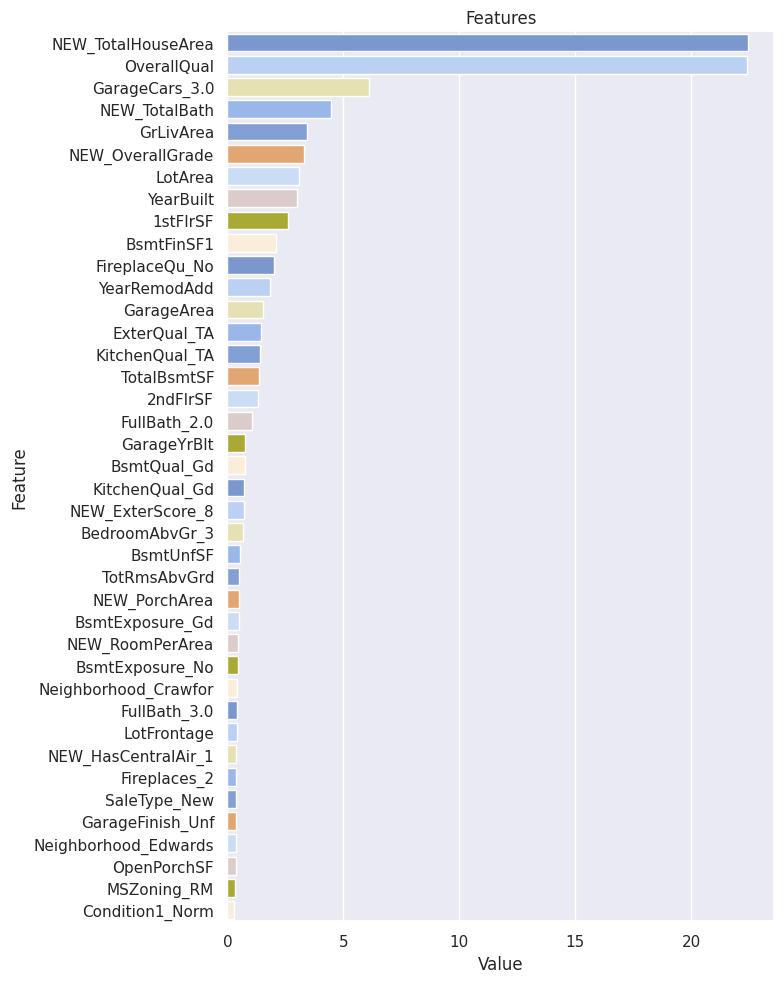

In [75]:
def plot_importance(model, features, df, save=False):
    num = len(df)
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(8, 10))
    sns.set_theme(font_scale=1)
    palette =palette = ['#6c94dc', '#b1cffc', '#eee8aa', '#8cb4f5', '#749ce2', '#f4a460', '#c4dcfc', '#DDCAC9', '#bcbd22', '#ffefd5']
    sns.barplot(x='Value', y='Feature', data=feature_imp.sort_values(by='Value', ascending=False)[0:40], palette=palette)
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')

plot_importance(final_model, X, df)

# PREDICTION

In [76]:
predictions = final_model.predict(df_test.drop(['SalePrice'], axis=1))

In [77]:
predictions

array([123274.19167785, 163748.57291169, 177188.71516325, ...,
       163297.73459789, 122074.95380624, 228701.7392579 ])

# SUBMISSION

In [78]:
dictionary = {'Id':test['Id'], 'SalePrice':predictions}
dfSubmission = pd.DataFrame(dictionary)

dfSubmission.head(20)

,Id,SalePrice
0,1461,123274.192
1,1462,163748.573
2,1463,177188.715
3,1464,186369.238
4,1465,195335.564
5,1466,169562.958
6,1467,179060.695
7,1468,159258.861
8,1469,195228.900
9,1470,117760.496


In [79]:
dfSubmission.to_csv('submission.csv', index=False)

# Conclusion
In this notebook, we successfully predicted house prices with a low RMSE using CatBoostRegressor